In [1]:
setwd("/data2/core-med1/nhadizad/nastaran/Xenotransplant/global/NEW_cellchat/NEW_Pseudobulk/PCMV_vs_standard/Results")

In [3]:
# 1. Load Packages --------------------------------------------------------
suppressMessages({
  library(CellChat)
  library(ggplot2)
  library(patchwork)
  library(scales) # For color generation

library(Seurat)
library(dplyr)
library(Matrix)
library(zellkonverter)
library(SingleCellExperiment)
library(CellChat)
library(patchwork)
library(ggplot2)
library(future)

  library(CellChat)
  library(ggplot2)
  library(patchwork)
  library(scales)
  library(Seurat)
})


library(stringr) #deal with string
options(stringsAsFactors = FALSE)
options(future.globals.maxSize = 10 * 1024^3)  

# 1. Set up parallelization and load object  ======
plan("multicore", workers = 10)


In [4]:
seurat_standard <- readRDS("/data2/core-med1/nhadizad/nastaran/Xenotransplant/global/NEW_cellchat/seurat_fractions/CC_prepared_Standard_protocol.rds")

seurat_pcmv <- readRDS("/data2/core-med1/nhadizad/nastaran/Xenotransplant/global/NEW_cellchat/seurat_fractions/CC_prepared_PCMV.rds")


In [5]:
library(Seurat)
library(Matrix)
library(dplyr)
library(tibble)

seurat_obj <- seurat_standard   # or seurat_rejection
sample_col <- "Sample_ID"
celltype_col <- "cell_type"
condition_label <- "Standard_protocol"  # Or "Rejection"
outdir <- "pseudobulk_by_celltype_Standard_protocol/"
if (!dir.exists(outdir)) dir.create(outdir)

celltype_list <- unique(seurat_obj@meta.data[[celltype_col]])

for (celltype_of_interest in celltype_list) {
  meta <- seurat_obj@meta.data
  samples <- unique(meta[[sample_col]])
  pseudobulk_counts <- list()
  
  for (s in samples) {
    these_cells <- rownames(meta)[meta[[sample_col]] == s & meta[[celltype_col]] == celltype_of_interest]
    cat("Cell type:", celltype_of_interest, "- Sample", s, "has", length(these_cells), "cells\n")
    if (length(these_cells) == 0) next
    # Use layer = "counts" for Seurat v5
    mat <- GetAssayData(seurat_obj, layer = "data")[, these_cells, drop = FALSE]
    # If mat is sparse, convert to matrix for rowSums
    if (!is.matrix(mat)) mat <- as.matrix(mat)
    counts <- Matrix::rowSums(mat)
    pseudobulk_counts[[s]] <- counts
  }
  
  if (length(pseudobulk_counts) == 0) next
  
  pseudobulk_df <- as.data.frame(do.call(cbind, pseudobulk_counts))
  pseudobulk_df <- rownames_to_column(pseudobulk_df, "gene")
  
  write.csv(
    pseudobulk_df,
    file = file.path(outdir, paste0("pseudobulk_", gsub("[ /]", "_", celltype_of_interest), "_", condition_label, "_bysample.csv")),
    row.names = FALSE
  )
}



Attaching package: ‘tibble’


The following object is masked from ‘package:igraph’:

    as_data_frame




Cell type: CM - Sample PAV66 has 8785 cells


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.7 GiB”


Cell type: CM - Sample PAV82 has 8215 cells


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.5 GiB”


Cell type: CM - Sample PAV75 has 4546 cells


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.4 GiB”


Cell type: CM - Sample PAV65 has 3536 cells


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.1 GiB”


Cell type: CM - Sample PAV67 has 7125 cells


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.2 GiB”


Cell type: CM - Sample PAV69 has 9389 cells


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


Cell type: CM - Sample PAV80 has 6108 cells


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.9 GiB”


Cell type: Vascular EC - Sample PAV66 has 445 cells
Cell type: Vascular EC - Sample PAV82 has 201 cells
Cell type: Vascular EC - Sample PAV75 has 226 cells
Cell type: Vascular EC - Sample PAV65 has 518 cells
Cell type: Vascular EC - Sample PAV67 has 296 cells
Cell type: Vascular EC - Sample PAV69 has 168 cells
Cell type: Vascular EC - Sample PAV80 has 101 cells
Cell type: Fibroblasts - Sample PAV66 has 256 cells
Cell type: Fibroblasts - Sample PAV82 has 551 cells
Cell type: Fibroblasts - Sample PAV75 has 421 cells
Cell type: Fibroblasts - Sample PAV65 has 605 cells
Cell type: Fibroblasts - Sample PAV67 has 1639 cells
Cell type: Fibroblasts - Sample PAV69 has 377 cells
Cell type: Fibroblasts - Sample PAV80 has 743 cells
Cell type: Endocardial/lymphatic EC - Sample PAV66 has 22 cells
Cell type: Endocardial/lymphatic EC - Sample PAV82 has 127 cells
Cell type: Endocardial/lymphatic EC - Sample PAV75 has 34 cells
Cell type: Endocardial/lymphatic EC - Sample PAV65 has 74 cells
Cell type: End

In [6]:
library(Seurat)
library(Matrix)
library(dplyr)
library(tibble)

# Use your REJECTION object and set label
seurat_obj <- seurat_pcmv
sample_col <- "Sample_ID"
celltype_col <- "cell_type"
condition_label <- "pcmv"  # <-- Change here!
outdir <- "pseudobulk_by_celltype_PCMV/"
if (!dir.exists(outdir)) dir.create(outdir)

celltype_list <- unique(seurat_obj@meta.data[[celltype_col]])

for (celltype_of_interest in celltype_list) {
  meta <- seurat_obj@meta.data
  samples <- unique(meta[[sample_col]])
  pseudobulk_counts <- list()
  
  for (s in samples) {
    these_cells <- rownames(meta)[meta[[sample_col]] == s & meta[[celltype_col]] == celltype_of_interest]
    cat("Cell type:", celltype_of_interest, "- Sample", s, "has", length(these_cells), "cells\n")
    if (length(these_cells) == 0) next
    # Use layer = "counts" for Seurat v5
    mat <- GetAssayData(seurat_obj, layer = "data")[, these_cells, drop = FALSE]
    if (!is.matrix(mat)) mat <- as.matrix(mat)
    counts <- Matrix::rowSums(mat)
    pseudobulk_counts[[s]] <- counts
  }
  
  if (length(pseudobulk_counts) == 0) next
  
  pseudobulk_df <- as.data.frame(do.call(cbind, pseudobulk_counts))
  pseudobulk_df <- rownames_to_column(pseudobulk_df, "gene")
  
  write.csv(
    pseudobulk_df,
    file = file.path(outdir, paste0("pseudobulk_", gsub("[ /]", "_", celltype_of_interest), "_", condition_label, "_bysample.csv")),
    row.names = FALSE
  )
}


Cell type: Fibroblasts - Sample PAV68 has 128 cells
Cell type: Fibroblasts - Sample PAV73 has 442 cells
Cell type: Fibroblasts - Sample PAV74 has 518 cells
Cell type: CM - Sample PAV68 has 5376 cells


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.6 GiB”


Cell type: CM - Sample PAV73 has 4916 cells


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.5 GiB”


Cell type: CM - Sample PAV74 has 2304 cells
Cell type: Vascular EC - Sample PAV68 has 19 cells
Cell type: Vascular EC - Sample PAV73 has 609 cells
Cell type: Vascular EC - Sample PAV74 has 370 cells
Cell type: Endocardial/lymphatic EC - Sample PAV68 has 3 cells
Cell type: Endocardial/lymphatic EC - Sample PAV73 has 70 cells
Cell type: Endocardial/lymphatic EC - Sample PAV74 has 49 cells
Cell type: Mural cells - Sample PAV68 has 27 cells
Cell type: Mural cells - Sample PAV73 has 221 cells
Cell type: Mural cells - Sample PAV74 has 178 cells
Cell type: Neuronal cells - Sample PAV68 has 2 cells
Cell type: Neuronal cells - Sample PAV73 has 24 cells
Cell type: Neuronal cells - Sample PAV74 has 27 cells
Cell type: Resident Immune - Sample PAV68 has 6 cells
Cell type: Resident Immune - Sample PAV73 has 156 cells
Cell type: Resident Immune - Sample PAV74 has 79 cells
Cell type: Myeloids (baboon) - Sample PAV68 has 2 cells
Cell type: Myeloids (baboon) - Sample PAV73 has 70 cells
Cell type: Myelo

Warning message in wilcox.test.default(c(0, 0, 0, 0, 4.71275743437485, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 4.71275743437485, 0, 0), c(0, :
“cannot compute exact p-value with ties”


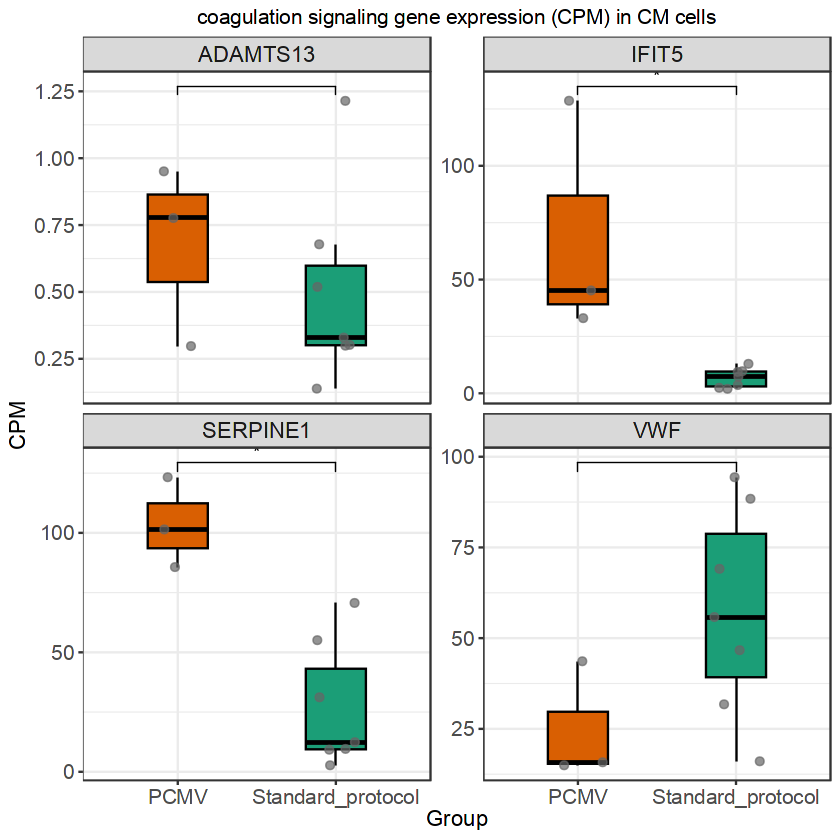

Warning message in wilcox.test.default(c(0, 0, 2.40544207214402, 0, 0.742978757865823, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 2.40544207214402, 0, 0.742978757865823, :
“cannot compute exact p-value with ties”


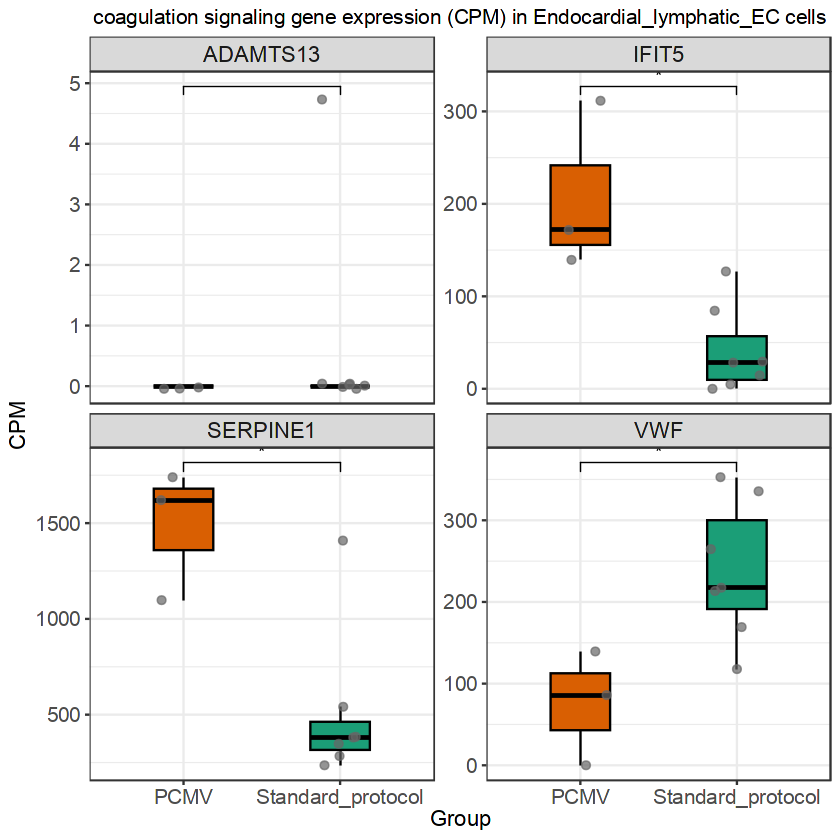

Warning message in wilcox.test.default(c(5.68317439388945, 9.66800085078408, 25.4199373652743, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 19.3360017015682, 0, 19.0629904748591, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 11.6395465232675, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.68317439388945, 19.3360017015682, 5.08398747305487, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.68317439388945, 9.66800085078408, 25.4199373652743, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 19.3360017015682, 0, 19.0629904748591, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 11.6395465232675, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.68317439388945, 19.3360017015682, 5.083

In [ ]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_pcmv <- "pseudobulk_by_celltype_PCMV/"
plotdir <- "coagulation/" # Changed plot directory
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_pcmv <- list.files(outdir_pcmv, pattern = "_pcmv_bysample.csv$") # Changed pattern

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_pcmv_bysample.csv$", "\\1", celltype_list_pcmv) # Changed pattern
)

genes_of_interest <- c("Serpine1", "VWF", "IFIT5", "ADAMTS13") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_pcmv <- read.csv( # Changed object name
    file.path(outdir_pcmv, paste0("pseudobulk_", celltype, "_pcmv_bysample.csv")), # Changed directory and label
    row.names = 1
  )
  colnames(pseudo_pcmv) <- paste0(colnames(pseudo_pcmv), "_PCMV") # Changed column names
  
  all_pseudo <- cbind(pseudo_pp, pseudo_pcmv) # Changed object name
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Subset to genes of interest (case-insensitive)
  genes_present <- rownames(pseudo_cpm)[toupper(rownames(pseudo_cpm)) %in% toupper(genes_of_interest)]
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  if (nrow(sub_cpm) == 0) next
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_PCMV$", df_long$sample), "PCMV", # Changed label
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_PCMV|_Standard_protocol)$", "", df_long$sample) # Changed regex
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "PCMV" = "#d95f02")) + # Changed label
    labs(title = paste0("coagulation signaling gene expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "PCMV")), # Changed label
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("Pseudobulk_", celltype, "_PCMV_vs_Standard.pdf")), # Changed filename
    plot = p, width = 8, height = 7
  )
}

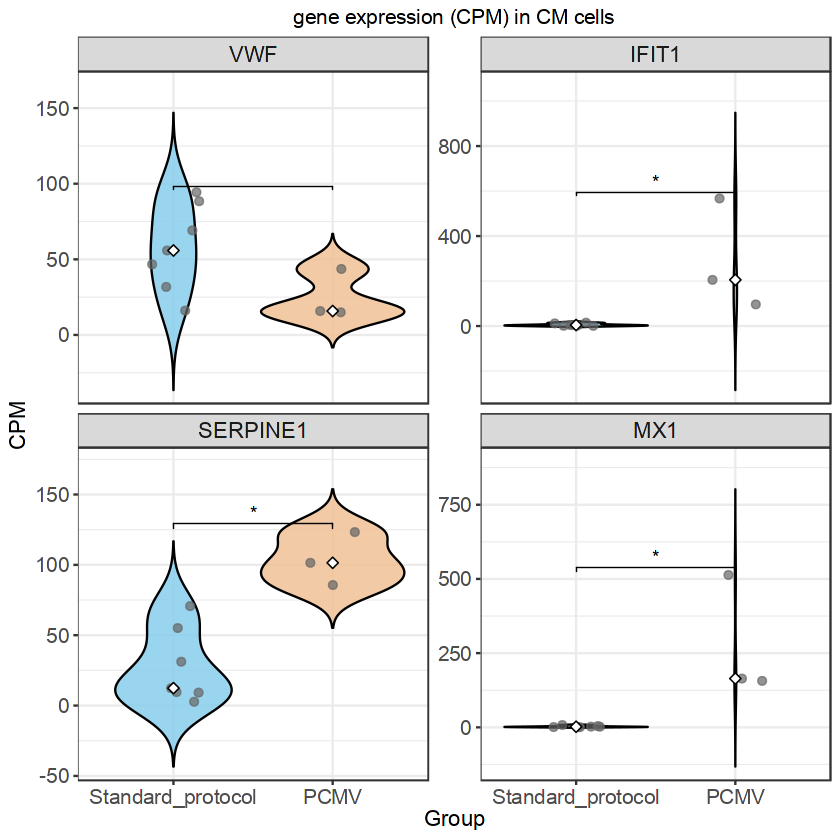

Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”


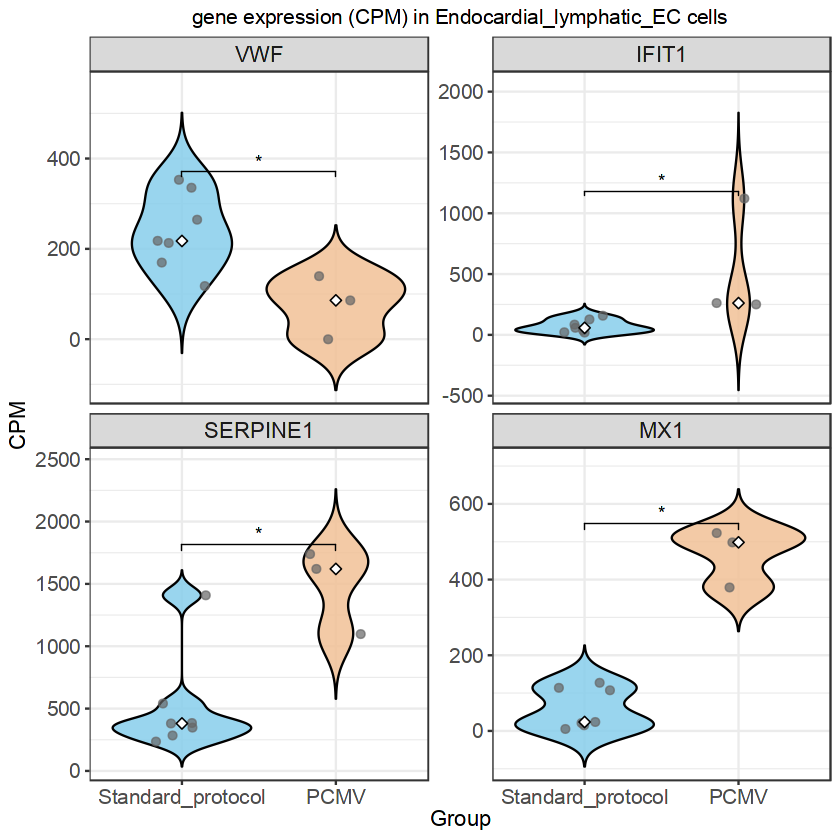

Warning message in wilcox.test.default(c(5.68317439388945, 19.3360017015682, 5.08398747305487, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 5.08398747305487, 0, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 11.6395465232675, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(11.3663487877789, 77.3440068062726, 66.0918371497133, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.68317439388945, 19.3360017015682, 5.08398747305487, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 5.08398747305487, 0, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 11.6395465232675, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(11.3663487877789, 77.3440068062726, 66.09

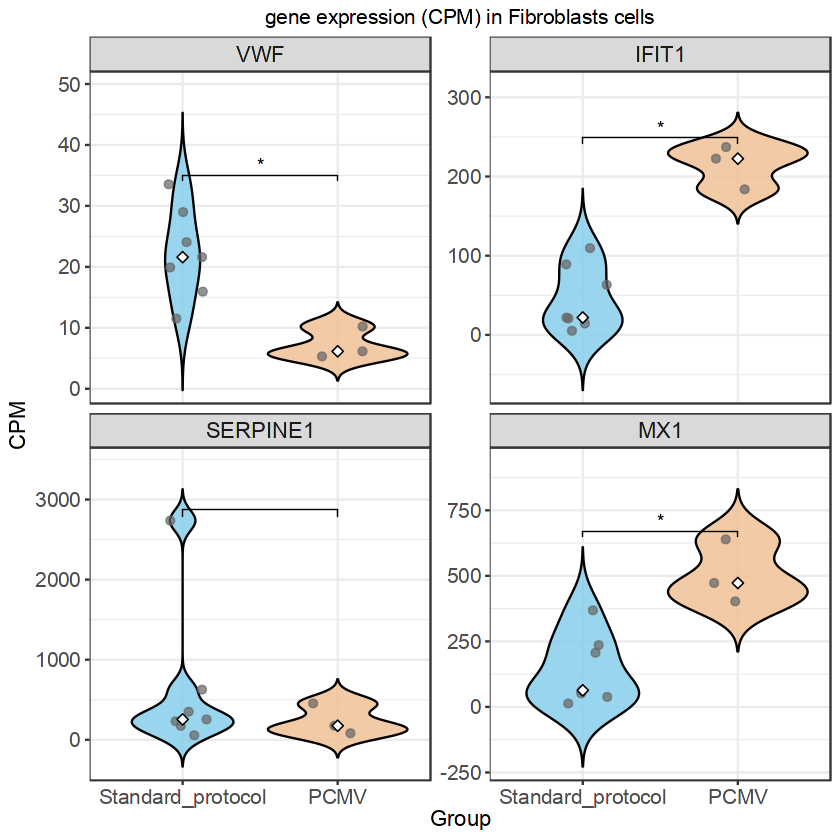

Warning message in wilcox.test.default(c(44.7071236330797, 17.3077755181515, 28.0981750235322, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(44.7071236330797, 17.3077755181515, 28.0981750235322, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”


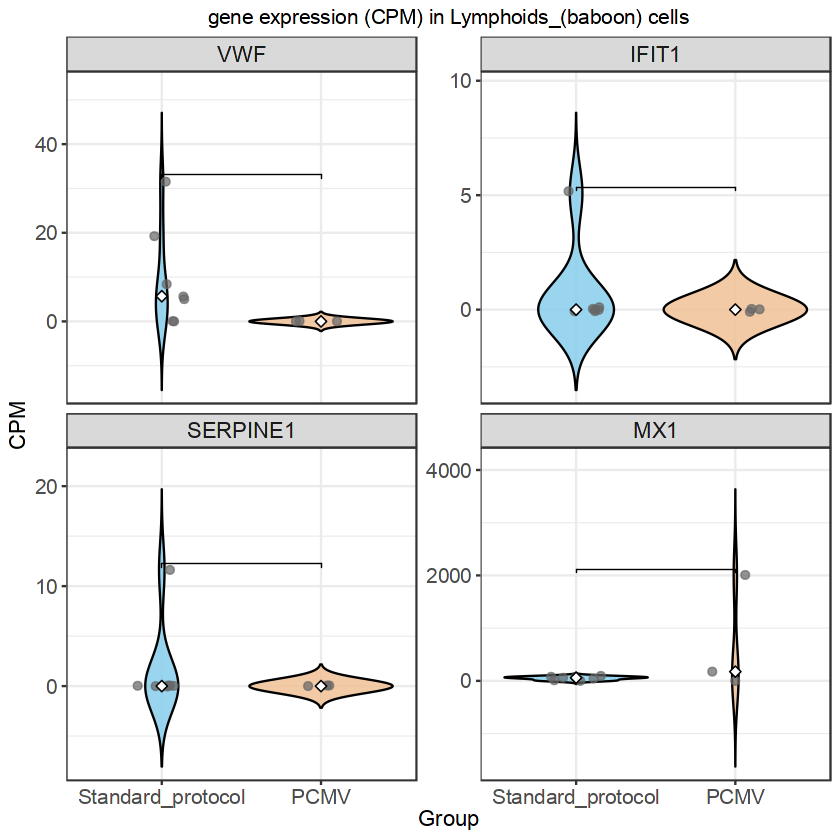

Warning message in wilcox.test.default(c(0, 0, 2.36537469900607, 0, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 4.27292907151388, 2.36537469900607, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 2.36537469900607, 0, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 4.27292907151388, 2.36537469900607, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”


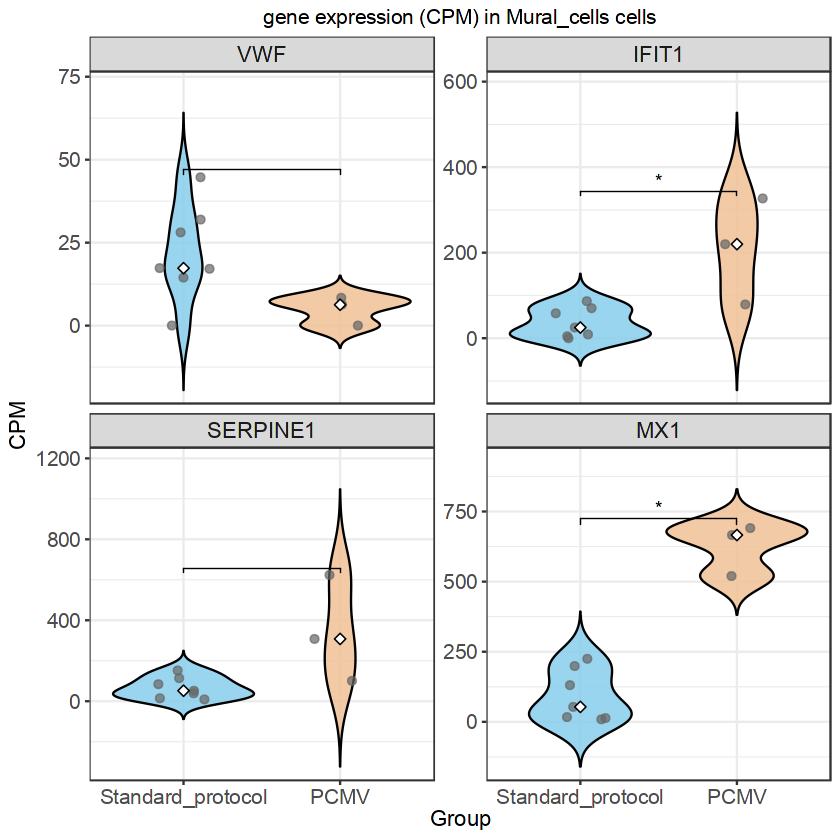

Warning message in wilcox.test.default(c(61.7703378837482, 0, 118.277874152342, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 57.1624556990968, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(154.425844709371, 0, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(61.7703378837482, 0, 118.277874152342, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 57.1624556990968, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(154.425844709371, 0, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x_pcmv, x_std):
“cannot compute

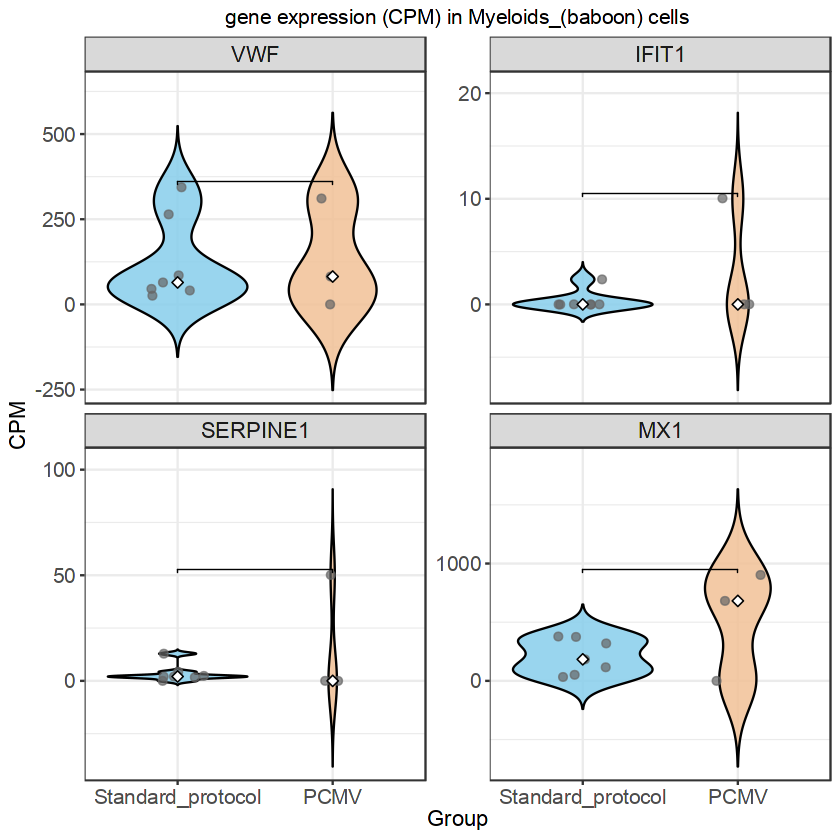

Warning message in wilcox.test.default(c(304.692260816575, 0, 0, 0, 0), c(0, 5.17469779764862, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(609.38452163315, 0, 54.2799761168105, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 20.6987911905945, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(609.38452163315, 0, 0, 0, 0), c(425.531914893617, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(304.692260816575, 0, 0, 0, 0), c(0, 5.17469779764862, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(609.38452163315, 0, 54.2799761168105, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 20.6987911905945, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(609.38452163315, 0, 0, 0, 0), c(425.531914893617, :
“

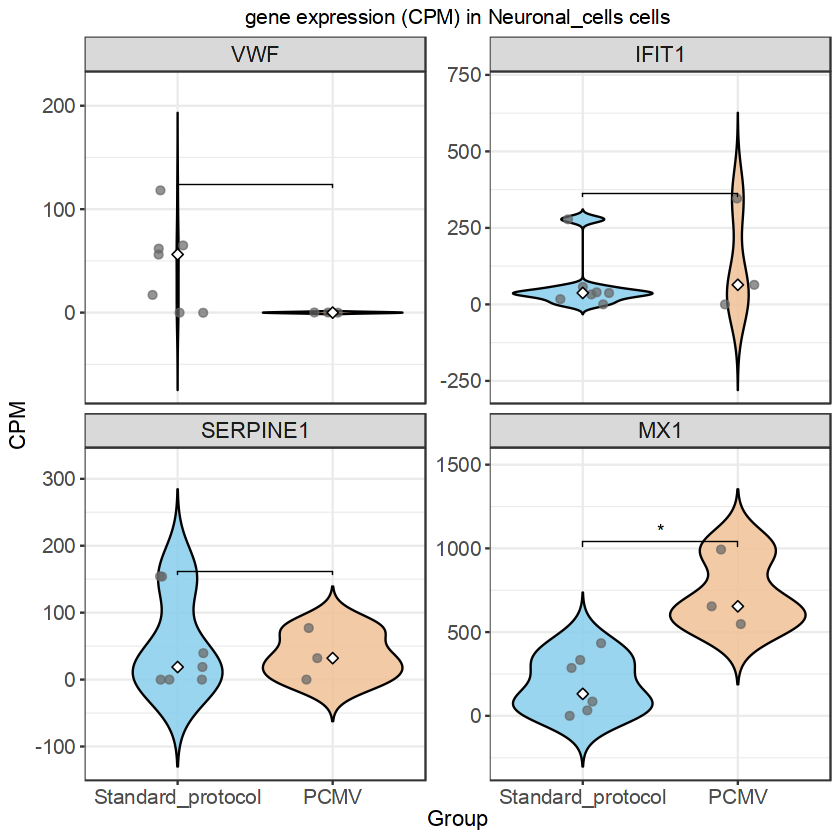

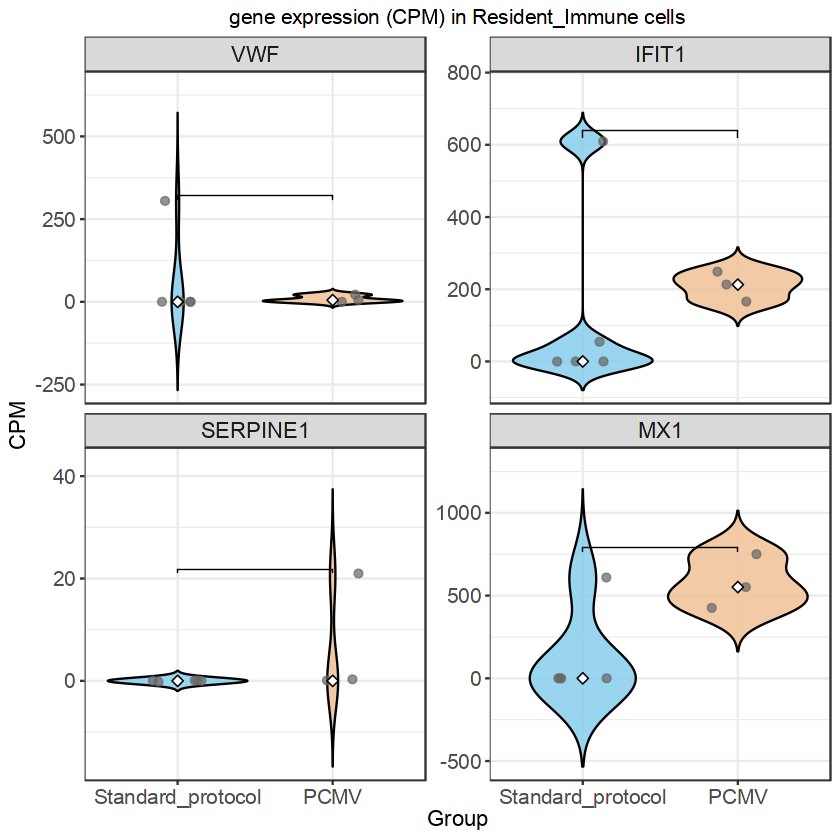

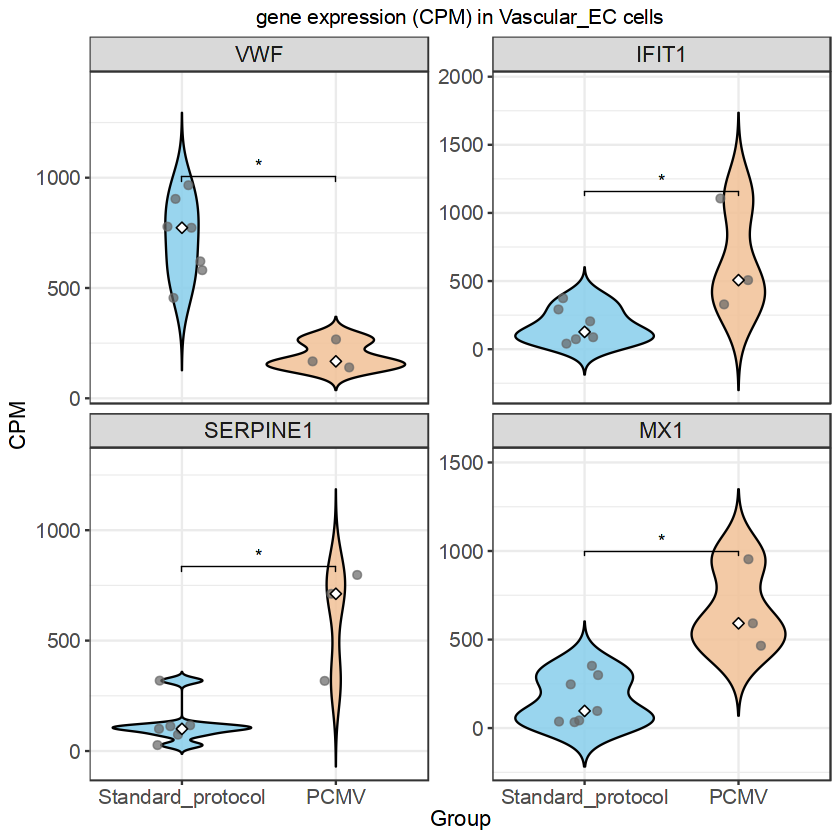

In [8]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_pcmv <- "pseudobulk_by_celltype_PCMV/" # Changed to PCMV directory
plotdir <- "OAS123_VWF/" # New plot directory to avoid overwriting previous plots
if (!dir.exists(plotdir)) dir.create(plotdir, recursive = TRUE)

celltype_list_pp <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_pcmv <- list.files(outdir_pcmv, pattern = "_pcmv_bysample.csv") # Changed pattern to pcmv

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_pcmv_bysample.csv$", "\\1", celltype_list_pcmv) # Changed pattern
)

genes_of_interest <- c("VWF", "IFIT1", "SERPINE1", "SERPIN") # Coagulation genes of interest

# --- START: Added collector for stats ---
stats_out <- data.frame(
  celltype = character(),
  gene = character(),
  n_standard = integer(),
  n_pcmv = integer(),
  mean_cpm_standard = numeric(),
  mean_cpm_pcmv = numeric(),
  fold_change_PCMV_vs_Standard = numeric(),
  log2FC_PCMV_vs_Standard = numeric(),
  p_wilcox_raw = numeric(),
  stringsAsFactors = FALSE
)
# --- END: Added collector for stats ---


for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1, check.names = FALSE
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_pcmv <- read.csv(
    file.path(outdir_pcmv, paste0("pseudobulk_", celltype, "_pcmv_bysample.csv")), # Changed directory and label
    row.names = 1, check.names = FALSE
  )
  colnames(pseudo_pcmv) <- paste0(colnames(pseudo_pcmv), "_PCMV") # Changed column names

  # Align genes (union) and fill NAs with 0
  all_genes <- union(rownames(pseudo_pp), rownames(pseudo_pcmv))
  pseudo_pp <- pseudo_pp[all_genes, , drop = FALSE]; pseudo_pp[is.na(pseudo_pp)] <- 0
  pseudo_pcmv <- pseudo_pcmv[all_genes, , drop = FALSE]; pseudo_pcmv[is.na(pseudo_pcmv)] <- 0
  
  all_pseudo <- cbind(pseudo_pp, pseudo_pcmv)
  
  # CPM calculation
  all_pseudo_mat <- as.matrix(sapply(all_pseudo, as.numeric))
  rownames(all_pseudo_mat) <- rownames(all_pseudo)
  pseudo_cpm <- cpm(all_pseudo_mat)
  
  # Subset to genes of interest (case-insensitive)
  map_upper <- setNames(rownames(pseudo_cpm), toupper(rownames(pseudo_cpm)))
  wanted <- intersect(toupper(genes_of_interest), names(map_upper))
  if (!length(wanted)) next
  genes_present <- unname(map_upper[wanted])

  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  if (nrow(sub_cpm) == 0) next
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_PCMV$", df_long$sample), "PCMV", # Changed label
                         ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_PCMV|_Standard_protocol)$", "", df_long$sample) # Changed regex
  df_long <- df_long[!is.na(df_long$group), ]
  
  # ensure group order: Standard_protocol first, then PCMV
  df_long$group <- factor(df_long$group, levels = c("Standard_protocol", "PCMV")) # Changed group level
  
  # --- START: Stats calculation and collection (similar to first script) ---
  for (g in unique(df_long$gene)) {
    x_std <- df_long$CPM[df_long$gene == g & df_long$group == "Standard_protocol"]
    x_pcmv <- df_long$CPM[df_long$gene == g & df_long$group == "PCMV"]

    if (length(x_std) >= 1 && length(x_pcmv) >= 1) {
      p_raw <- tryCatch(wilcox.test(x_pcmv, x_std)$p.value, error = function(e) NA_real_)
      m_std <- mean(x_std, na.rm = TRUE)
      m_pcmv <- mean(x_pcmv, na.rm = TRUE)
      eps <- 1e-9
      fc <- (m_pcmv + eps) / (m_std + eps)
      log2fc <- log2(fc)

      stats_out <- rbind(
        stats_out,
        data.frame(
          celltype = celltype,
          gene = g,
          n_standard = length(x_std),
          n_pcmv = length(x_pcmv),
          mean_cpm_standard = m_std,
          mean_cpm_pcmv = m_pcmv,
          fold_change_PCMV_vs_Standard = fc,
          log2FC_PCMV_vs_Standard = log2fc,
          p_wilcox_raw = p_raw
        )
      )
    }
  }
  # --- END: Stats calculation and collection ---

  # Plot with Wilcoxon test (Mann–Whitney U): VIOLIN + JITTER (+ median point)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_violin(trim = FALSE, color = "black", width = 0.9, alpha = 0.85) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    stat_summary(fun = median, geom = "point", size = 2.2, color = "black", shape = 23, fill = "white") +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "skyblue", "PCMV" = "#F0C096")) + # Changed fill color label
    scale_y_continuous(expand = expansion(mult = c(0.05, 0.15))) + 
    labs(
      title = paste0("gene expression (CPM) in ", celltype, " cells"), # Changed title
      x = "Group",
      y = "CPM"
    ) +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(
      method = "wilcox.test",
      comparisons = list(c("Standard_protocol", "PCMV")), # Changed comparison label
      label = "p.signif",
      hide.ns = TRUE
    )
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("Pseudobulk_", celltype, "_PCMV_vs_Standard.pdf")), # Changed filename
    plot = p, width = 8, height = 7
  )
}

# --- START: Added final write to CSV ---
write.csv(
  stats_out,
  file = file.path(plotdir, "PCMV_Wilcoxon_PCMV_vs_Standard.csv"), # Changed filename
  row.names = FALSE
)
# --- END: Added final write to CSV ---

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  
Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(21.3456284153005, 3.83654772089883, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 42.3101332769198, 0, 0, 0, 3.25741387397717:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(21.3456284153005, 3.83654772089883, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 42.3101332769198, 0, 0, 0, 3.25741387397717:
“cannot compute exact p-value with ties”


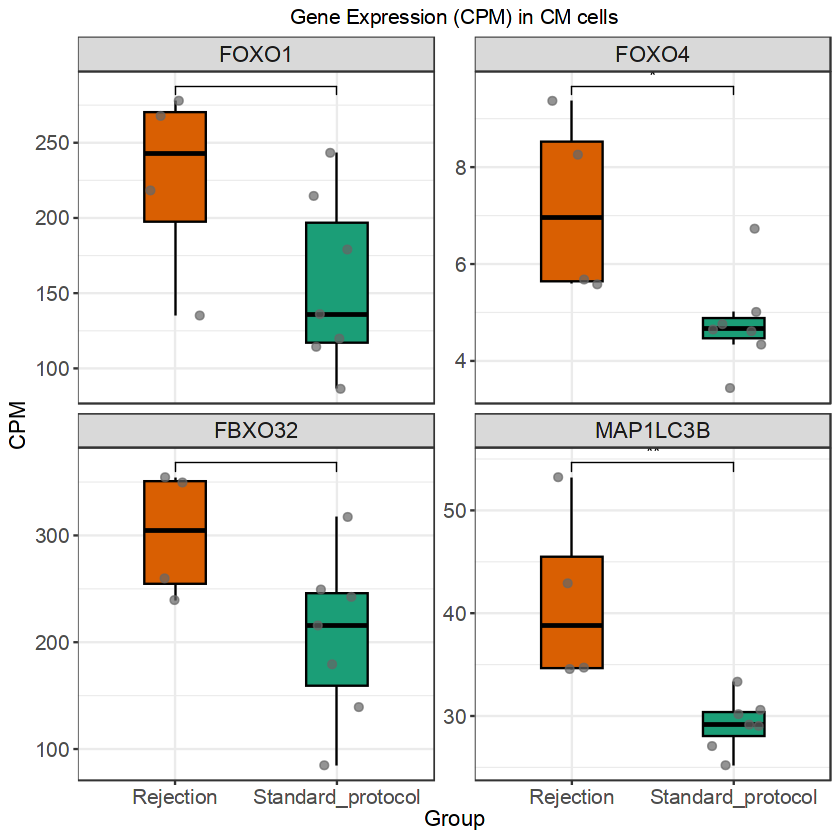

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(511.770726714432, 1955.03421309873, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(511.770726714432, 1955.03421309873, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value wit

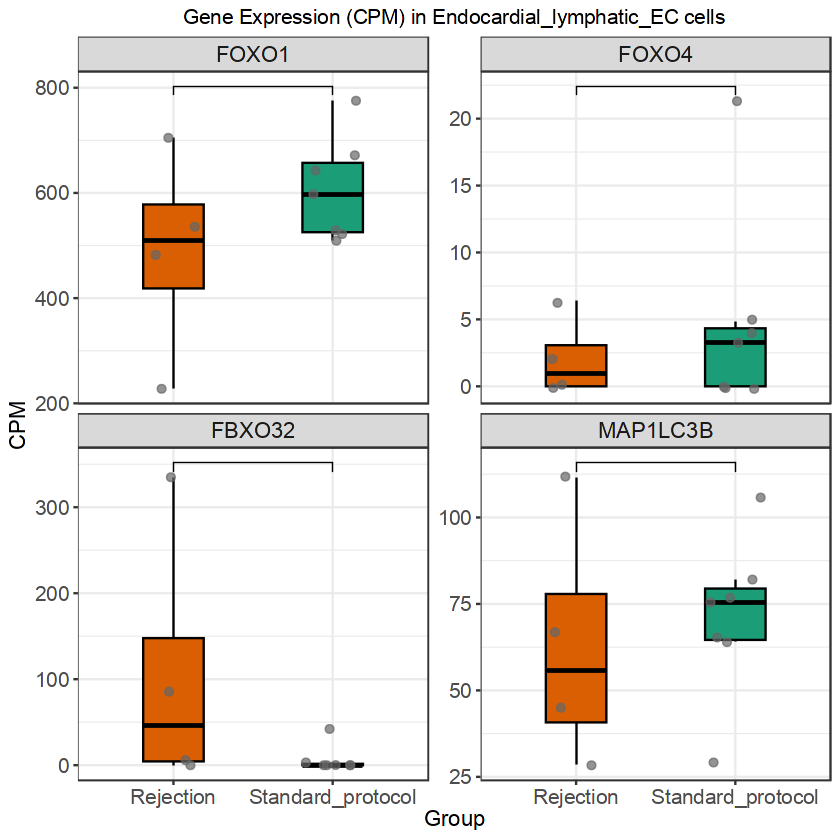

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(10.5381295873795, 0, 24.0544207214402, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(10.5381295873795, 0, 24.0544207214402, :
“cannot compute exact p-value with ties”


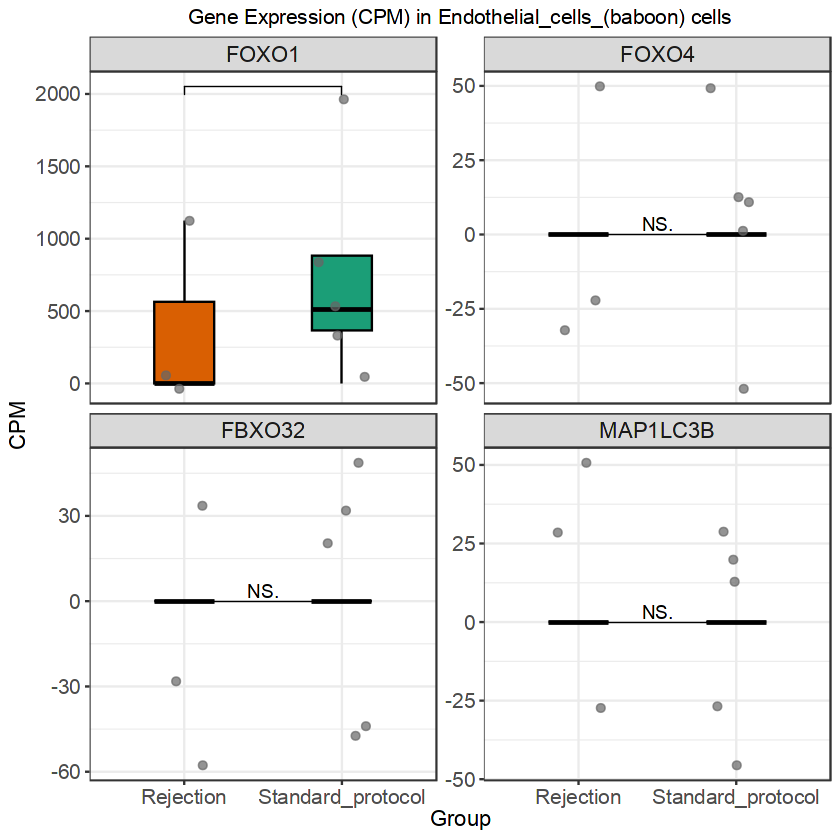

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(4.80178242163491, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(4.80178242163491, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


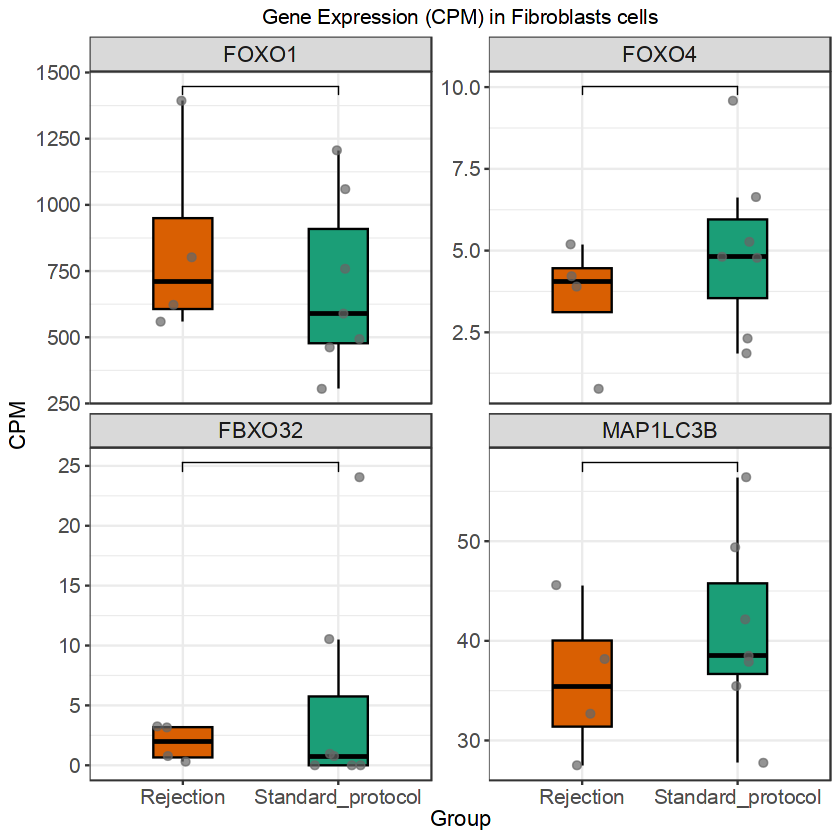

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(1814.88203266788, 212.539851222104, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1814.88203266788, 212.539851222104, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value wit

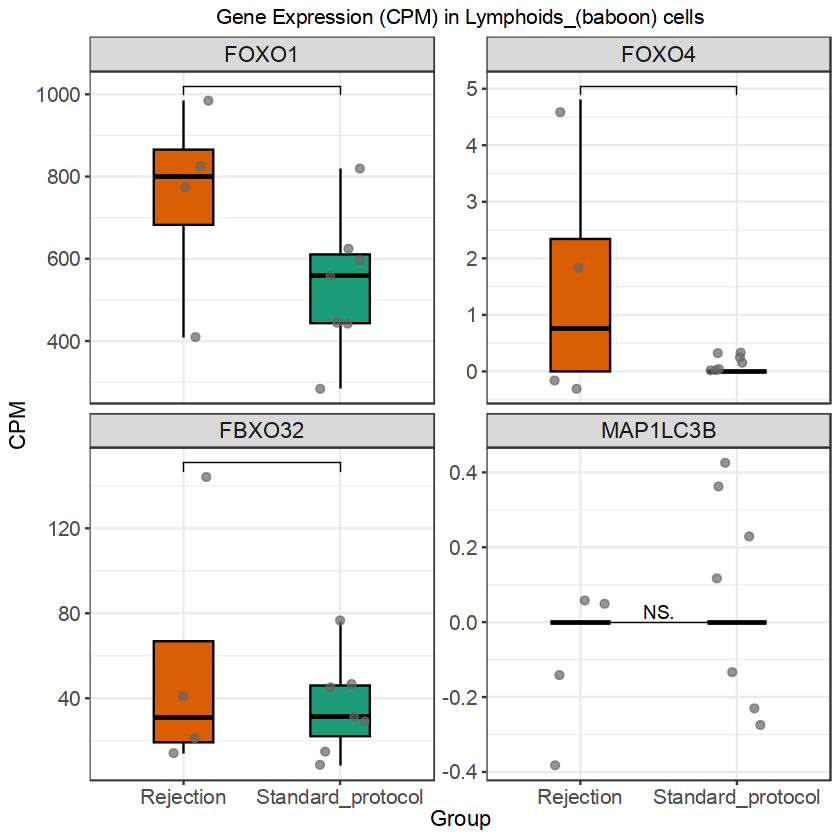

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 3.5526124135383, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 3.5526124135383, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”


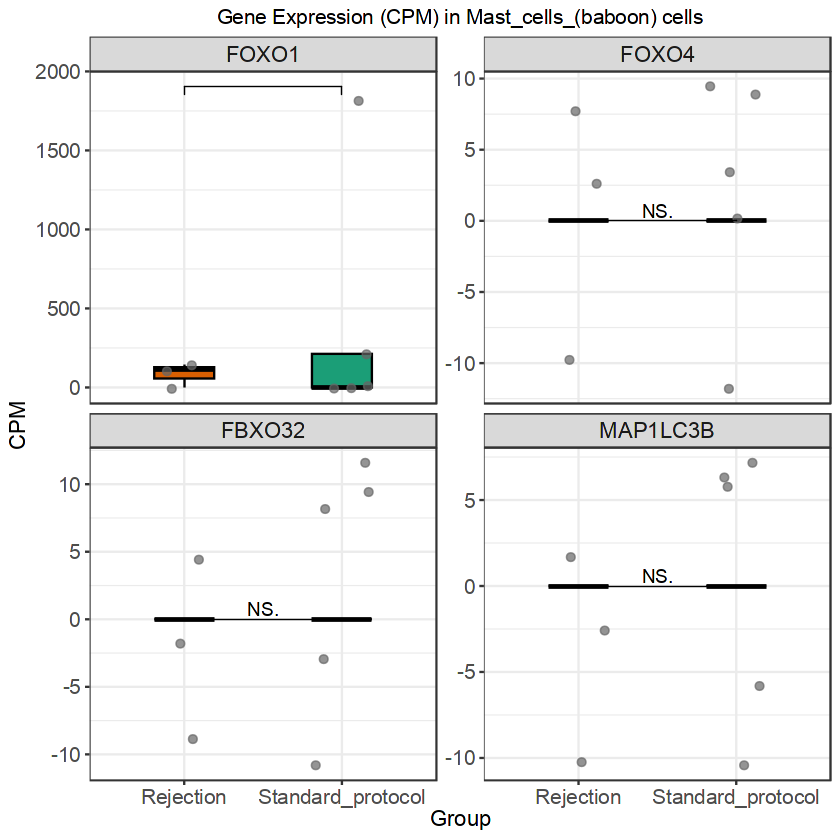

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(12.9233695876928, 2.13646453575694, 2.36537469900607, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(12.9233695876928, 2.13646453575694, 2.36537469900607, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


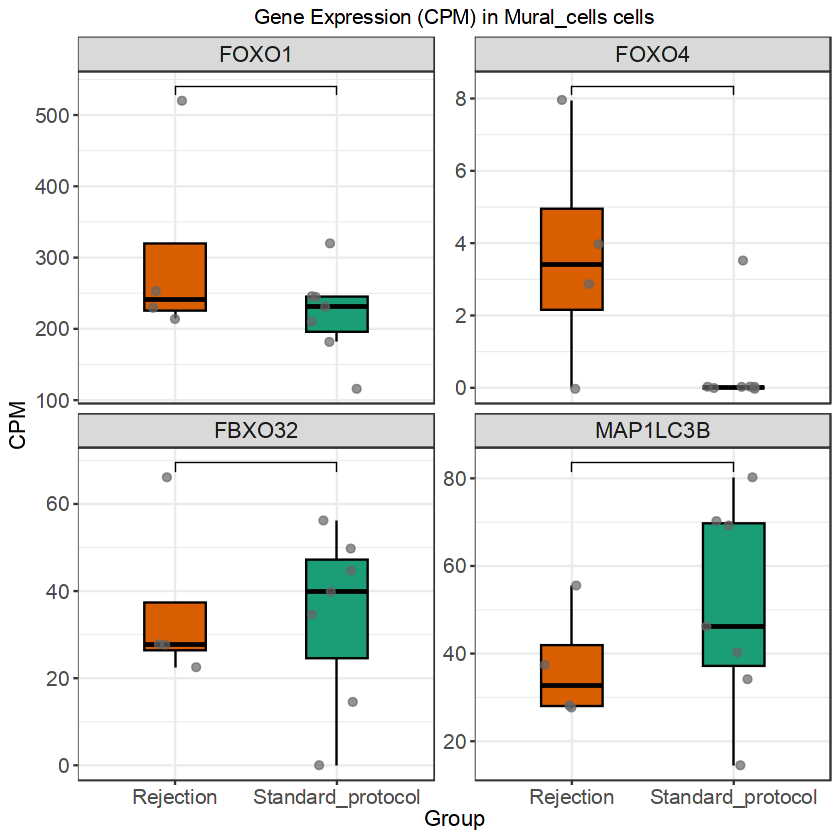

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 32.5192676660922, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(92.6555068256223, 0, 0, 56.2345355027367, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 32.5192676660922, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(92.6555068256223, 0, 0, 56.2345355027367, :
“cannot compute exact p-value with ties”


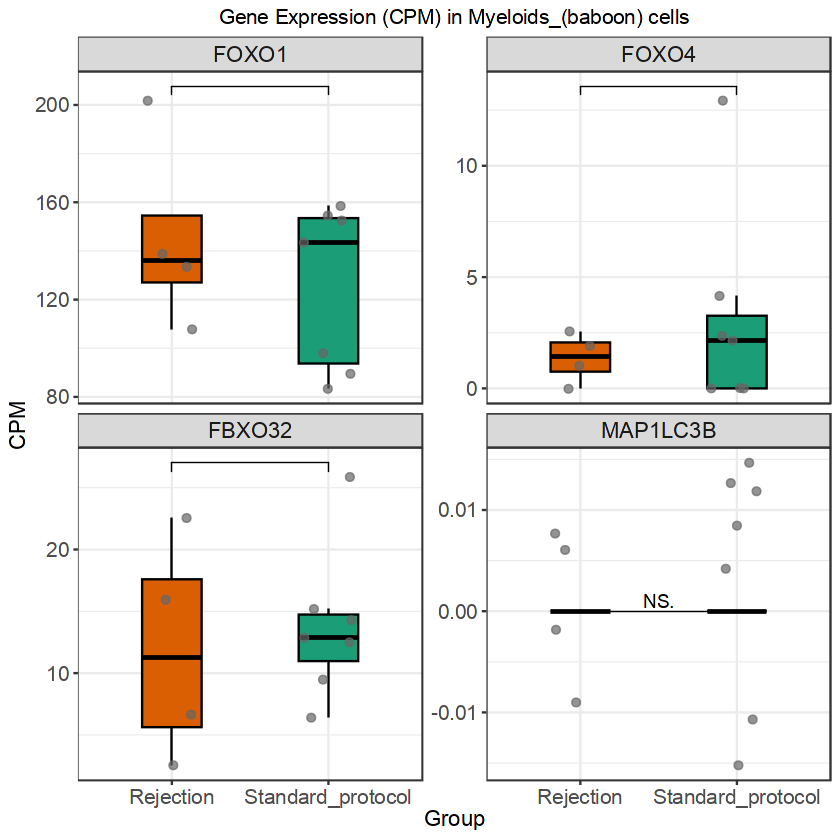

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 162.839928350432, 0, 377.073906485671:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(22.7346541084768, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(19.4868463786944, 25.9309200290426:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 162.839928350432, 0, 377.073906485671:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(22.7346541084768, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(19.4868463786944, 25.9309200290426:
“cannot compute exa

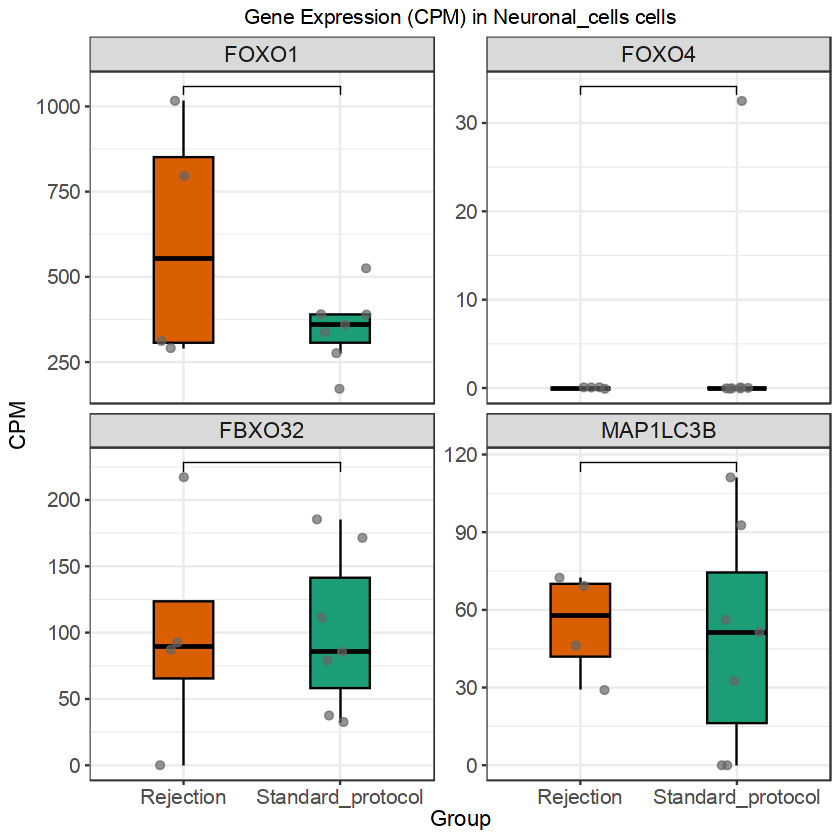

Genes found in CPM: FOXO1 FOXO4 FBXO32 MAP1LC3B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(1.75194553551719, 0, 3.8580842296949, 6.77900226644642, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.25583660655158, 0, 42.4389265266439, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.75194553551719, 0, 3.8580842296949, 6.77900226644642, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.25583660655158, 0, 42.4389265266439, :
“cannot compute exact p-value with ties”


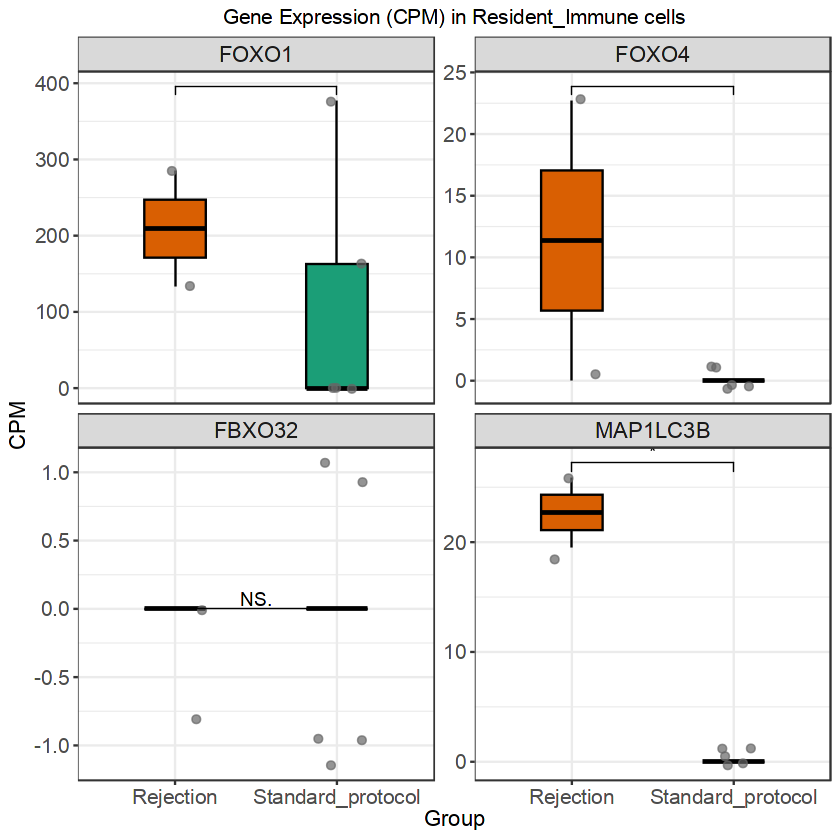

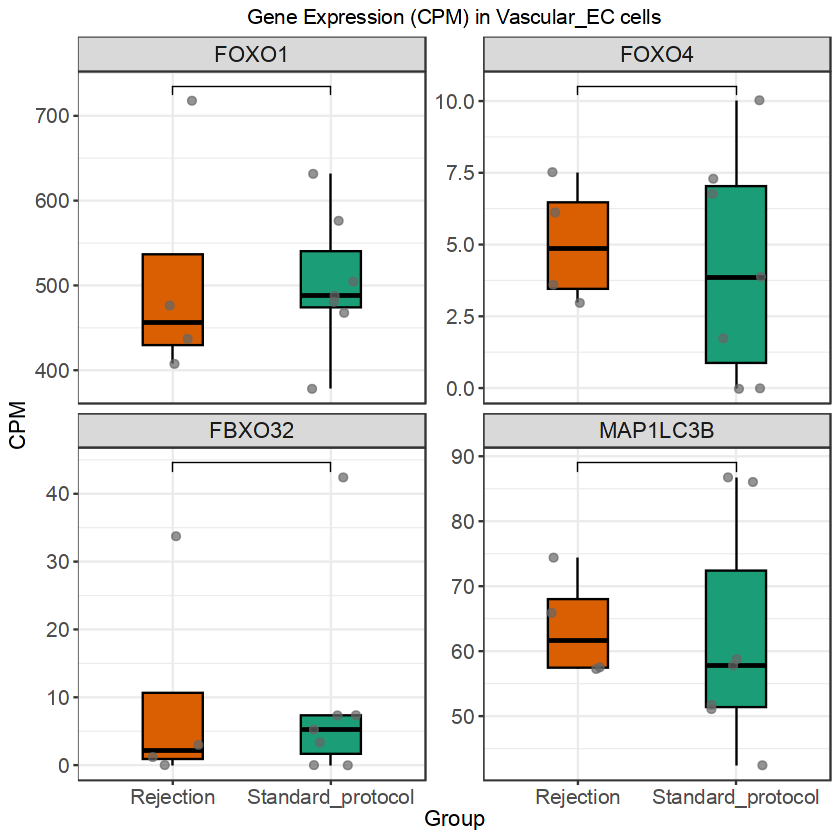

In [71]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "FOXO_protein_clearance/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("FOXO1", "FOXO4", "FBXO32", "MAP1LC3B") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 12, height = 8
  )
}


Celltype: CM 
Genes found in CPM: FOXO1, FOXO4 
Celltype: Endocardial_lymphatic_EC 
Genes found in CPM: FOXO1, FOXO4 


Warning message in wilcox.test.default(c(21.3456284153005, 3.83654772089883, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(21.3456284153005, 3.83654772089883, 0, :
“cannot compute exact p-value with ties”


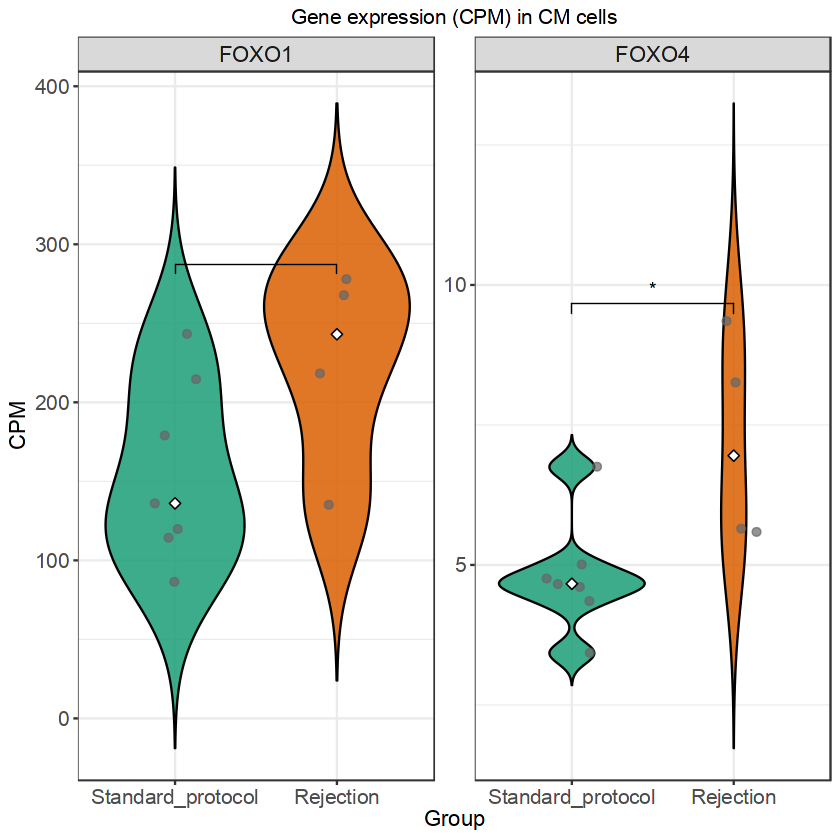

Celltype: Endothelial_cells_(baboon) 
Genes found in CPM: FOXO1, FOXO4 


Warning message in wilcox.test.default(c(511.770726714432, 1955.03421309873, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(511.770726714432, 1955.03421309873, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


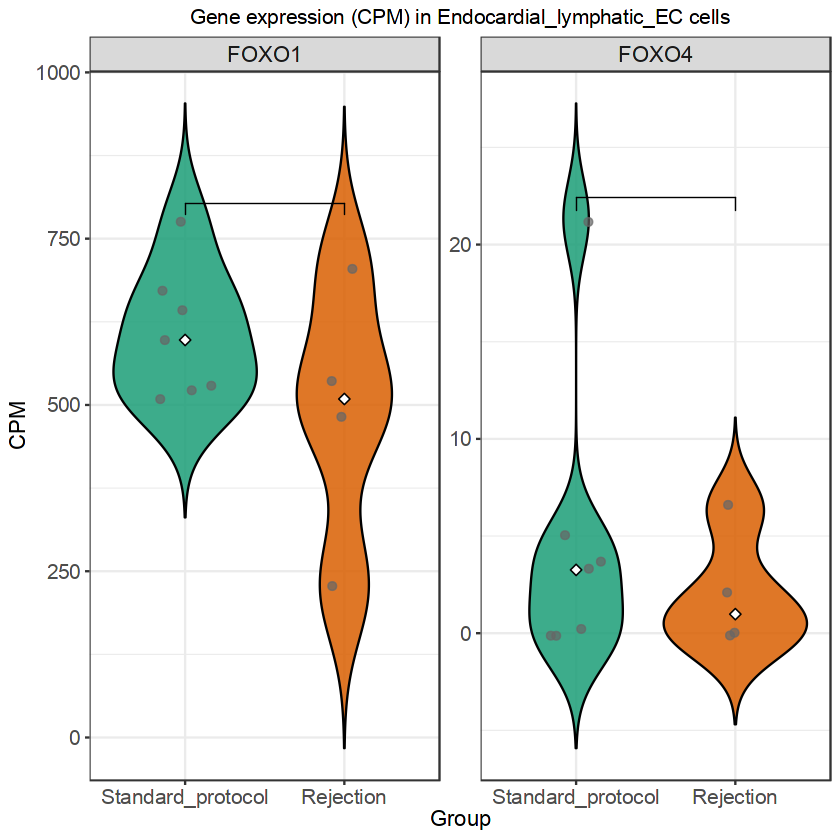

Celltype: Fibroblasts 
Genes found in CPM: FOXO1, FOXO4 


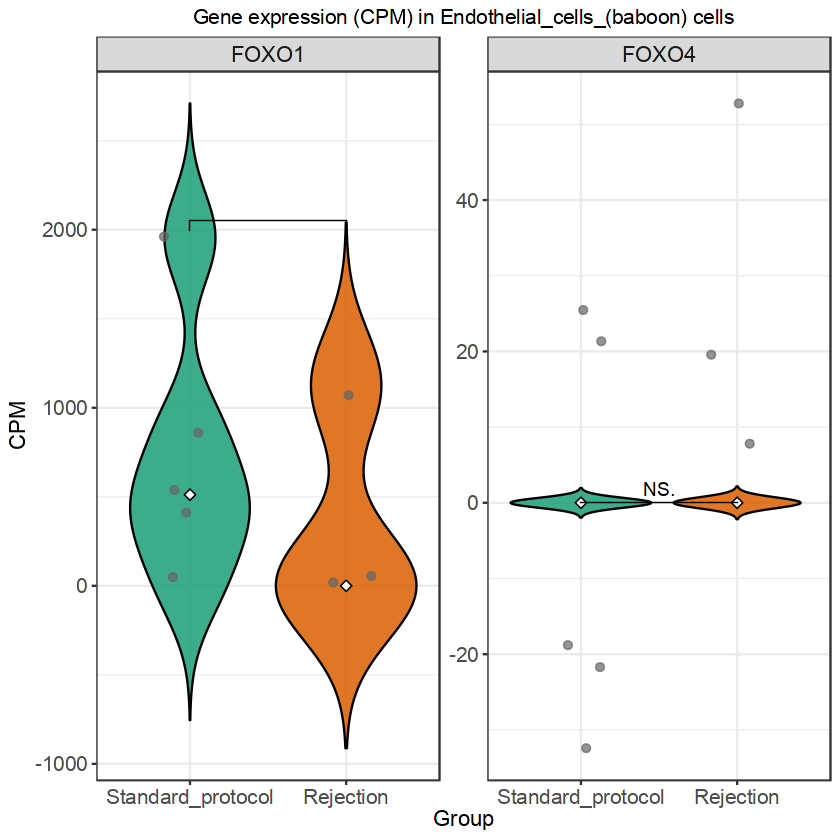

Celltype: Lymphoids_(baboon) 
Genes found in CPM: FOXO1, FOXO4 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(4.80178242163491, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(4.80178242163491, :
“cannot compute exact p-value with ties”


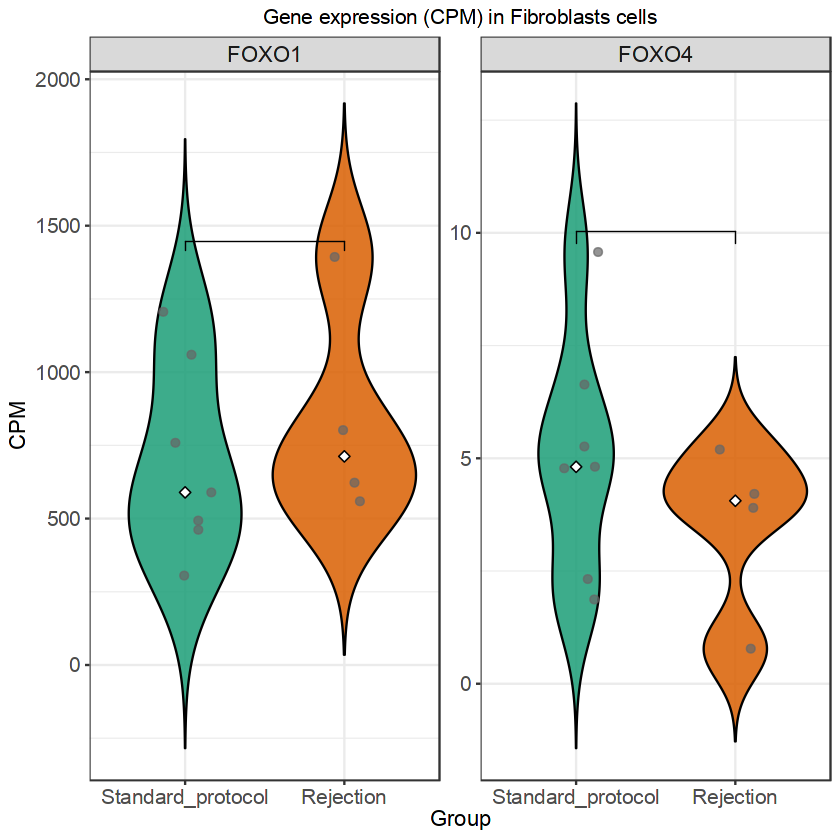

Celltype: Mast_cells_(baboon) 
Genes found in CPM: FOXO1, FOXO4 


Warning message in wilcox.test.default(c(1814.88203266788, 212.539851222104, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1814.88203266788, 212.539851222104, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


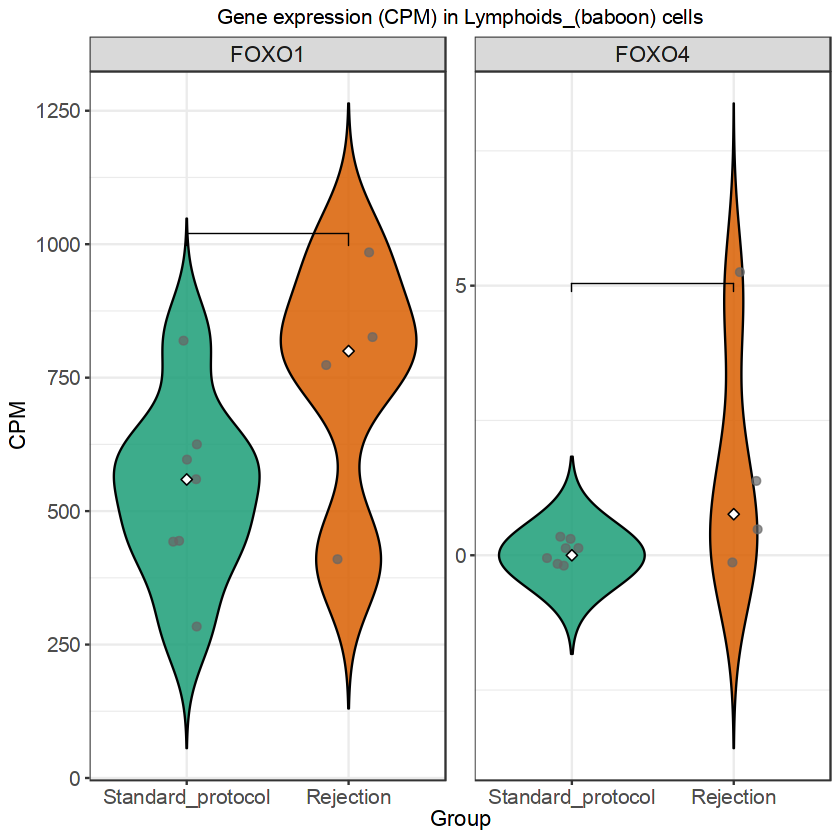

Celltype: Mural_cells 
Genes found in CPM: FOXO1, FOXO4 


Warning message in wilcox.test.default(c(0, 0, 0, 3.5526124135383, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 3.5526124135383, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”


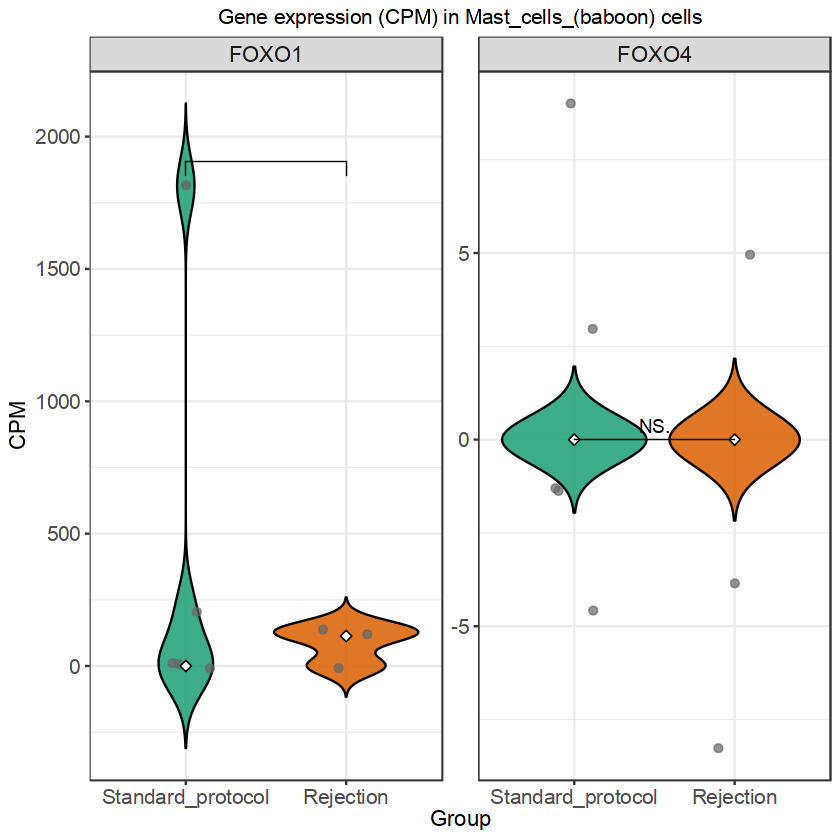

Celltype: Myeloids_(baboon) 
Genes found in CPM: FOXO1, FOXO4 


Warning message in wilcox.test.default(c(12.9233695876928, 2.13646453575694, 2.36537469900607, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(12.9233695876928, 2.13646453575694, 2.36537469900607, :
“cannot compute exact p-value with ties”


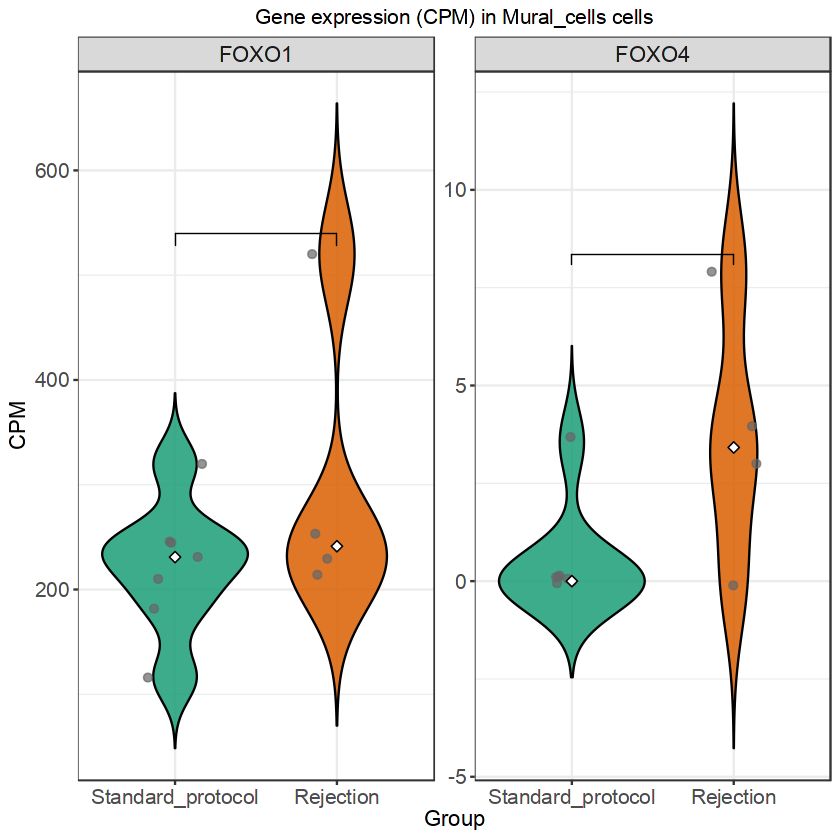

Celltype: Neuronal_cells 
Genes found in CPM: FOXO1, FOXO4 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 32.5192676660922, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 32.5192676660922, 0), c(0, :
“cannot compute exact p-value with ties”


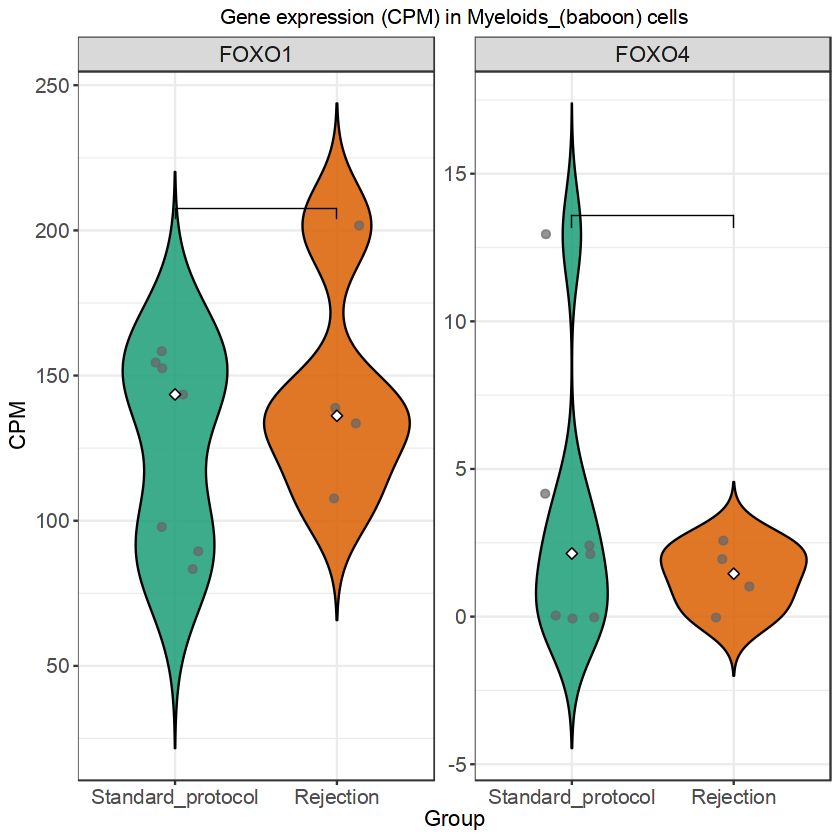

Celltype: Resident_Immune 
Genes found in CPM: FOXO1, FOXO4 


Warning message in wilcox.test.default(c(0, 0, 162.839928350432, 0, 377.073906485671:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(22.7346541084768, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 162.839928350432, 0, 377.073906485671:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(22.7346541084768, 0), :
“cannot compute exact p-value with ties”


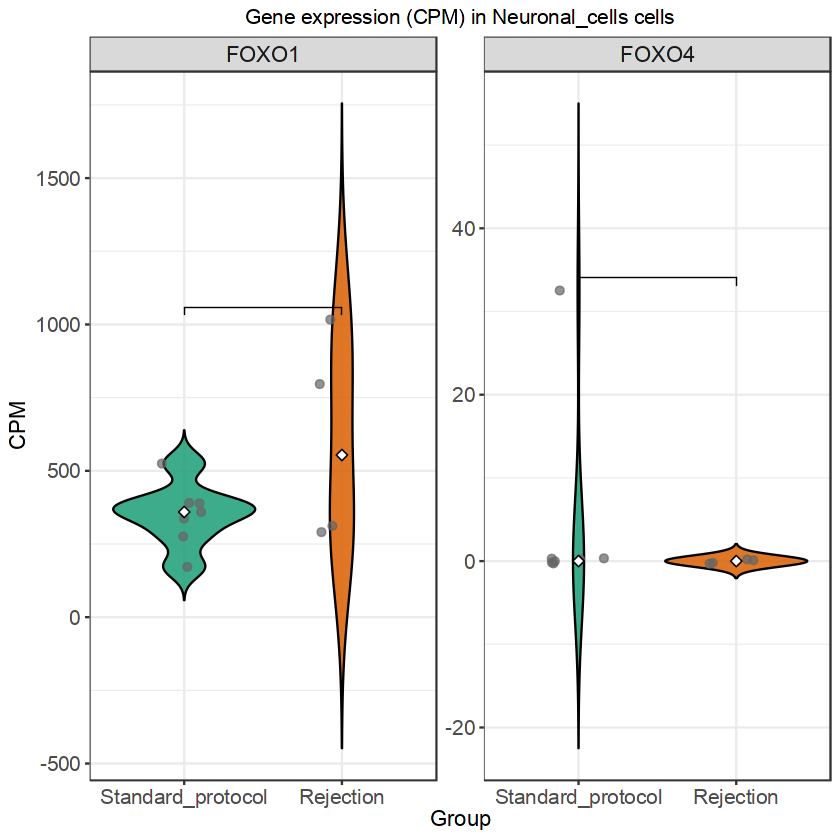

Celltype: Vascular_EC 
Genes found in CPM: FOXO1, FOXO4 


Warning message in wilcox.test.default(c(1.75194553551719, 0, 3.8580842296949, 6.77900226644642, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.75194553551719, 0, 3.8580842296949, 6.77900226644642, :
“cannot compute exact p-value with ties”


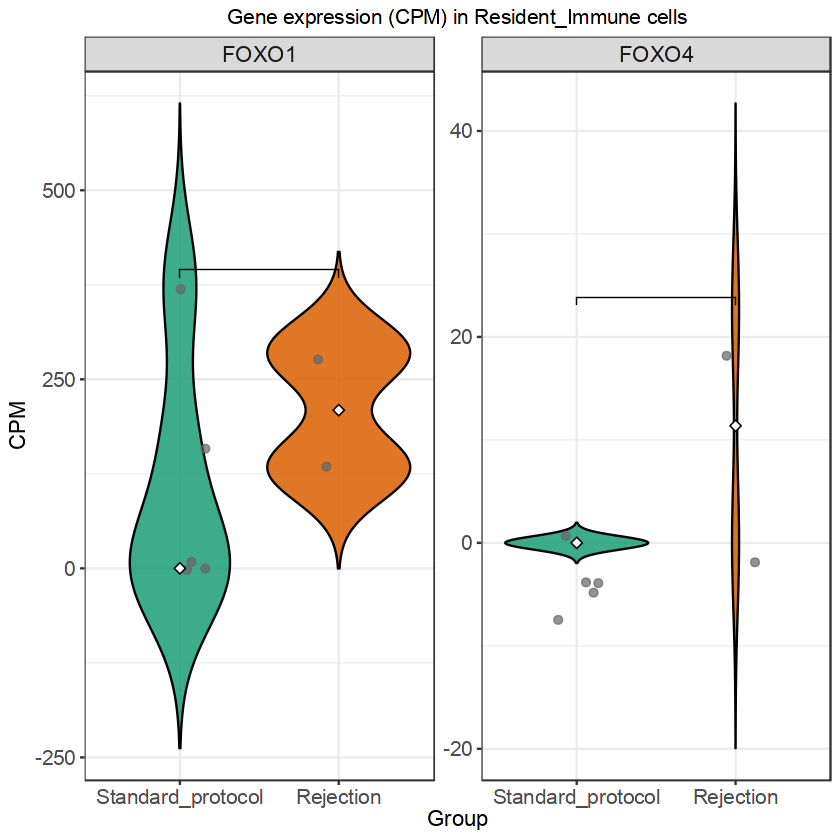

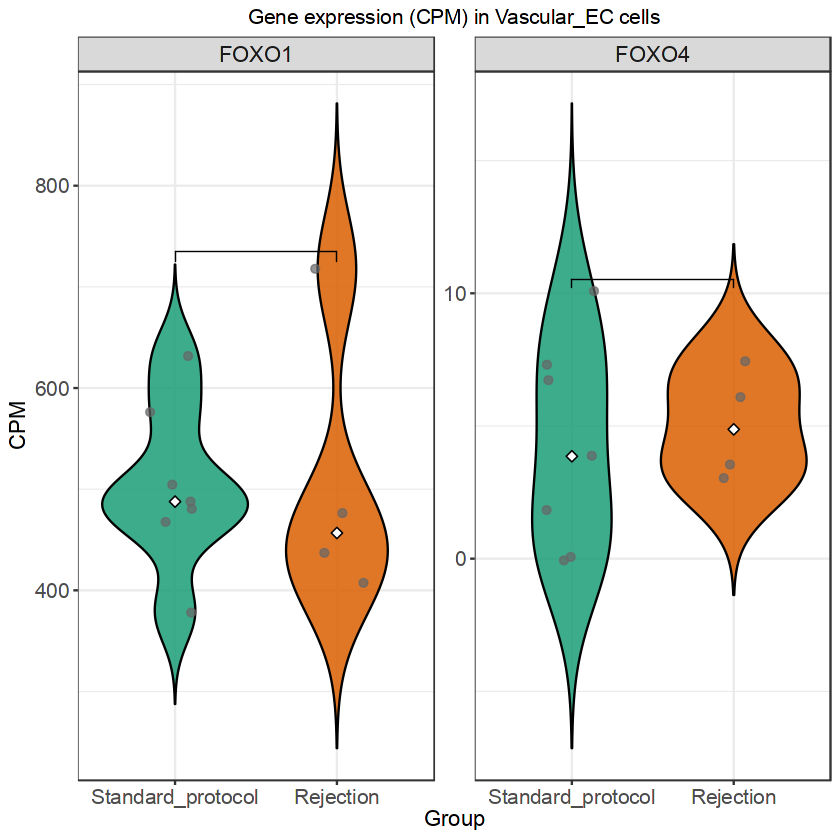

In [77]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "FOXO1_FOXO4/"
if (!dir.exists(plotdir)) dir.create(plotdir, recursive = TRUE)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("FOXO1", "FOXO4"
                       
                      ) # change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1, check.names = FALSE
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1, check.names = FALSE
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Celltype:", celltype, "\n")
  cat("Genes found in CPM:", paste(genes_present, collapse = ", "), "\n")
  if (length(genes_missing)) cat("Genes not found in CPM:", paste(genes_missing, collapse = ", "), "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure facet order matches genes_of_interest
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  # Ensure group order
  df_long$group <- factor(df_long$group, levels = c("Standard_protocol", "Rejection"))
  
  # Plot: VIOLIN + JITTER (+ median point)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_violin(trim = FALSE, color = "black", width = 0.9, alpha = 0.85) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    stat_summary(fun = median, geom = "point", size = 2.2, color = "black", shape = 23, fill = "white") +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(
      title = paste0("Gene expression (CPM) in ", celltype, " cells"),
      x = "Group",
      y = "CPM"
    ) +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(
      method = "wilcox.test",
      comparisons = list(c("Standard_protocol", "Rejection")),
      label = "p.signif",
      hide.ns = TRUE
    )
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 4
  )
}


Celltype: CM 
Genes found in CPM: FBXO32 
Celltype: Endocardial_lymphatic_EC 
Genes found in CPM: FBXO32 


Warning message in wilcox.test.default(c(0, 0, 42.3101332769198, 0, 0, 0, 3.25741387397717:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 42.3101332769198, 0, 0, 0, 3.25741387397717:
“cannot compute exact p-value with ties”


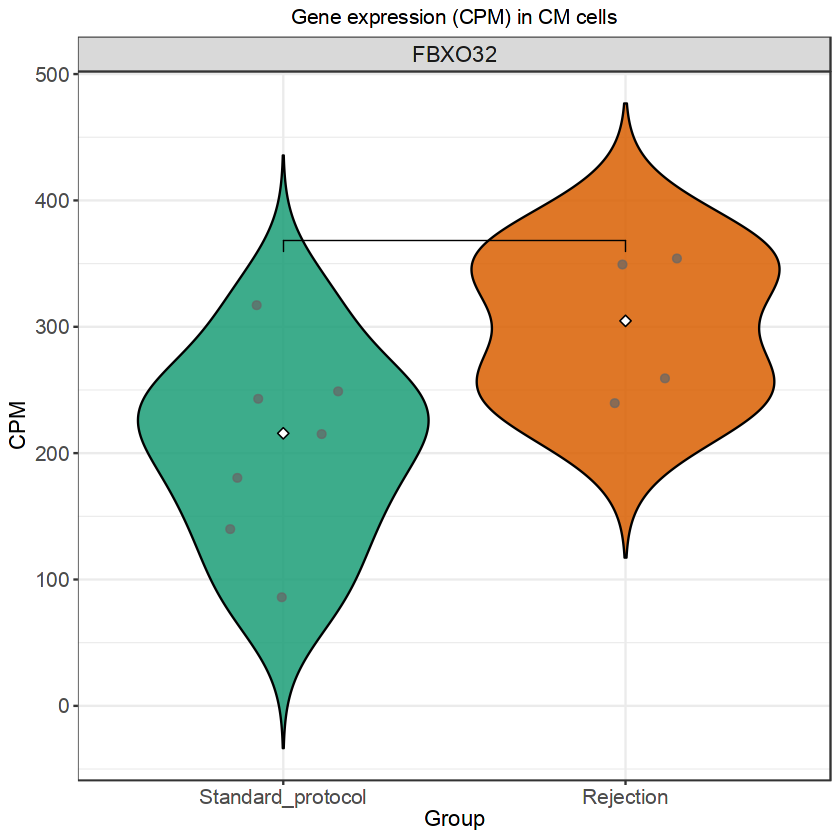

Celltype: Endothelial_cells_(baboon) 
Genes found in CPM: FBXO32 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


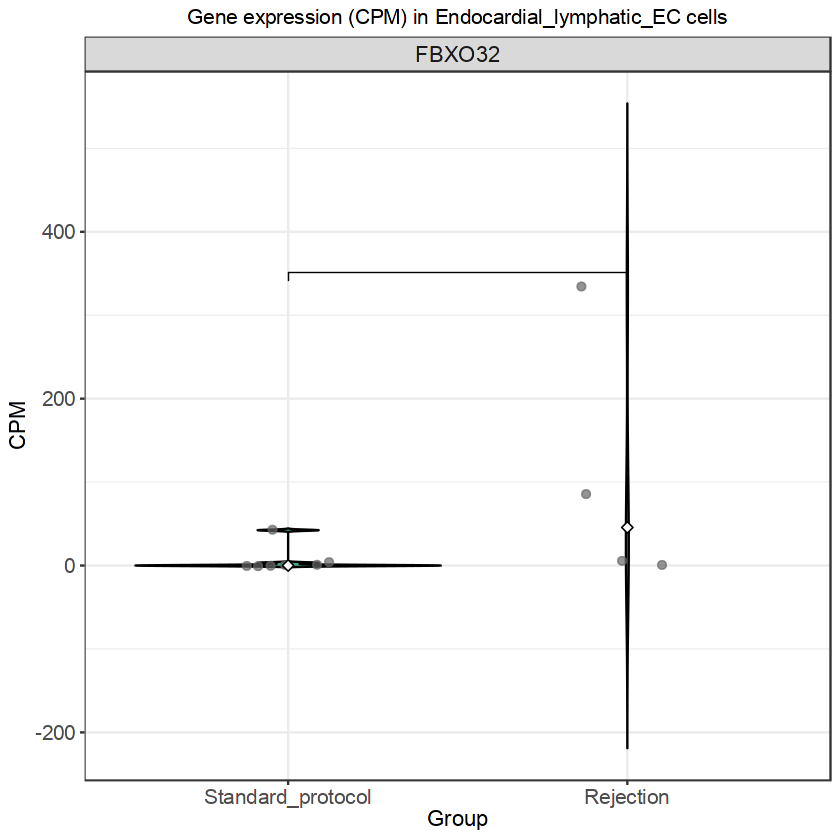

Celltype: Fibroblasts 
Genes found in CPM: FBXO32 


Warning message in wilcox.test.default(c(10.5381295873795, 0, 24.0544207214402, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(10.5381295873795, 0, 24.0544207214402, :
“cannot compute exact p-value with ties”


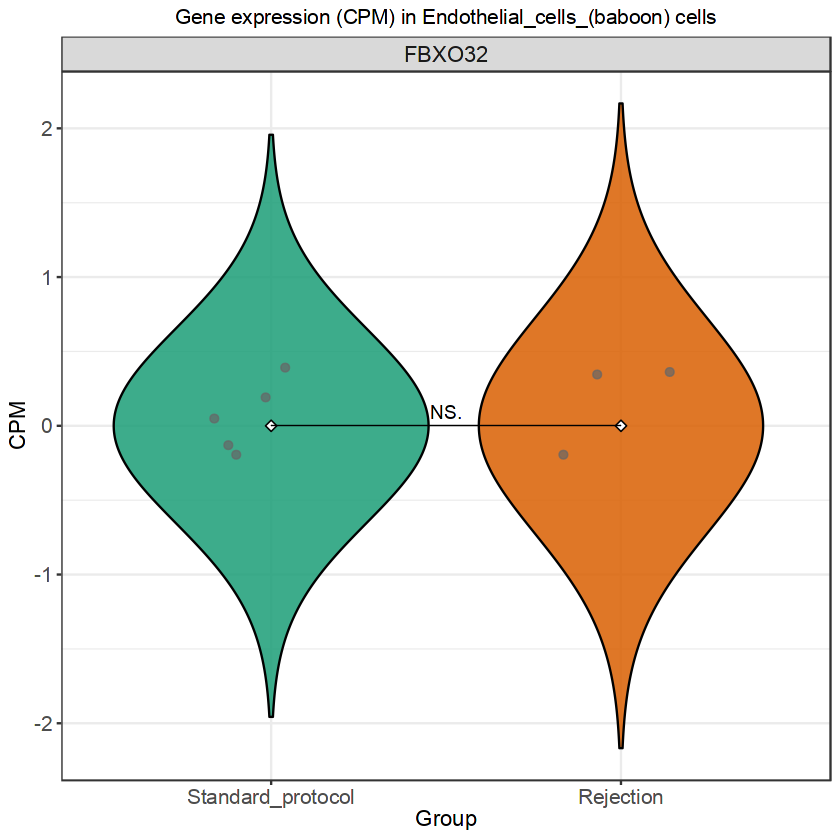

Celltype: Lymphoids_(baboon) 
Genes found in CPM: FBXO32 


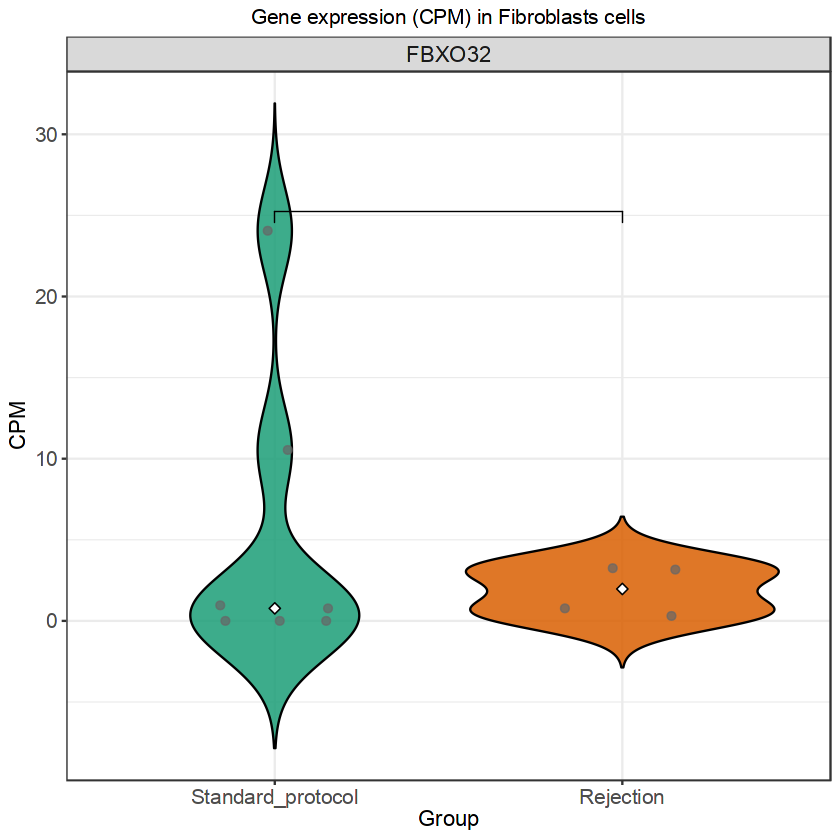

Celltype: Mast_cells_(baboon) 
Genes found in CPM: FBXO32 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


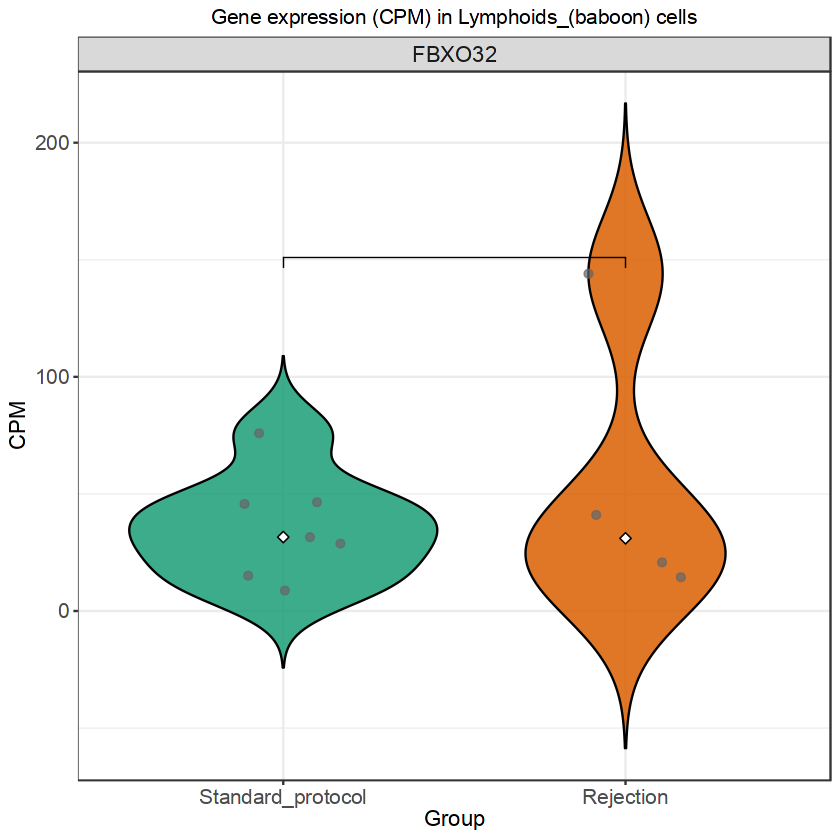

Celltype: Mural_cells 
Genes found in CPM: FBXO32 


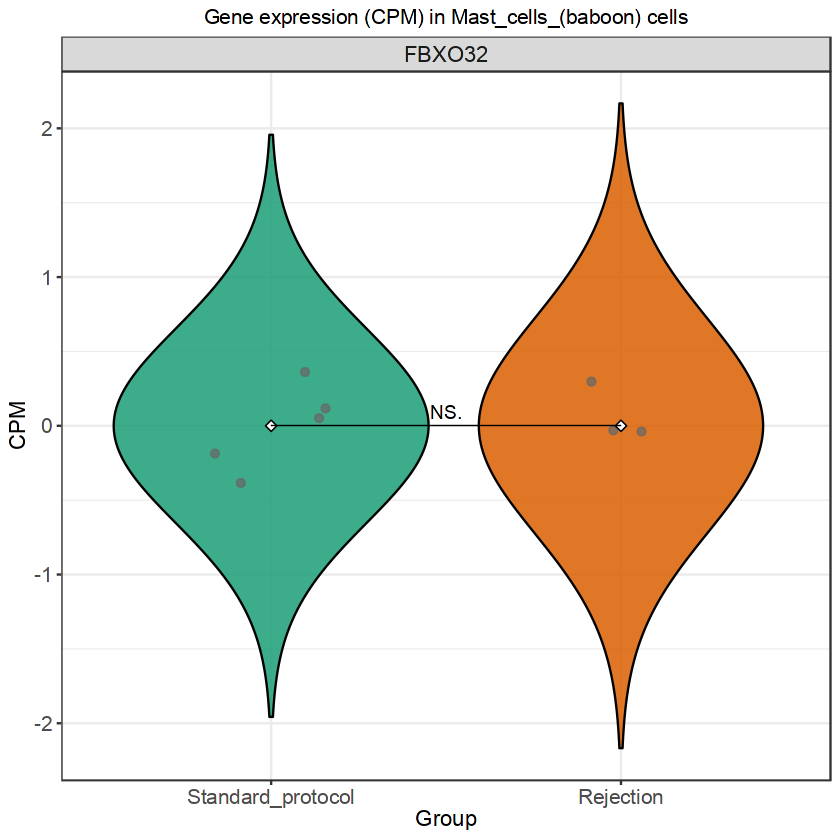

Celltype: Myeloids_(baboon) 
Genes found in CPM: FBXO32 


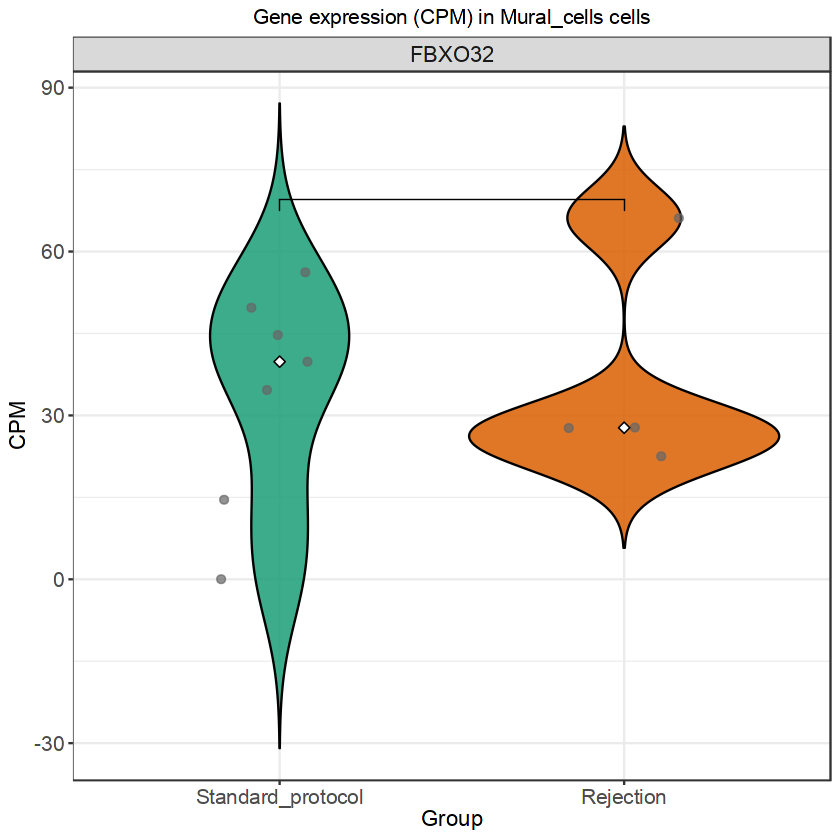

Celltype: Neuronal_cells 
Genes found in CPM: FBXO32 


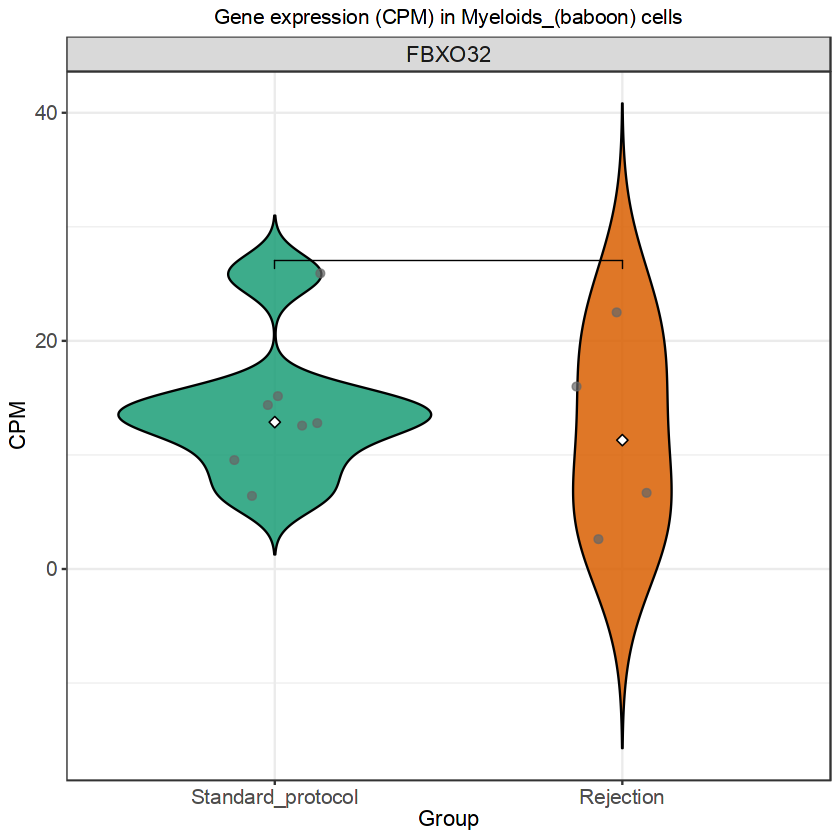

Celltype: Resident_Immune 
Genes found in CPM: FBXO32 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


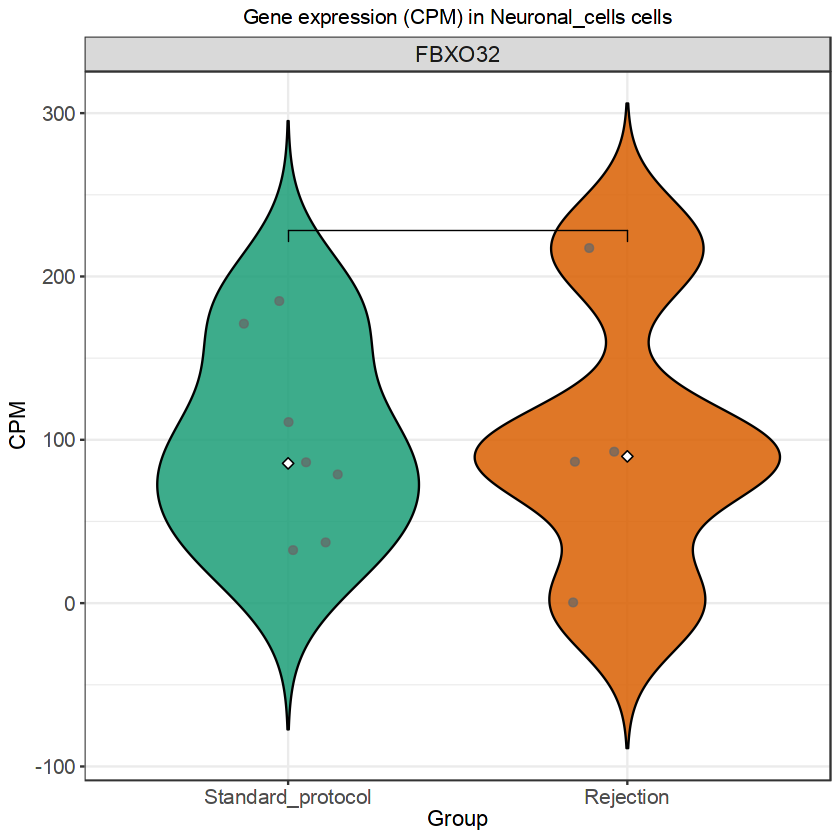

Celltype: Vascular_EC 
Genes found in CPM: FBXO32 


Warning message in wilcox.test.default(c(5.25583660655158, 0, 42.4389265266439, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.25583660655158, 0, 42.4389265266439, :
“cannot compute exact p-value with ties”


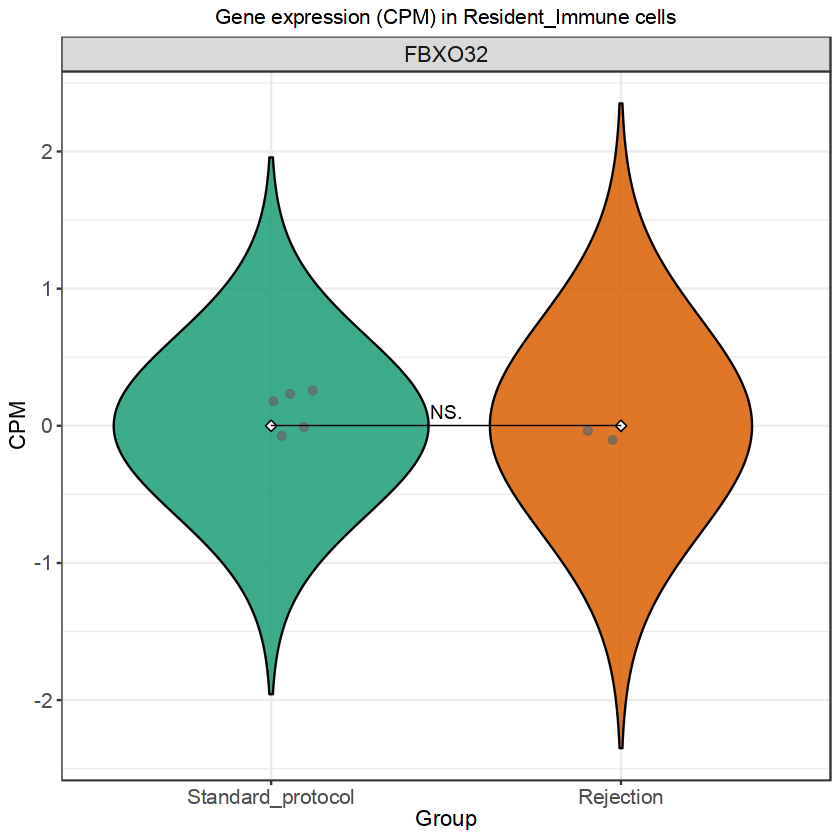

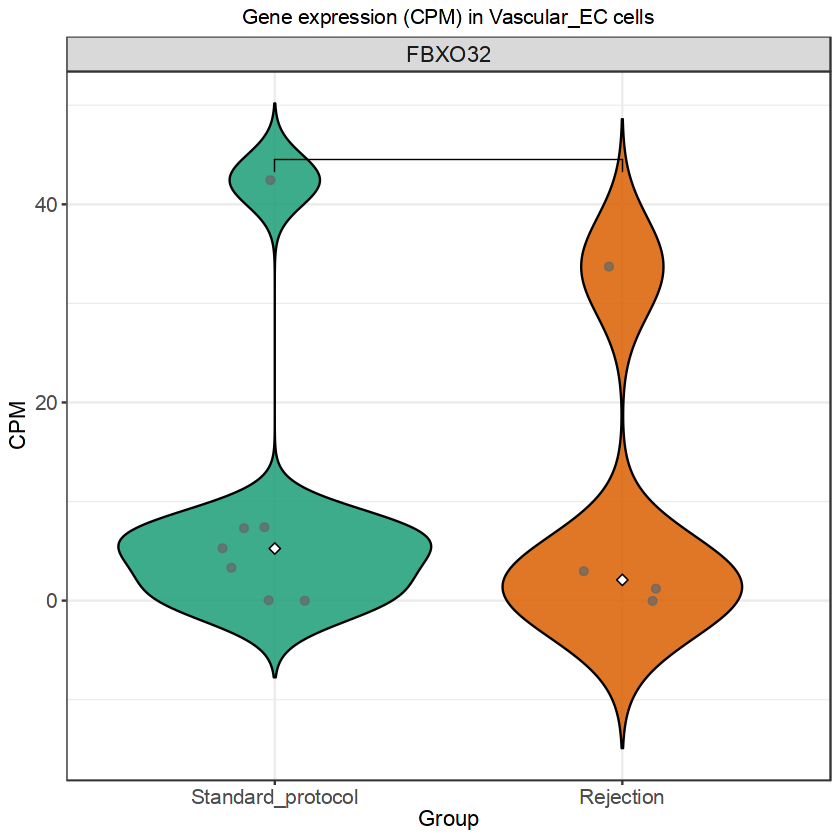

In [75]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "FBXO32/"
if (!dir.exists(plotdir)) dir.create(plotdir, recursive = TRUE)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c( "FBXO32"
                       
                      ) # change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1, check.names = FALSE
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1, check.names = FALSE
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Celltype:", celltype, "\n")
  cat("Genes found in CPM:", paste(genes_present, collapse = ", "), "\n")
  if (length(genes_missing)) cat("Genes not found in CPM:", paste(genes_missing, collapse = ", "), "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure facet order matches genes_of_interest
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  # Ensure group order
  df_long$group <- factor(df_long$group, levels = c("Standard_protocol", "Rejection"))
  
  # Plot: VIOLIN + JITTER (+ median point)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_violin(trim = FALSE, color = "black", width = 0.9, alpha = 0.85) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    stat_summary(fun = median, geom = "point", size = 2.2, color = "black", shape = 23, fill = "white") +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(
      title = paste0("Gene expression (CPM) in ", celltype, " cells"),
      x = "Group",
      y = "CPM"
    ) +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(
      method = "wilcox.test",
      comparisons = list(c("Standard_protocol", "Rejection")),
      label = "p.signif",
      hide.ns = TRUE
    )
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 7
  )
}


Celltype: CM 
Genes found in CPM: MAP1LC3B 
Celltype: Endocardial_lymphatic_EC 
Genes found in CPM: MAP1LC3B 


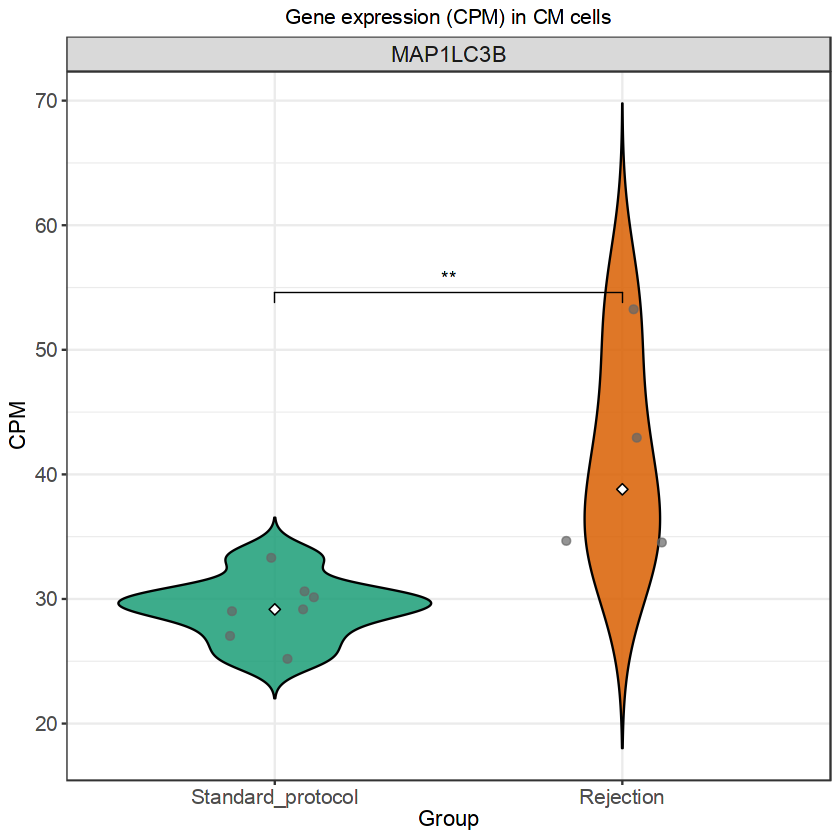

Celltype: Endothelial_cells_(baboon) 
Genes found in CPM: MAP1LC3B 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


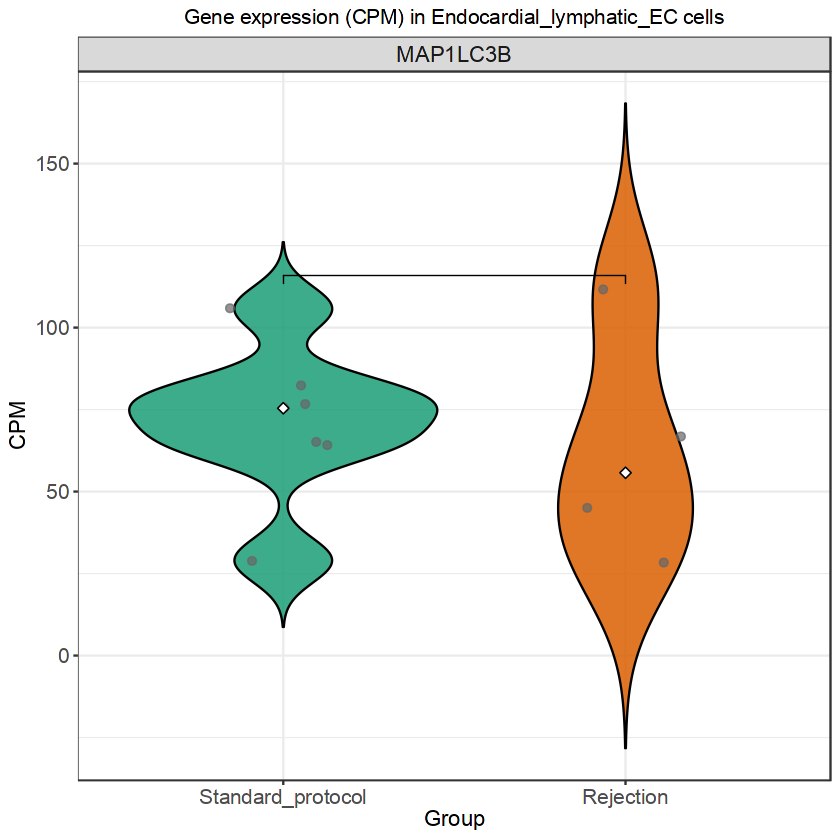

Celltype: Fibroblasts 
Genes found in CPM: MAP1LC3B 


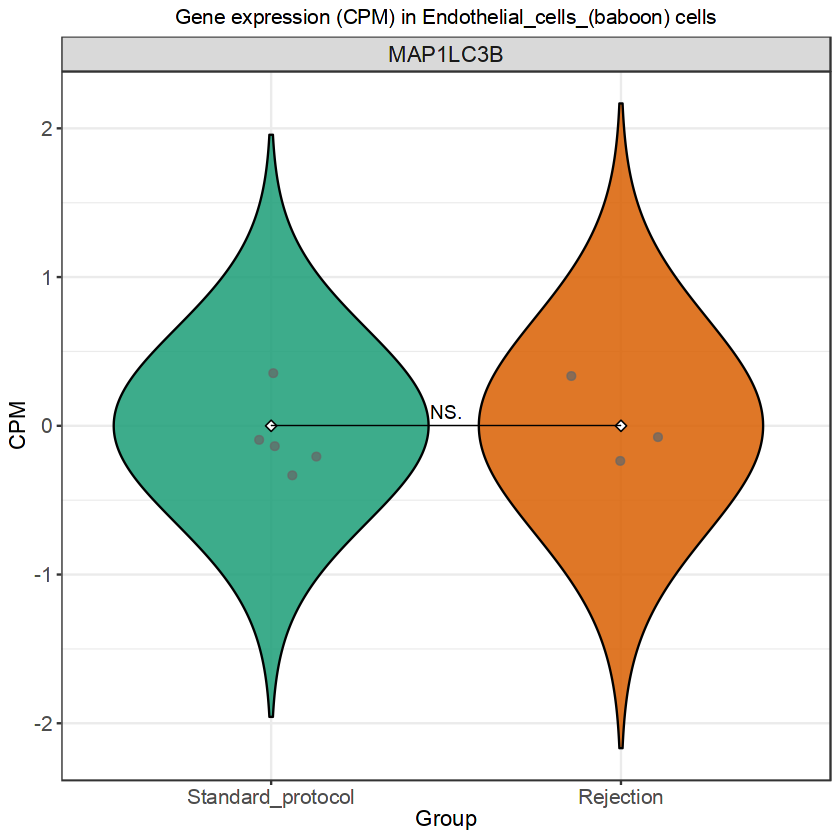

Celltype: Lymphoids_(baboon) 
Genes found in CPM: MAP1LC3B 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


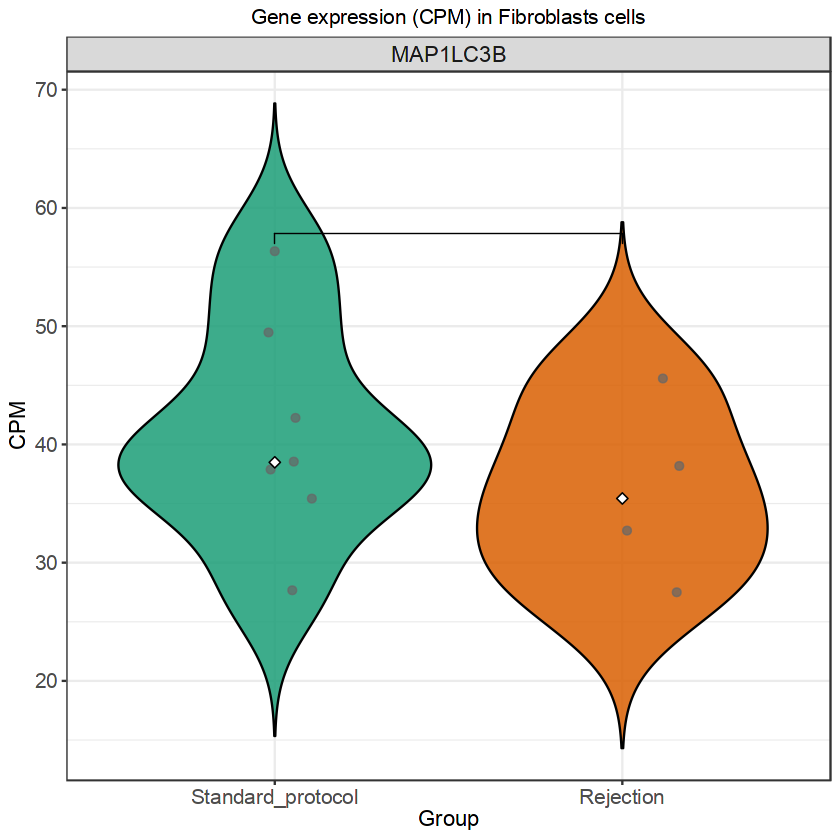

Celltype: Mast_cells_(baboon) 
Genes found in CPM: MAP1LC3B 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


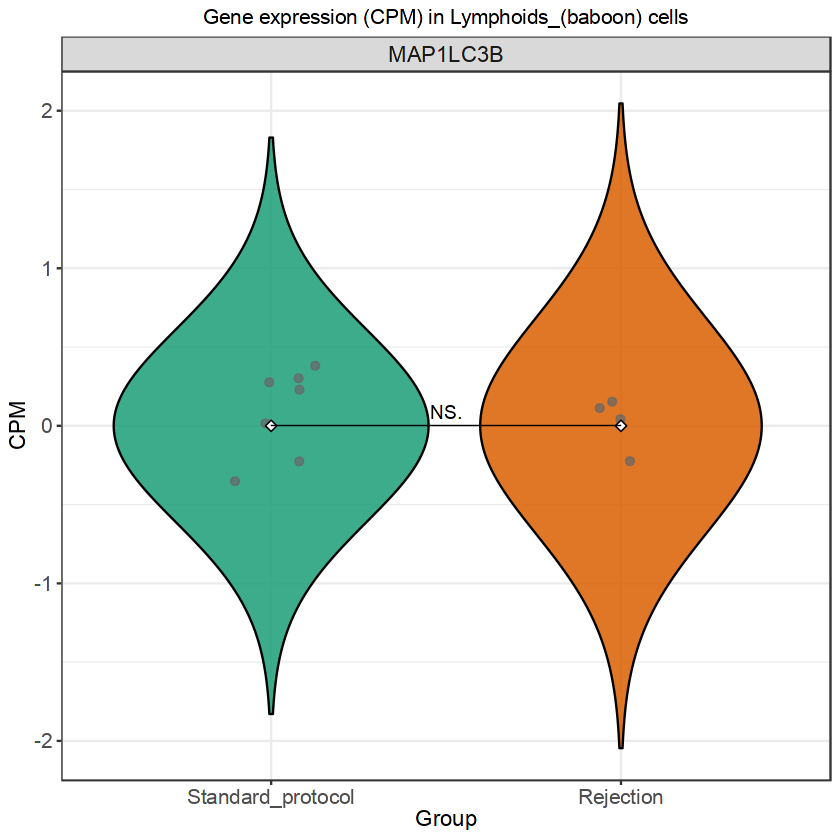

Celltype: Mural_cells 
Genes found in CPM: MAP1LC3B 


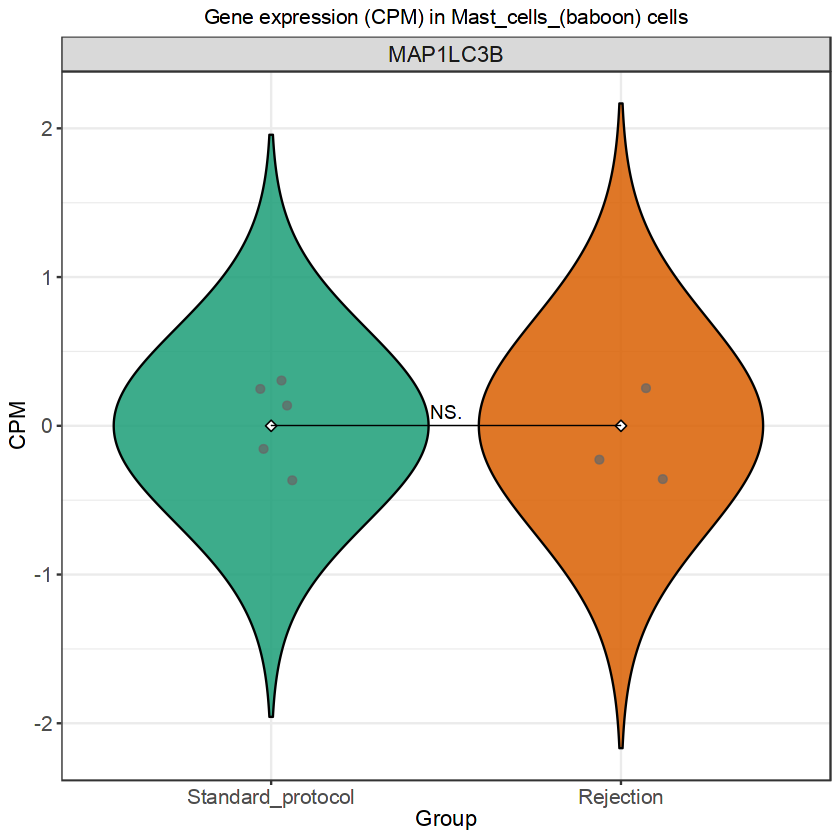

Celltype: Myeloids_(baboon) 
Genes found in CPM: MAP1LC3B 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


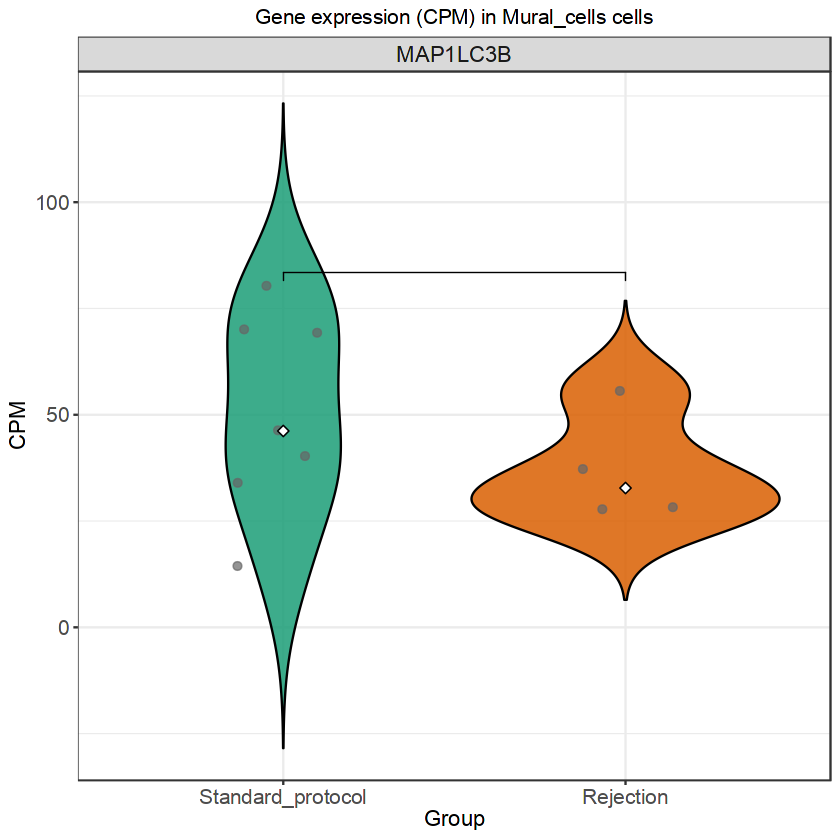

Celltype: Neuronal_cells 
Genes found in CPM: MAP1LC3B 


Warning message in wilcox.test.default(c(92.6555068256223, 0, 0, 56.2345355027367, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(92.6555068256223, 0, 0, 56.2345355027367, :
“cannot compute exact p-value with ties”


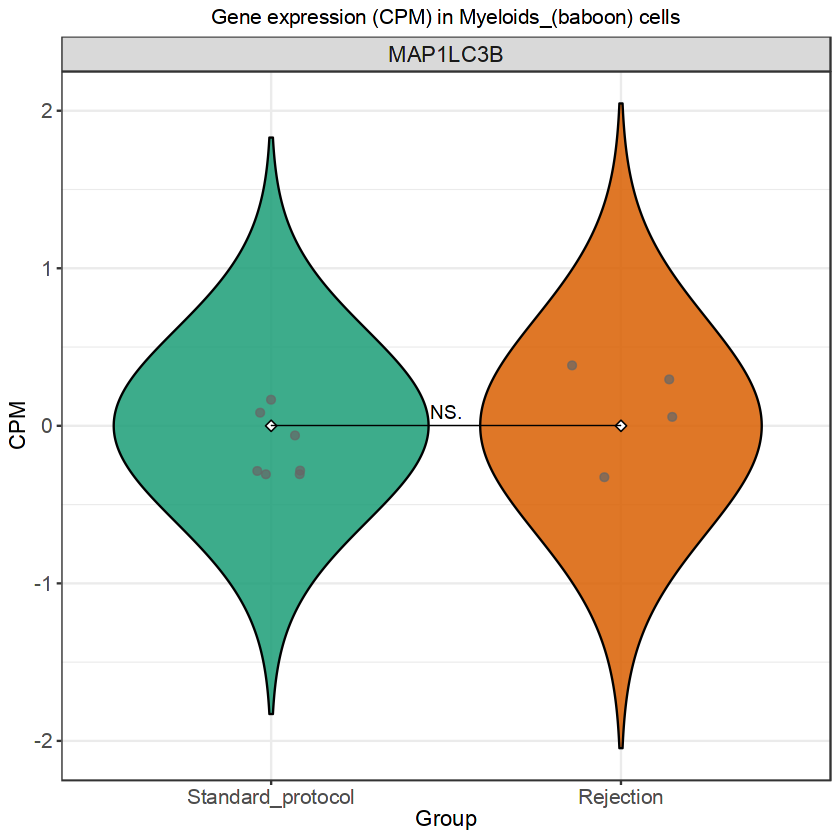

Celltype: Resident_Immune 
Genes found in CPM: MAP1LC3B 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(19.4868463786944, 25.9309200290426:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(19.4868463786944, 25.9309200290426:
“cannot compute exact p-value with ties”


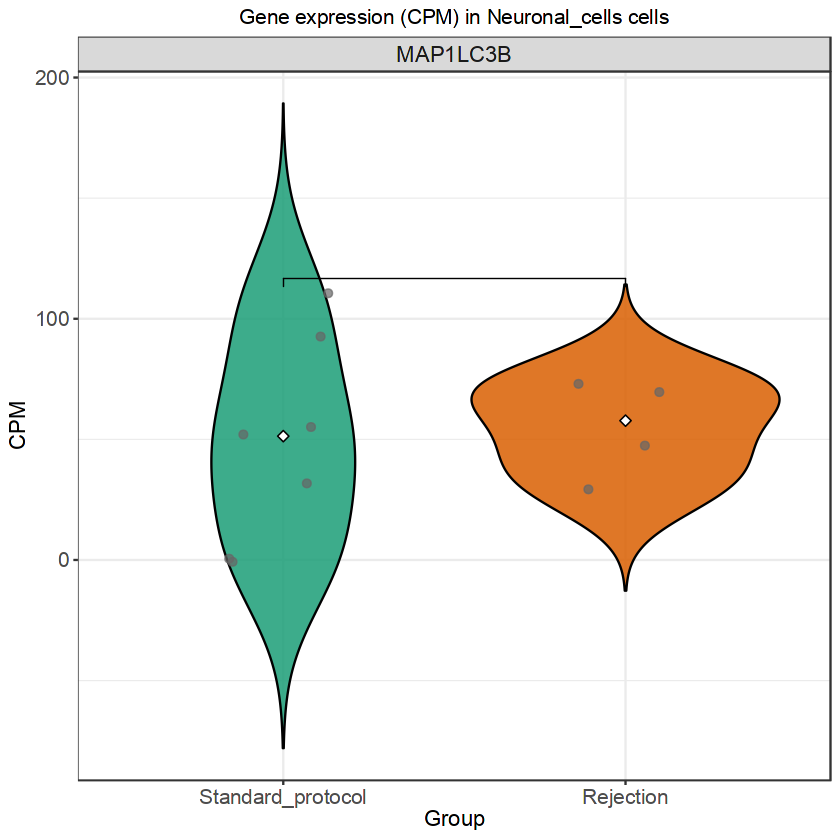

Celltype: Vascular_EC 
Genes found in CPM: MAP1LC3B 


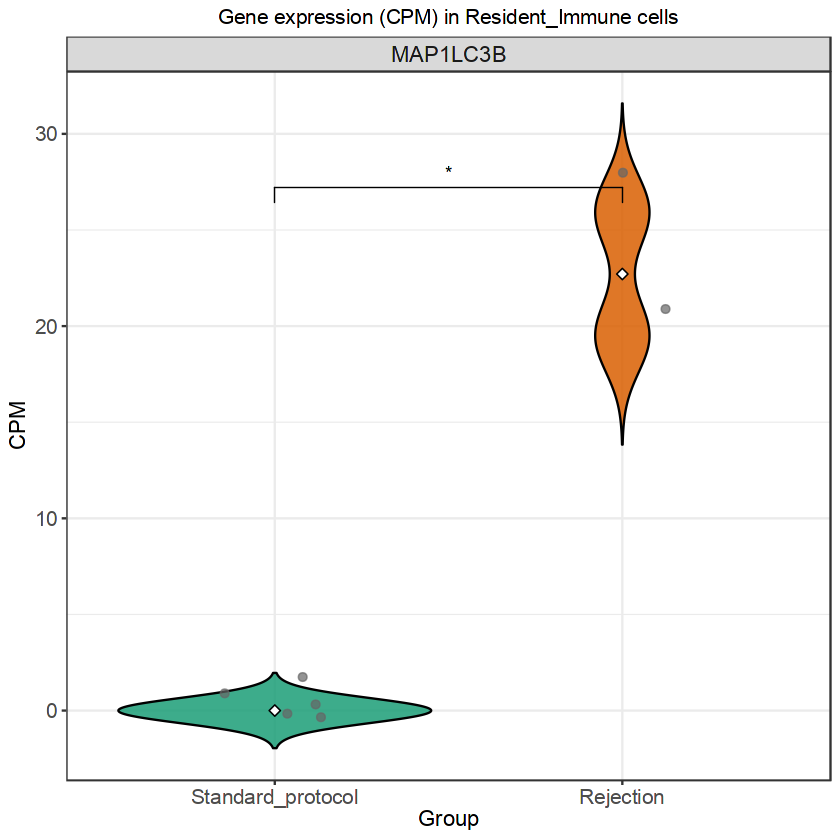

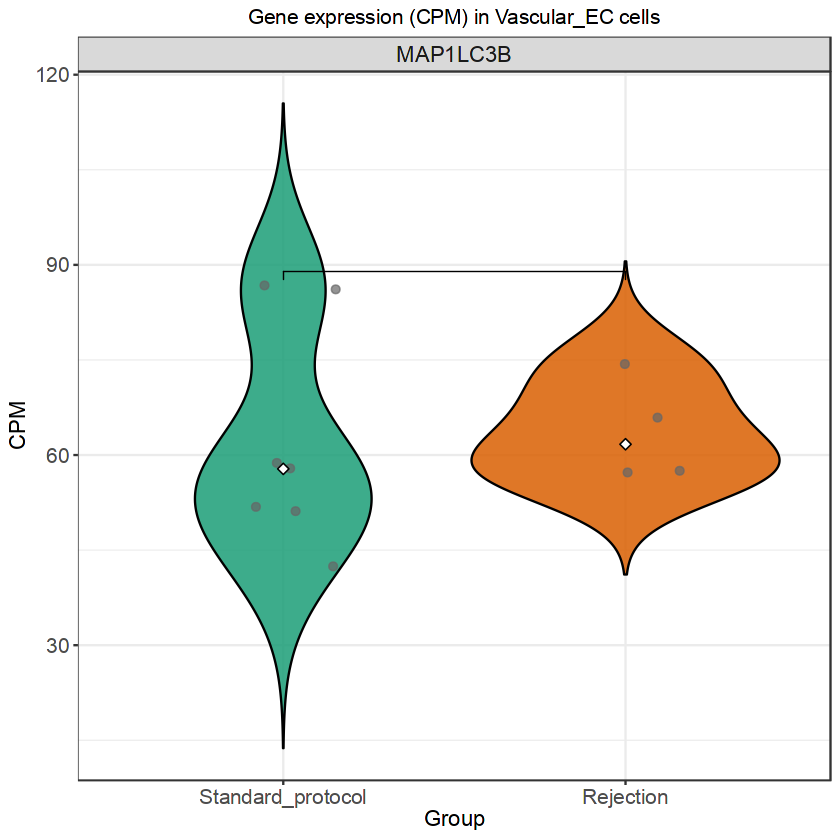

In [78]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "MAP1LC3B/"
if (!dir.exists(plotdir)) dir.create(plotdir, recursive = TRUE)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c( "MAP1LC3B"
                       
                      ) # change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1, check.names = FALSE
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1, check.names = FALSE
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Celltype:", celltype, "\n")
  cat("Genes found in CPM:", paste(genes_present, collapse = ", "), "\n")
  if (length(genes_missing)) cat("Genes not found in CPM:", paste(genes_missing, collapse = ", "), "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure facet order matches genes_of_interest
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  # Ensure group order
  df_long$group <- factor(df_long$group, levels = c("Standard_protocol", "Rejection"))
  
  # Plot: VIOLIN + JITTER (+ median point)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_violin(trim = FALSE, color = "black", width = 0.9, alpha = 0.85) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    stat_summary(fun = median, geom = "point", size = 2.2, color = "black", shape = 23, fill = "white") +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(
      title = paste0("Gene expression (CPM) in ", celltype, " cells"),
      x = "Group",
      y = "CPM"
    ) +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(
      method = "wilcox.test",
      comparisons = list(c("Standard_protocol", "Rejection")),
      label = "p.signif",
      hide.ns = TRUE
    )
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 7
  )
}


Genes found in CPM: CHMP2B 
Genes not found in CPM:  
Genes found in CPM: CHMP2B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 34.5289294880894, 0, 4.83178152616651, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 34.5289294880894, 0, 4.83178152616651, :
“cannot compute exact p-value with ties”


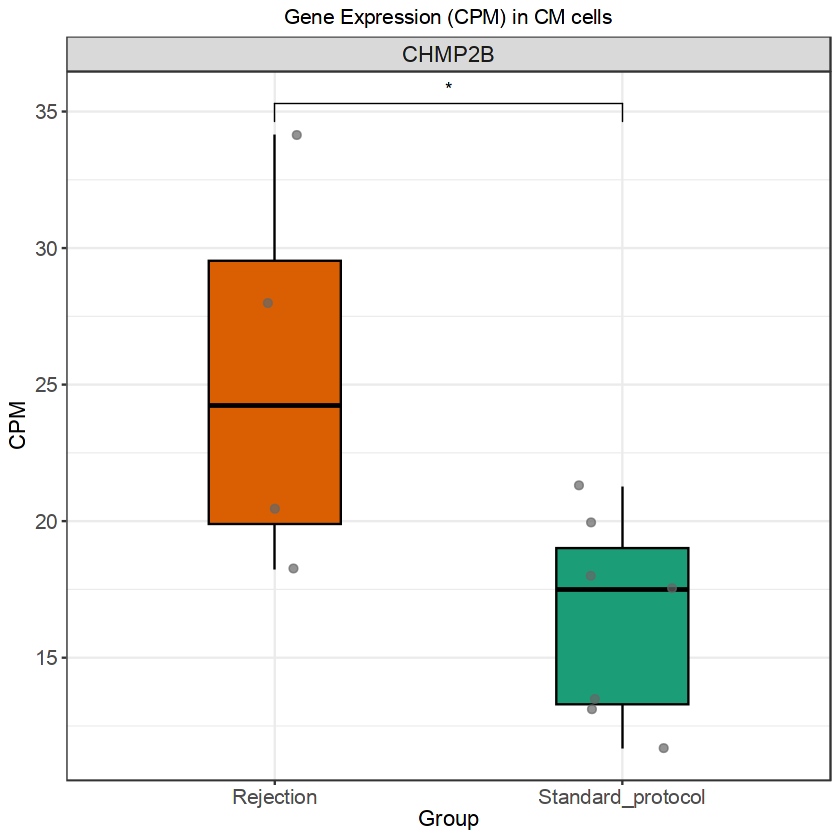

Genes found in CPM: CHMP2B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


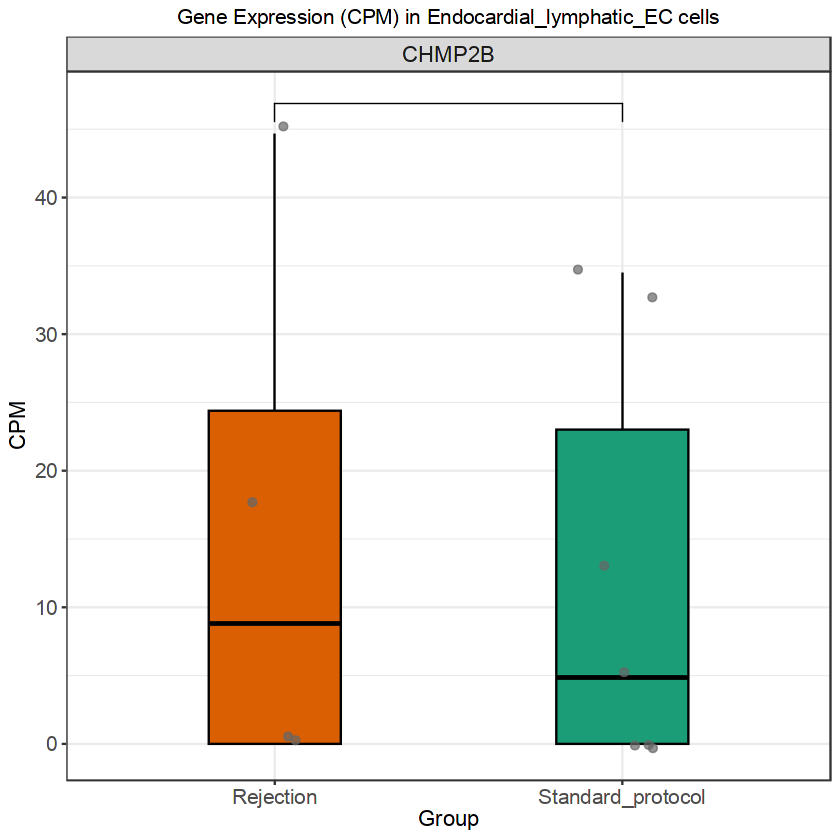

Genes found in CPM: CHMP2B 
Genes not found in CPM:  


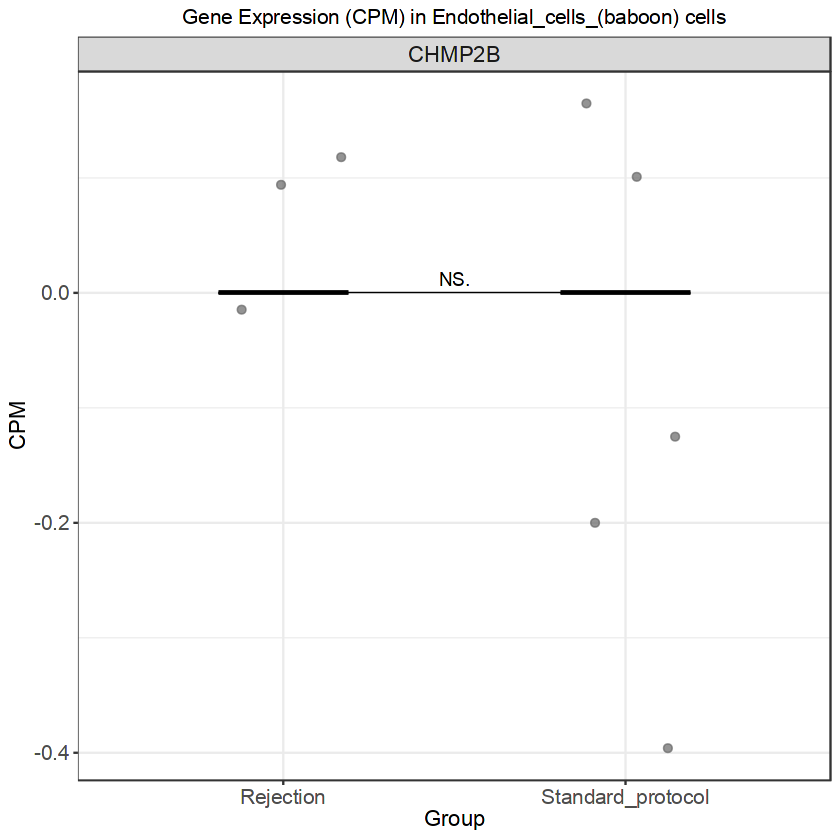

Genes found in CPM: CHMP2B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(17.0495231816684, 9.66800085078408, 10.1679749461097, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(17.0495231816684, 9.66800085078408, 10.1679749461097, :
“cannot compute exact p-value with ties”


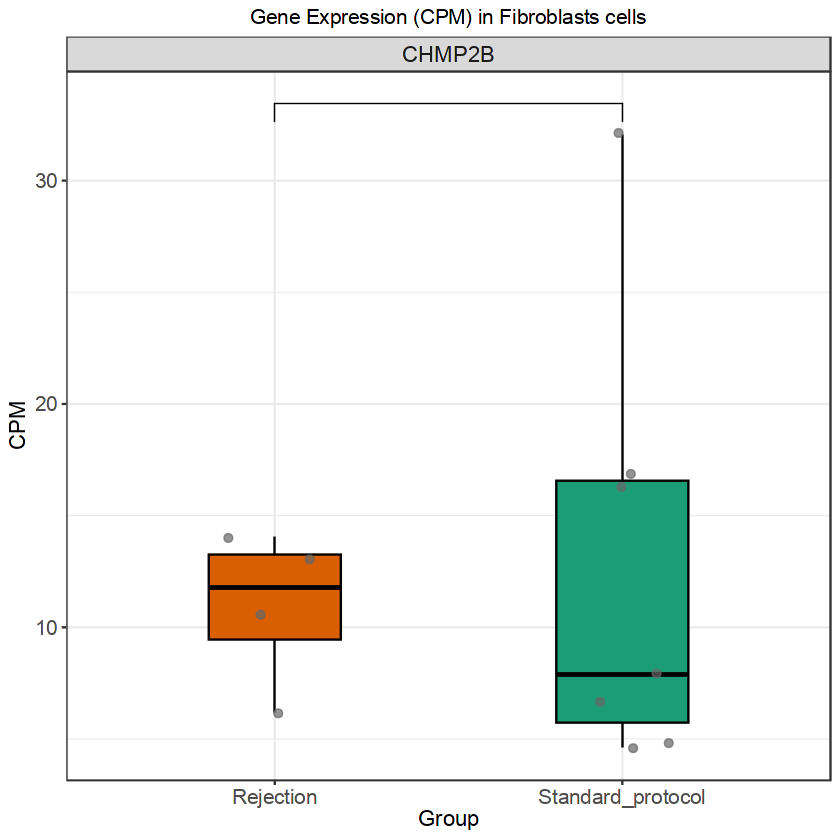

Genes found in CPM: CHMP2B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


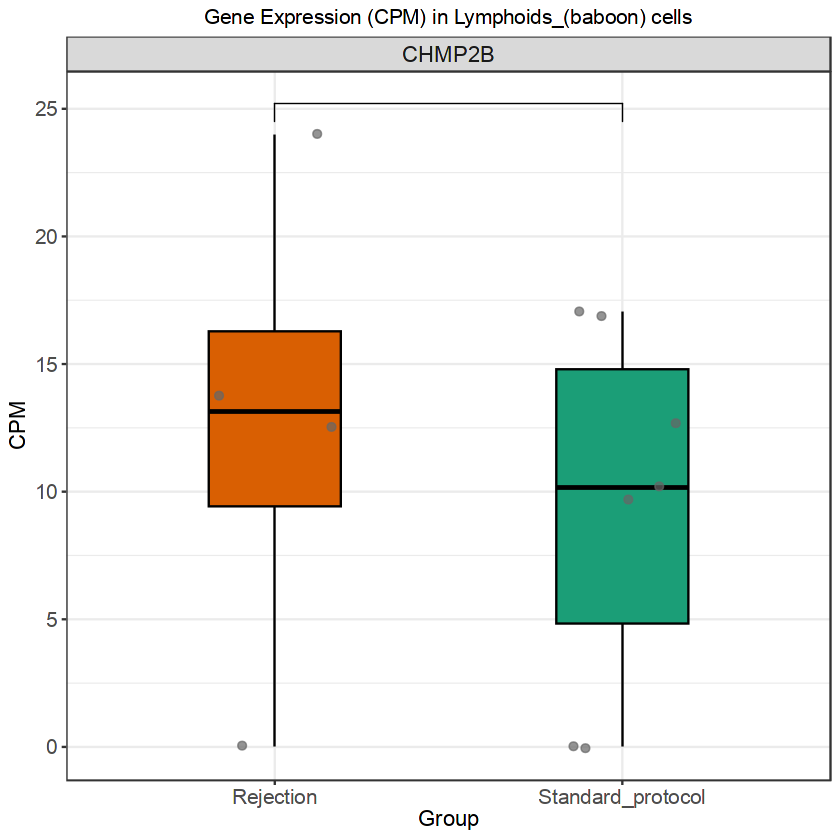

Genes found in CPM: CHMP2B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(8.94142472661594, 8.65388775907577, 7.02454375588306, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(8.94142472661594, 8.65388775907577, 7.02454375588306, :
“cannot compute exact p-value with ties”


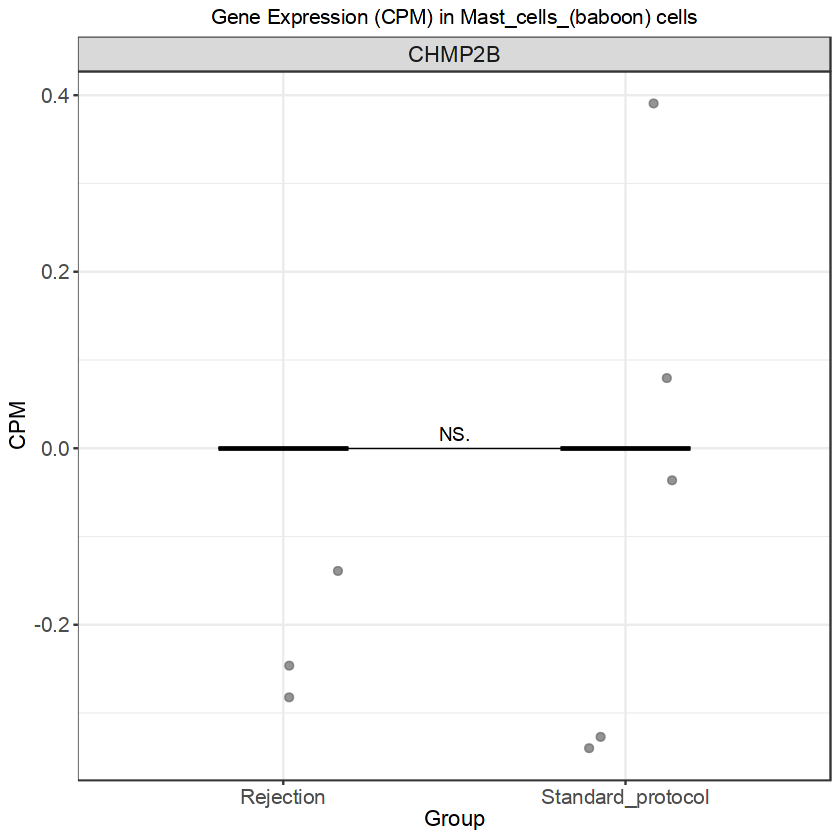

Genes found in CPM: CHMP2B 
Genes not found in CPM:  


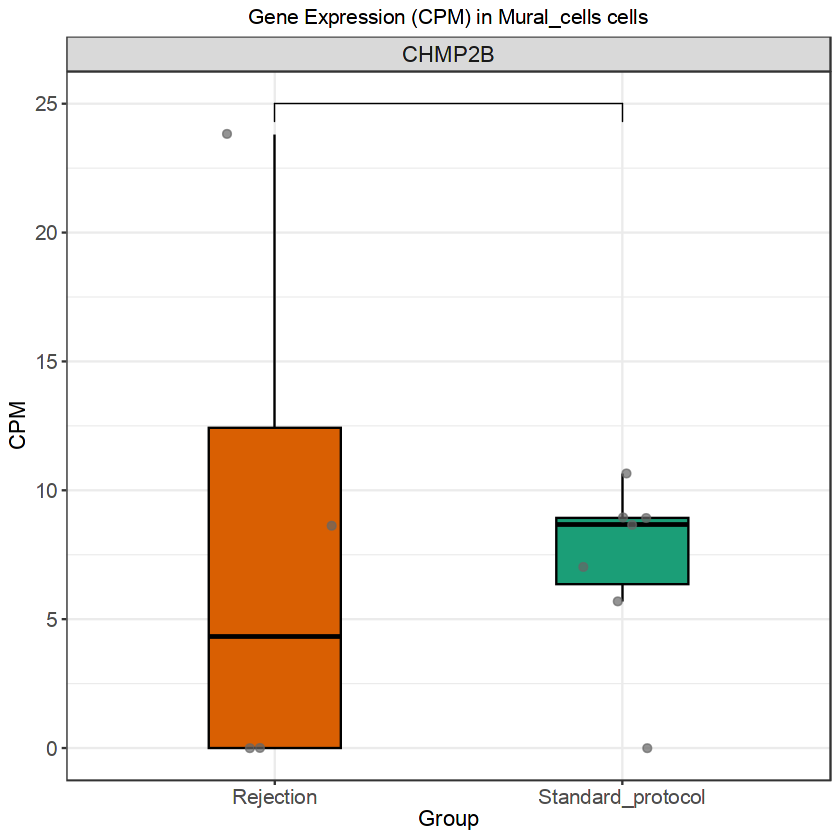

Genes found in CPM: CHMP2B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 57.1624556990968, 0, 18.7448451675789, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 57.1624556990968, 0, 18.7448451675789, :
“cannot compute exact p-value with ties”


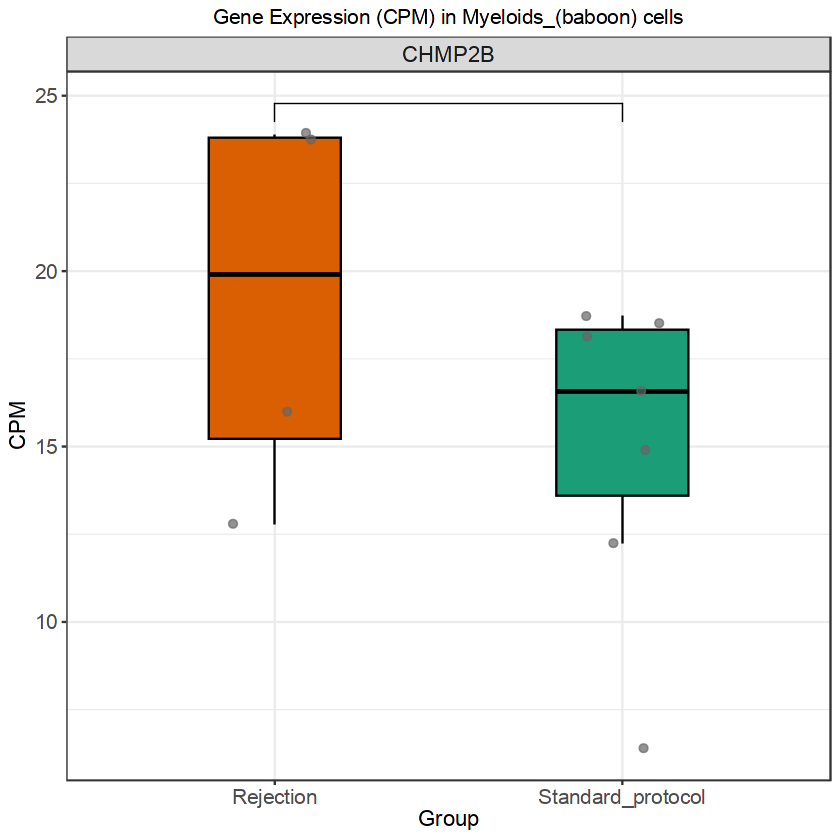

Genes found in CPM: CHMP2B 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(304.692260816575, 0, 54.2799761168105, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(304.692260816575, 0, 54.2799761168105, :
“cannot compute exact p-value with ties”


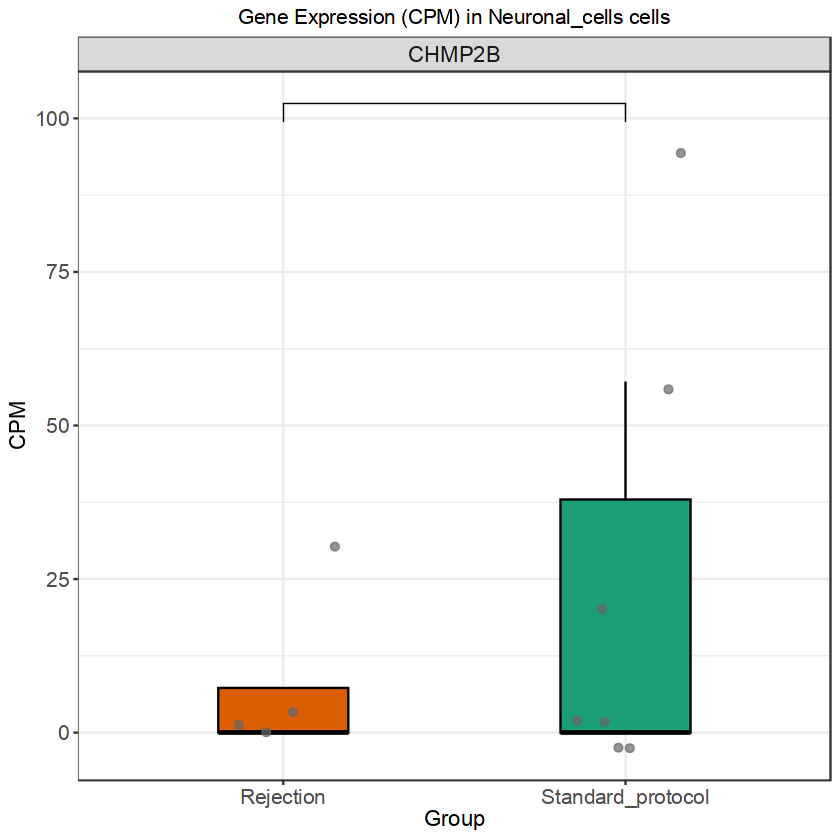

Genes found in CPM: CHMP2B 
Genes not found in CPM:  


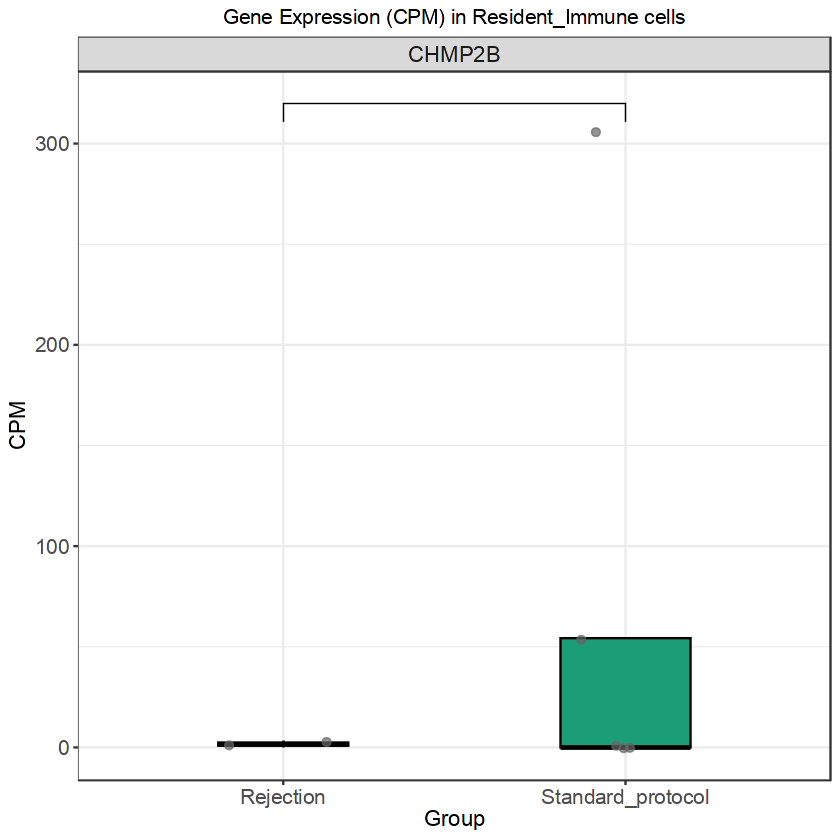

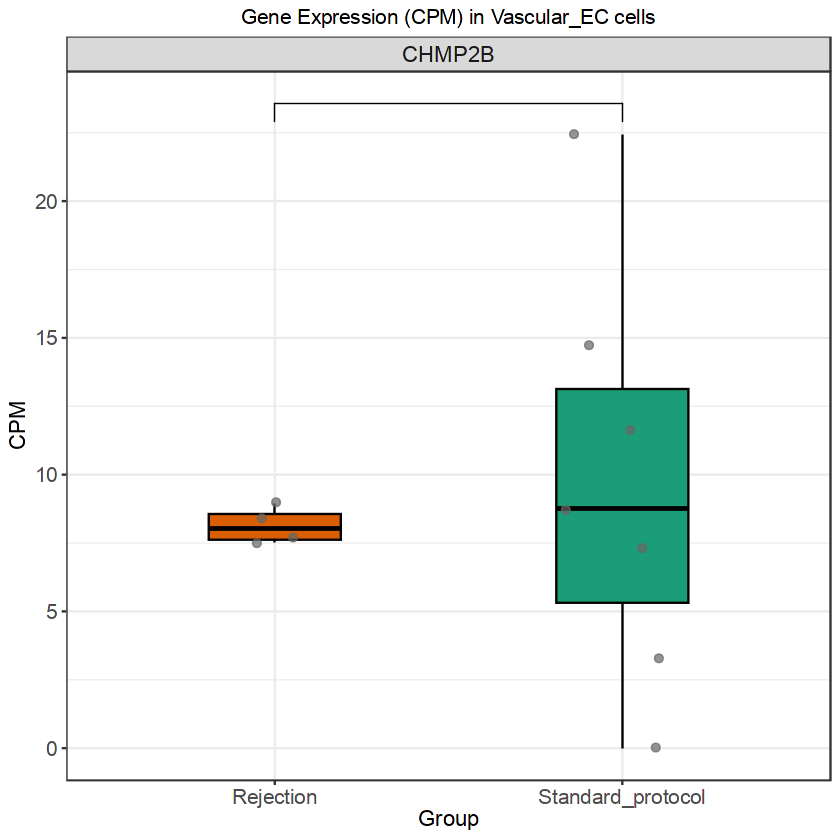

In [48]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "Autophagic_bottleneck_CHMP2B/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("CHMP2B") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 4, height = 4
  )
}


Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  
Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 23.019286325393, 21.1550666384599, 19.327126104666, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 23.019286325393, 21.1550666384599, 19.327126104666, :
“cannot compute exact p-value with ties”


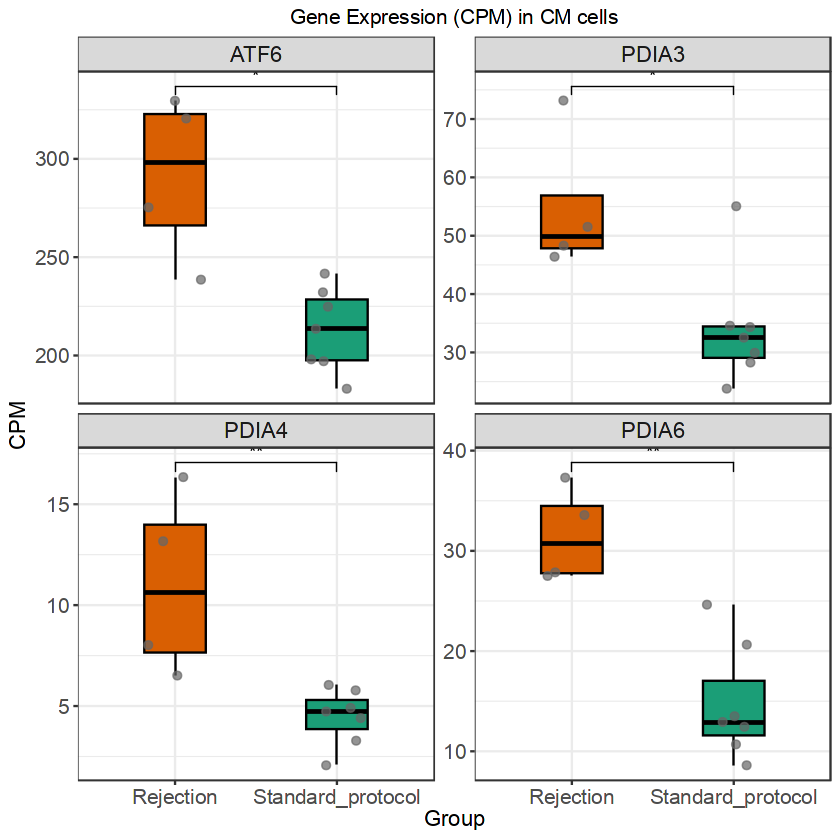

Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 977.517106549365, 0, 0, 0), c(375.93984962406, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 207.382828701783, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 207.382828701783, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 977.517106549365, 0, 0, 0), c(375.93984962406, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 207.382828701783, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 207.382828701783, :
“cannot compute exact p-val

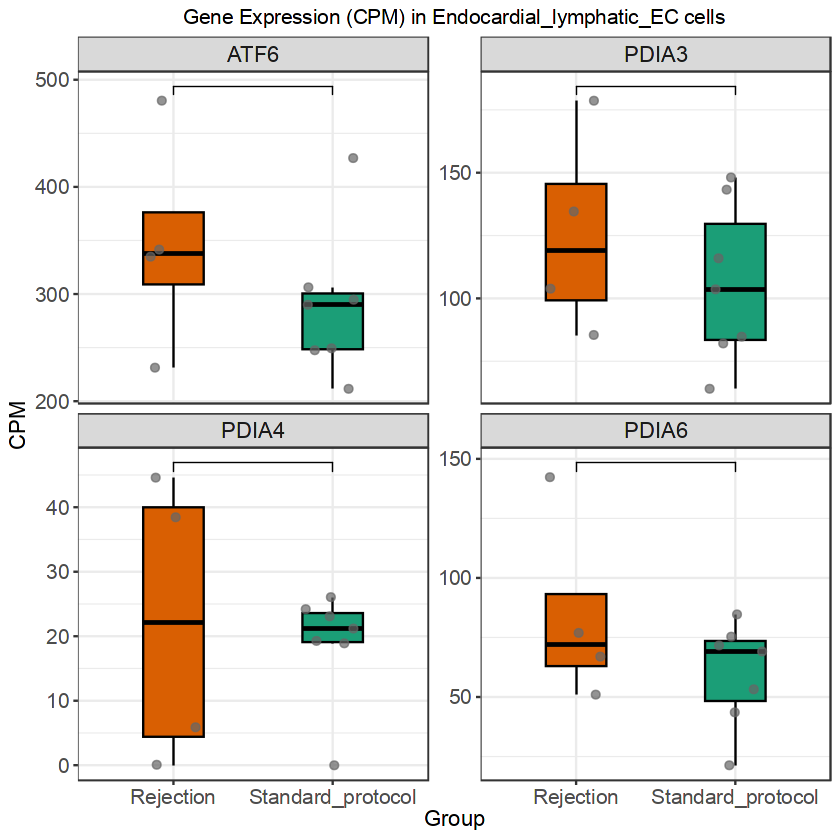

Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


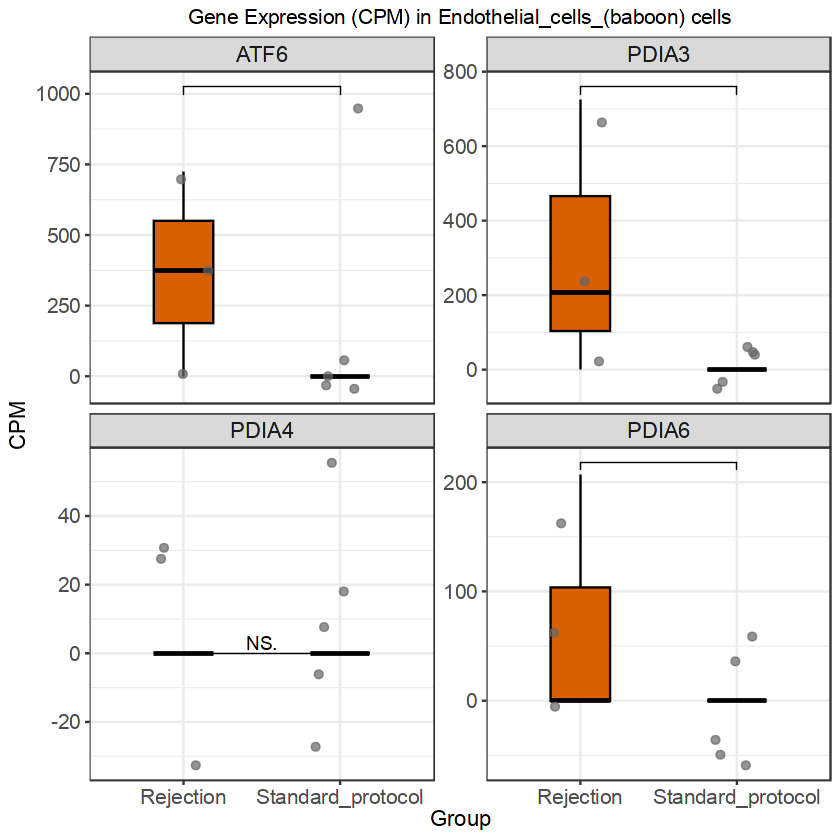

Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


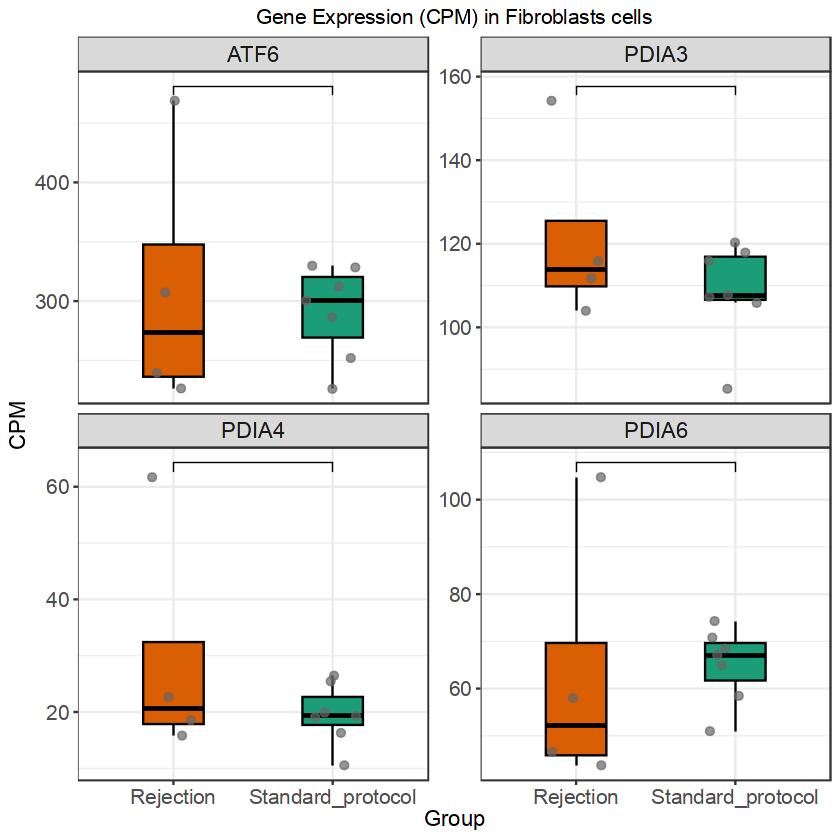

Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 212.539851222104, 755.287009063444, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 212.539851222104, 0, 0, 0), c(113.256696302169, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 212.539851222104, 755.287009063444, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 212.539851222104, 0, 0, 0), c(113.256696302169, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute e

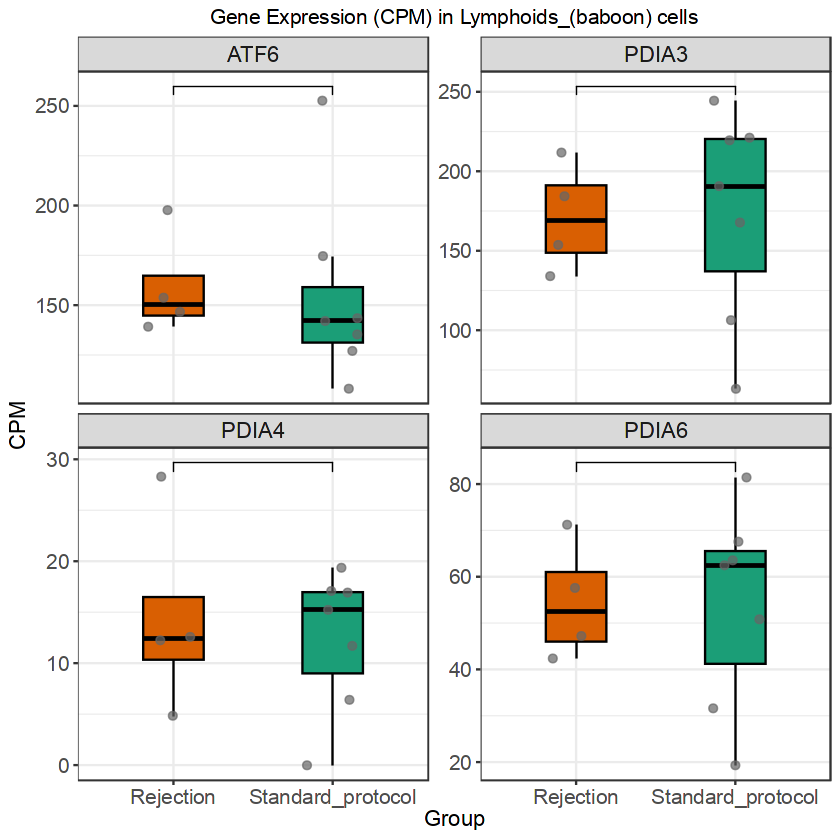

Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


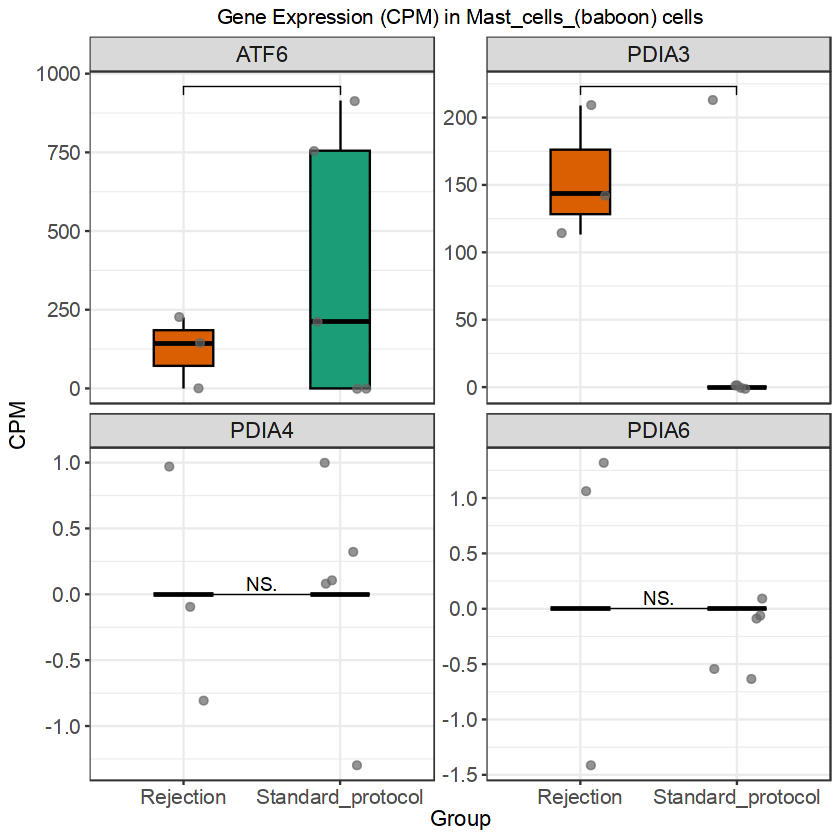

Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


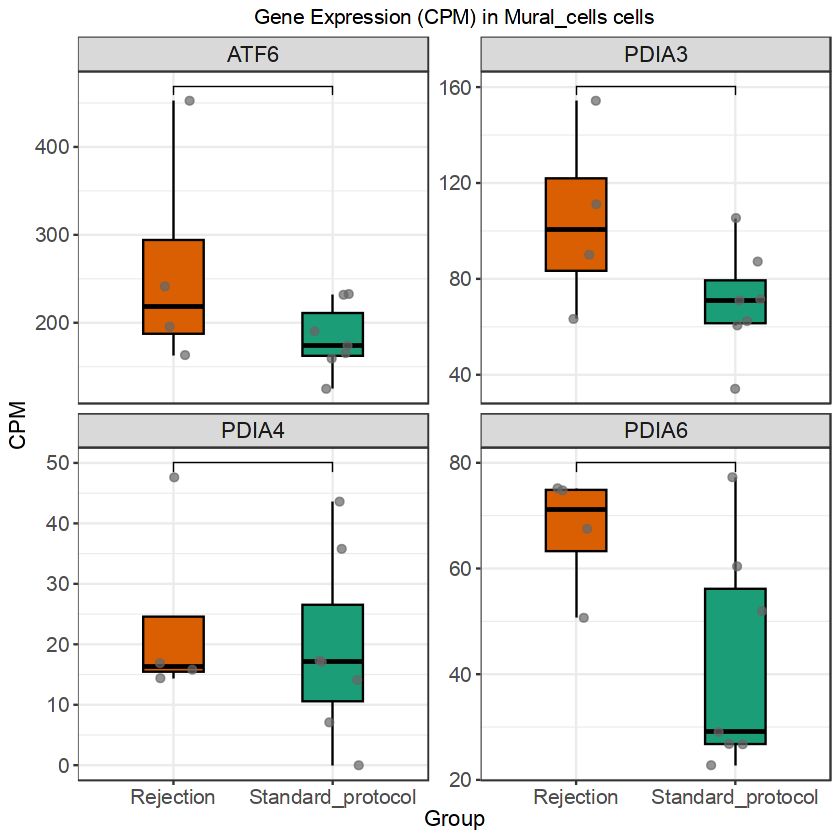

Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(92.6555068256223, 114.324911398194, 78.8519161015613, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 0, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 57.1624556990968, 78.8519161015613, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(92.6555068256223, 114.324911398194, 78.8519161015613, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 0, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 57.1624556990968, 78.8519161015613, :
“cannot compute exact p-value with ties”


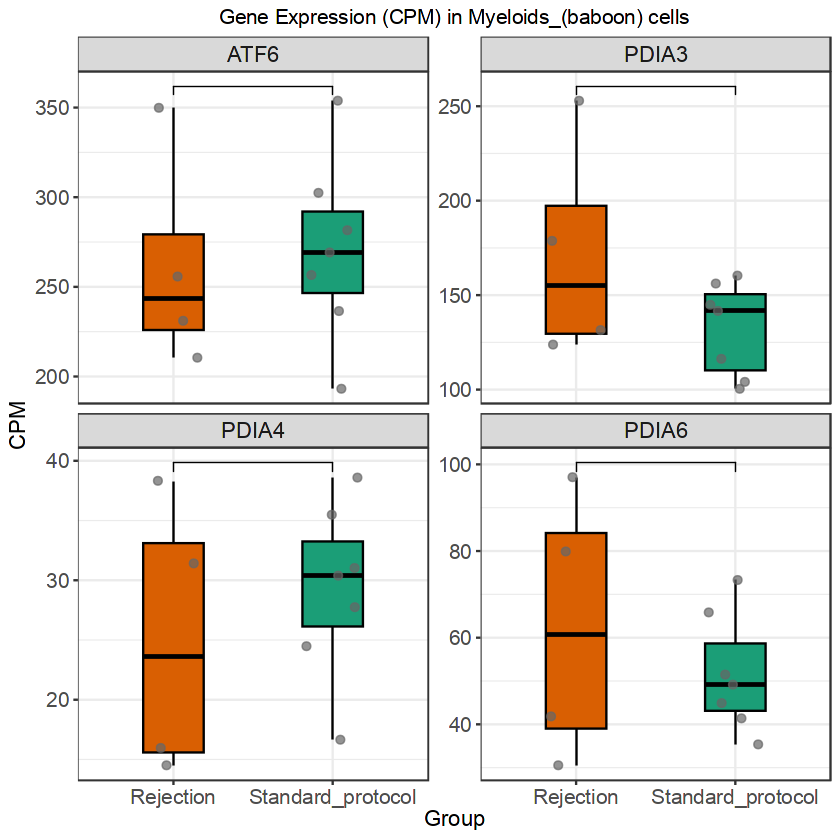

Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(609.38452163315, 0, 325.679856700863, 1017.63907734057, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 54.2799761168105, 0, 0), c(116.921078272166, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(16.239038648912, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 217.119904467242, 0, 0), c(25.9824618382592, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(609.38452163315, 0, 325.679856700863, 1017.63907734057, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 54.2799761168105, 0, 0), c(116.921078272166, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(16.239038648912, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 217.119904467242, 0, 0

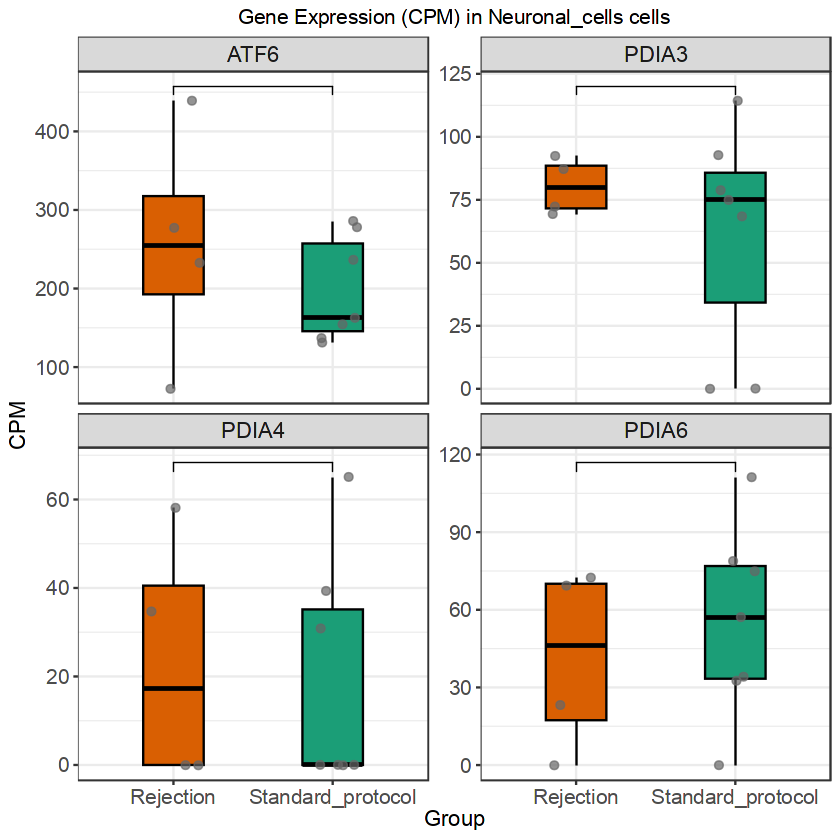

Genes found in CPM: ATF6 PDIA3 PDIA4 PDIA6 
Genes not found in CPM:  


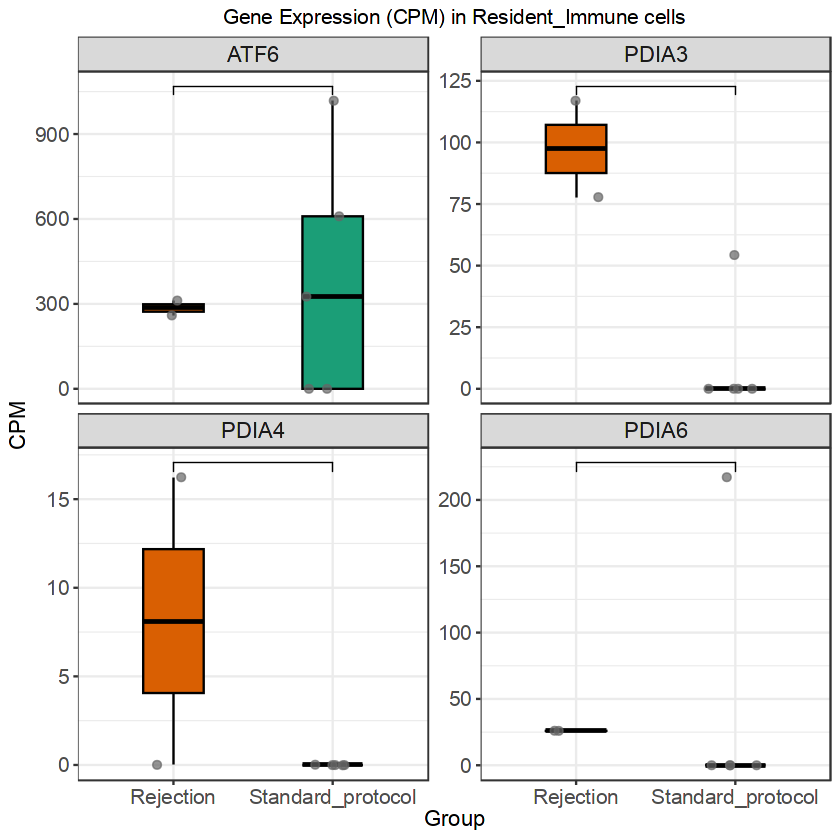

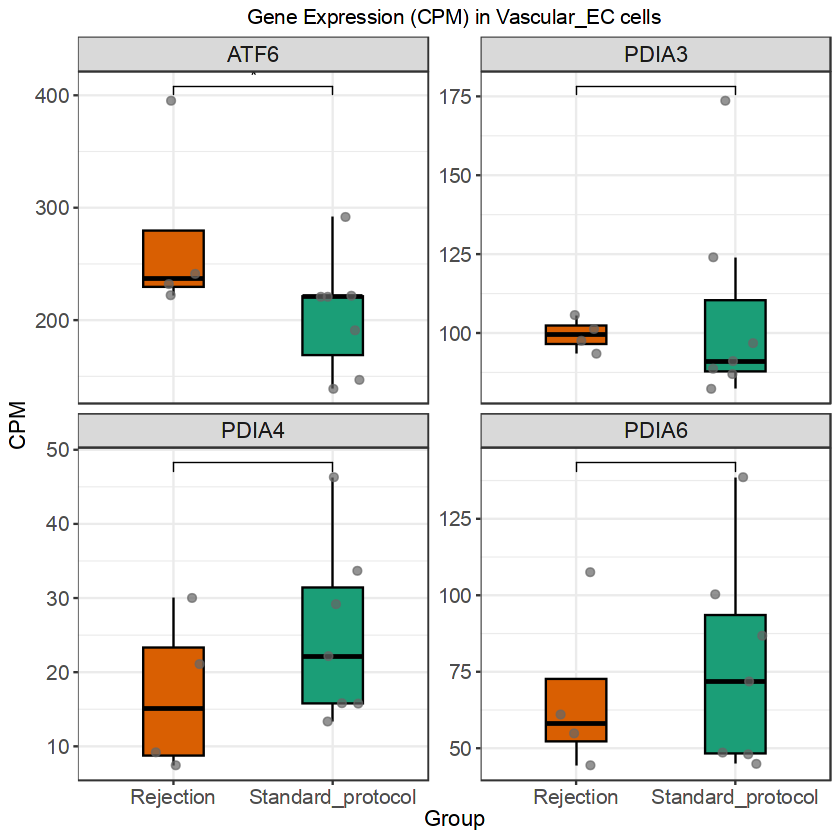

In [27]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "ATF6_PDIA/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("ATF6", "PDIA3", "PDIA4", "PDIA6") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 7
  )
}


Genes found in CPM: XBP1 
Genes not found in CPM:  
Genes found in CPM: XBP1 
Genes not found in CPM:  


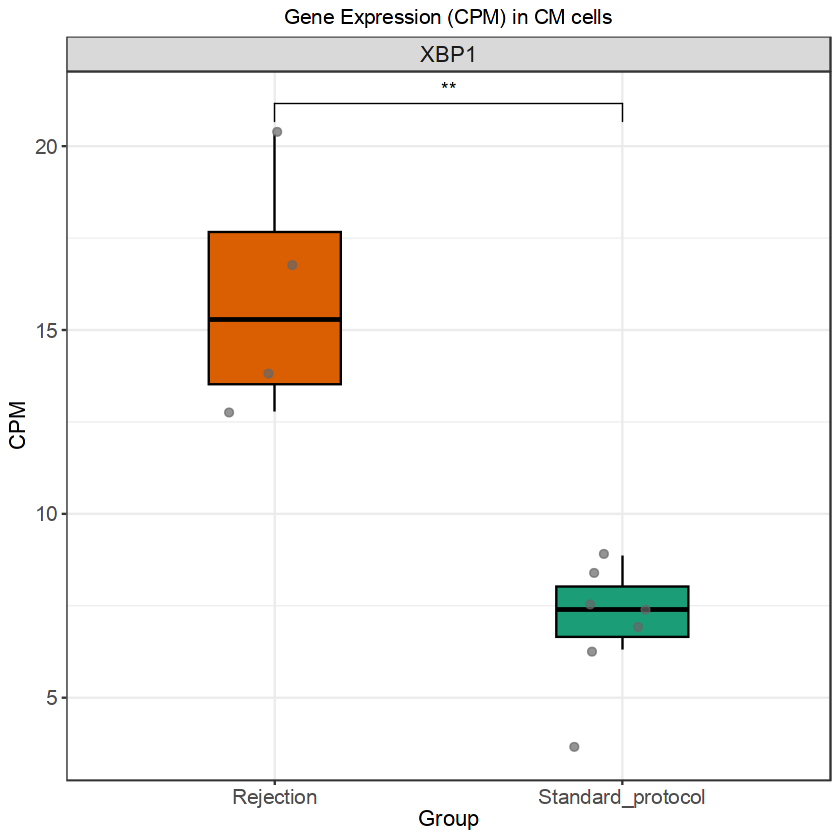

Genes found in CPM: XBP1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 362.187613183629:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 362.187613183629:
“cannot compute exact p-value with ties”


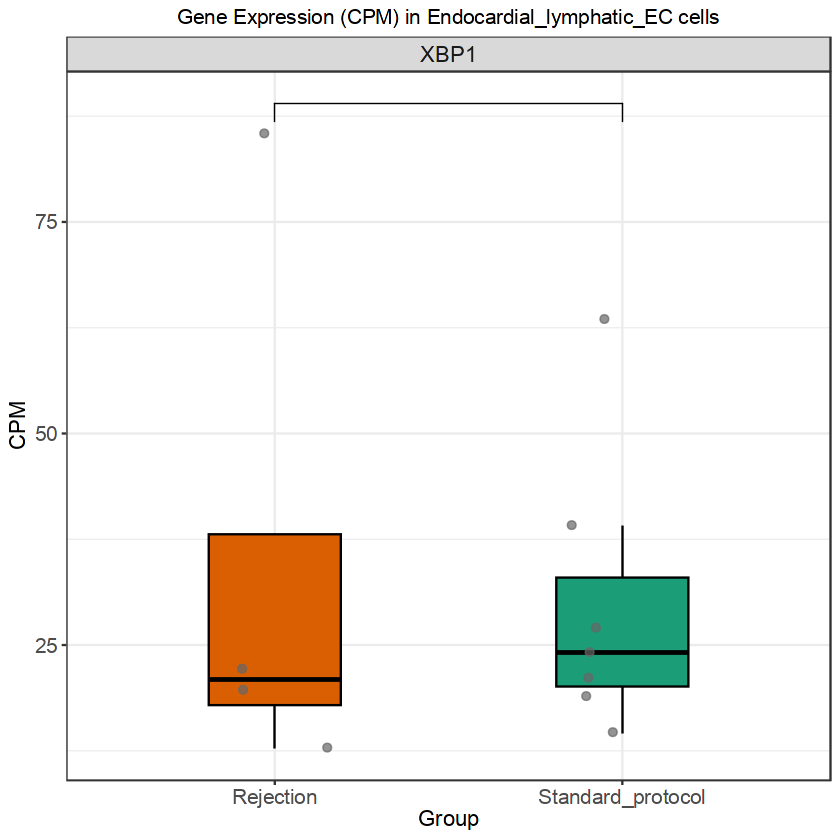

Genes found in CPM: XBP1 
Genes not found in CPM:  


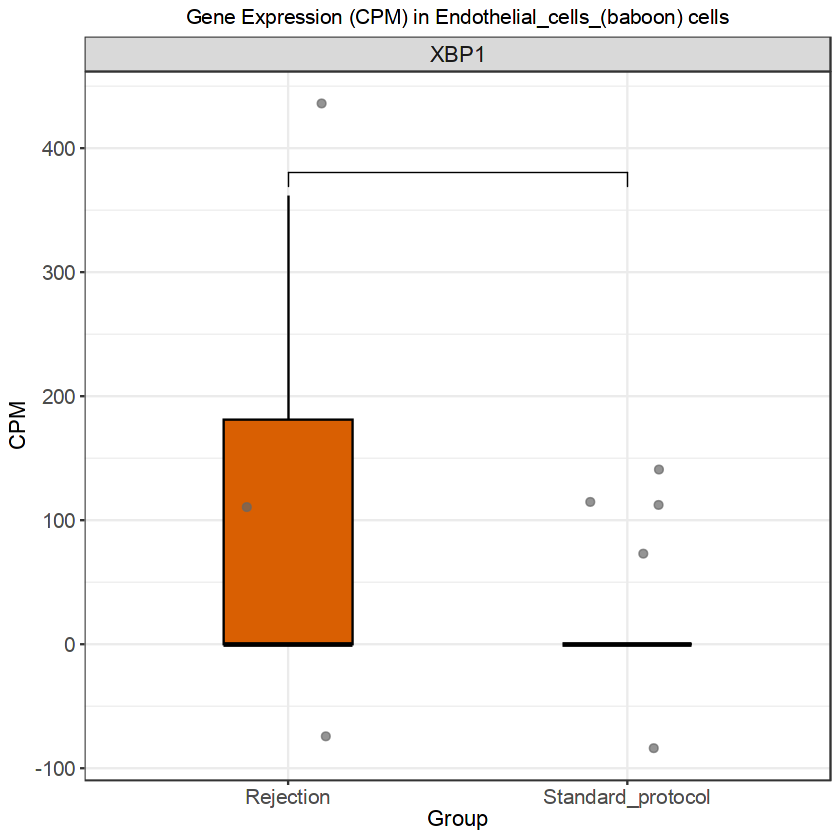

Genes found in CPM: XBP1 
Genes not found in CPM:  


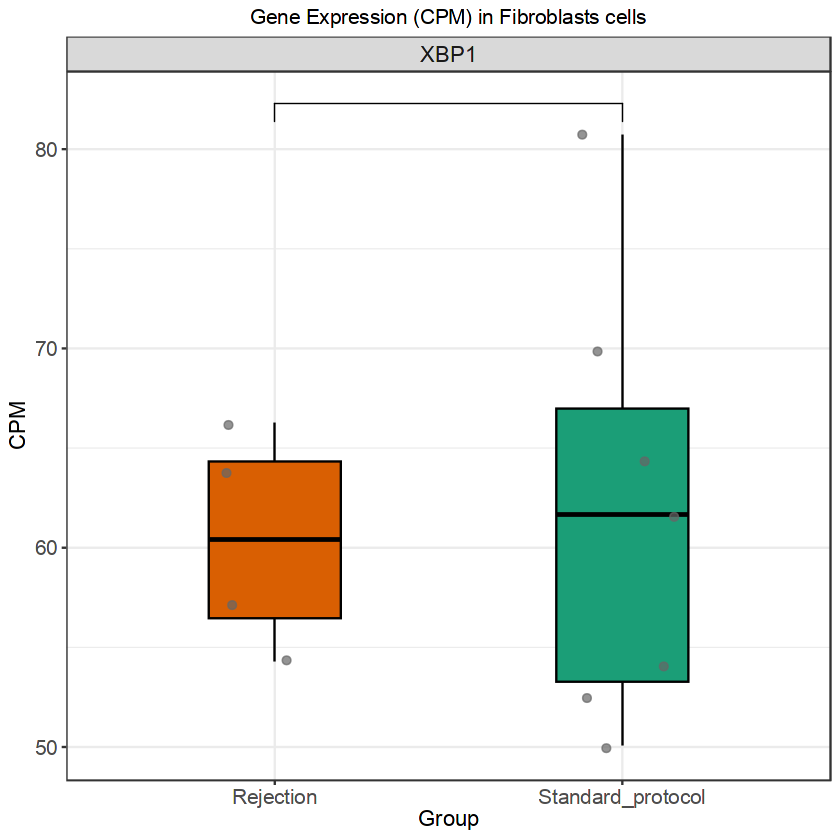

Genes found in CPM: XBP1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 480.076812289966, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 480.076812289966, 0), c(0, 0, :
“cannot compute exact p-value with ties”


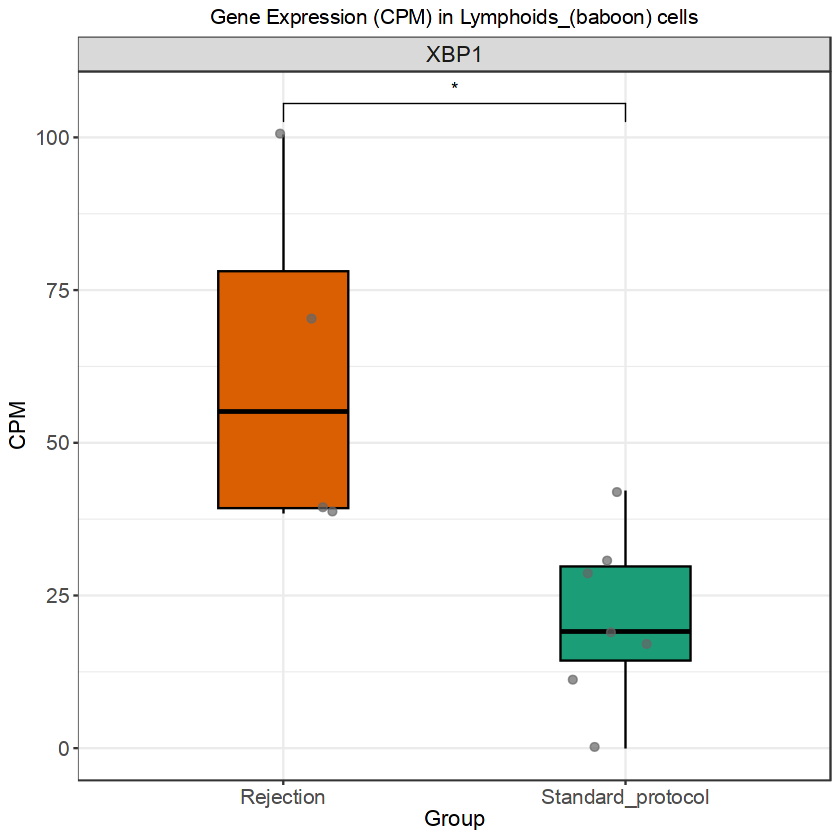

Genes found in CPM: XBP1 
Genes not found in CPM:  


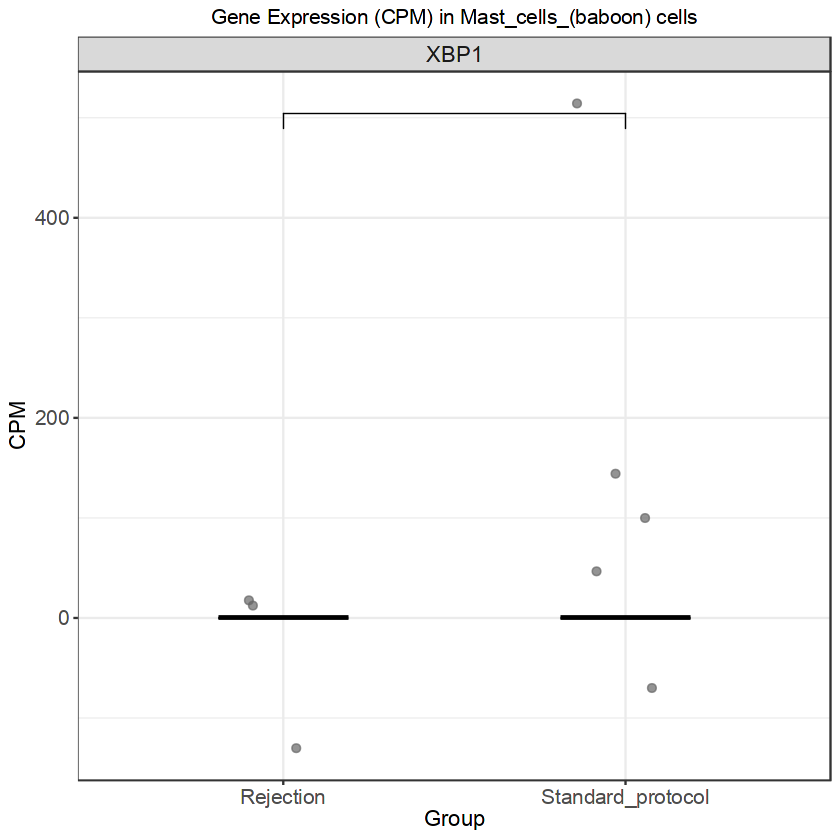

Genes found in CPM: XBP1 
Genes not found in CPM:  


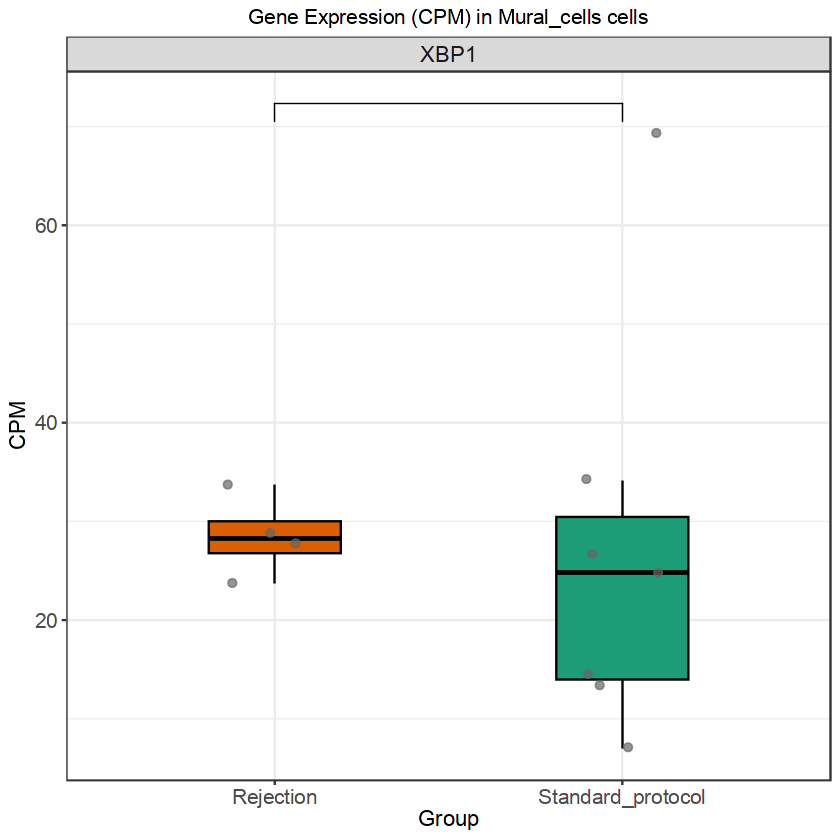

Genes found in CPM: XBP1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 78.8519161015613, 0, 68.452126294173, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 78.8519161015613, 0, 68.452126294173, :
“cannot compute exact p-value with ties”


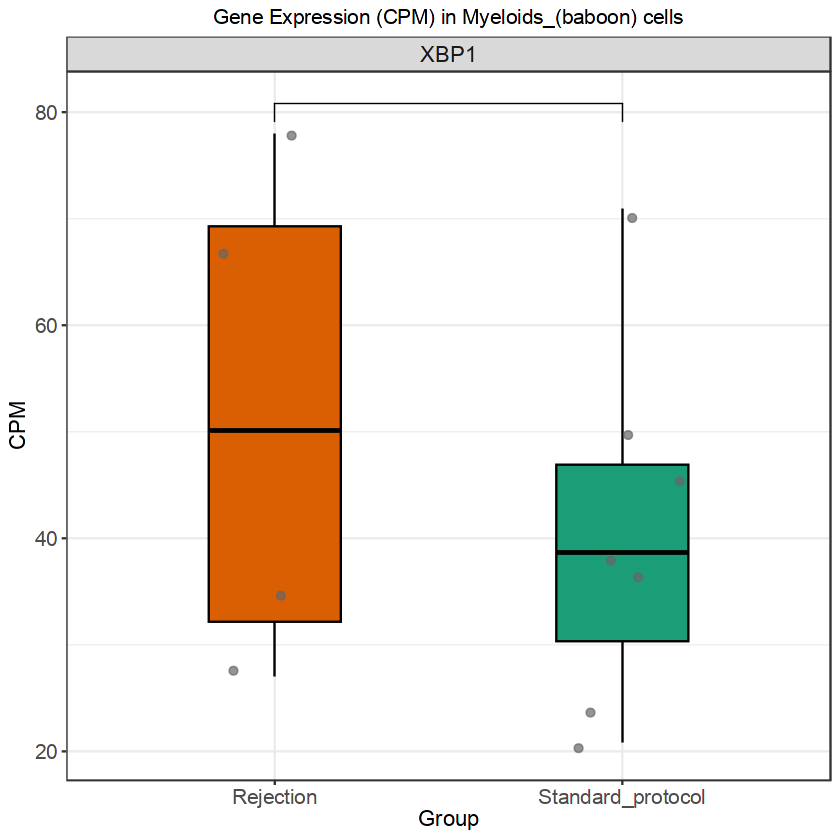

Genes found in CPM: XBP1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 54.2799761168105, 0, 0), c(19.4868463786944, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 54.2799761168105, 0, 0), c(19.4868463786944, :
“cannot compute exact p-value with ties”


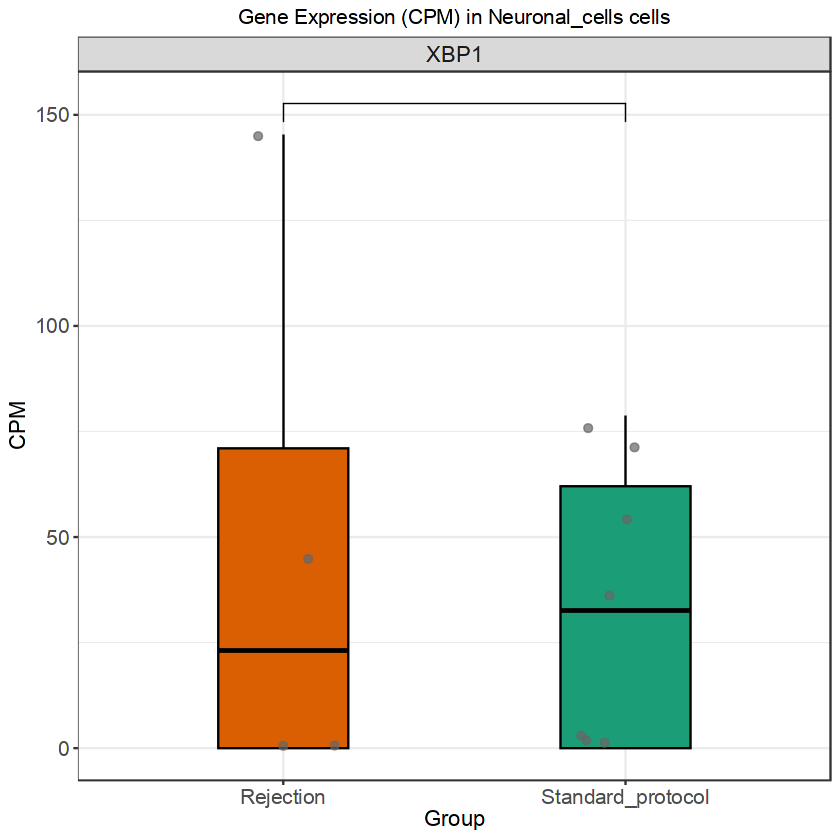

Genes found in CPM: XBP1 
Genes not found in CPM:  


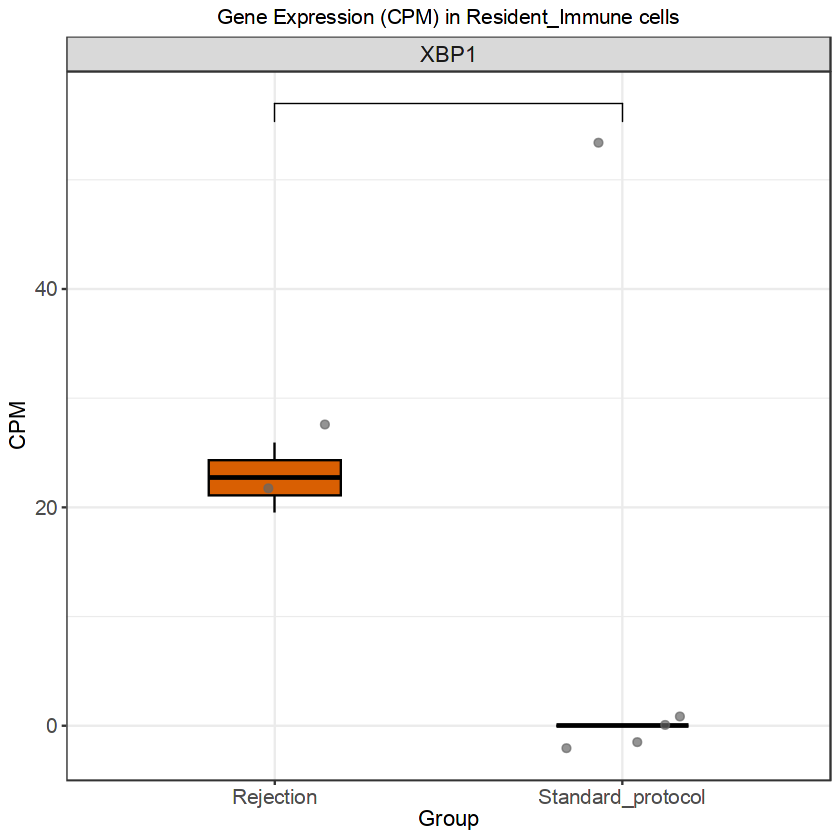

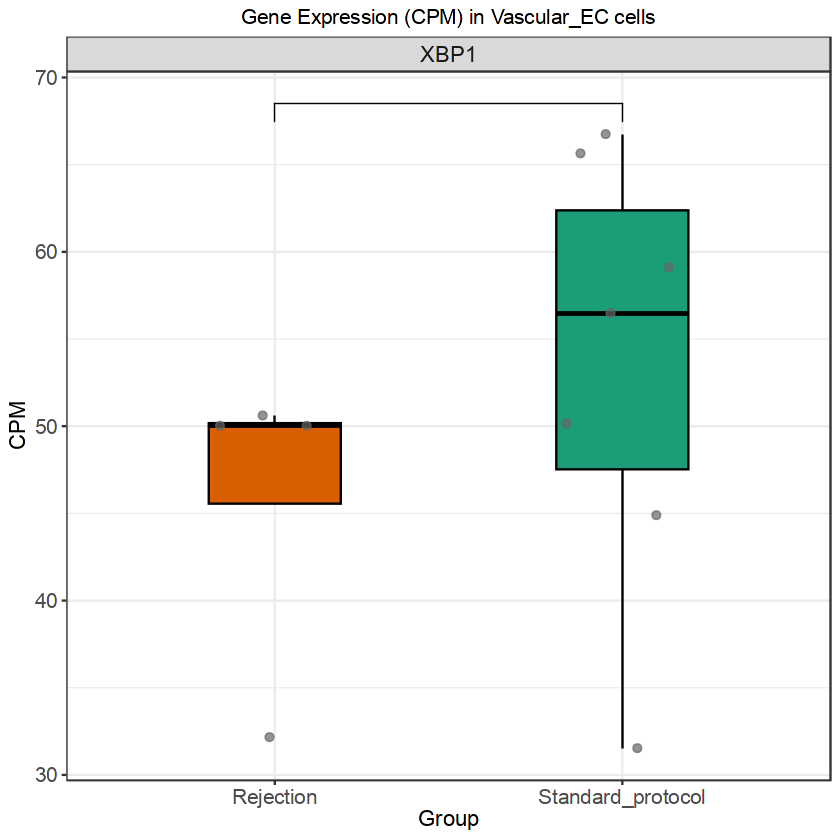

In [29]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "XBP1_/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("XBP1") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 7
  )
}


Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 
Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 4.71275743437485, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 4.71275743437485, 0, 0), c(0, :
“cannot compute exact p-value with ties”


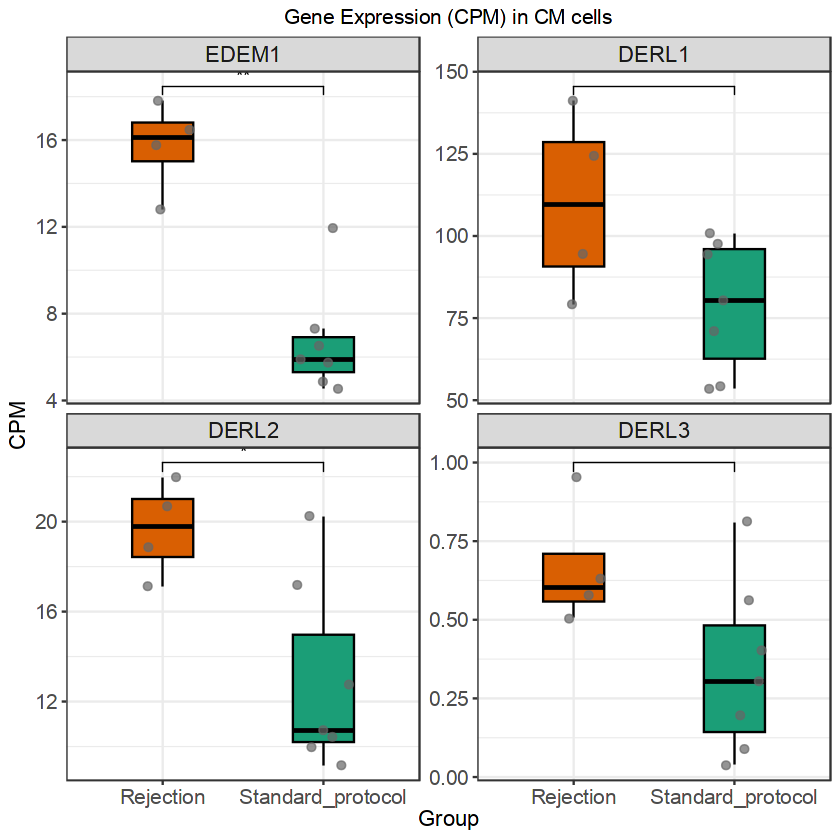

Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 732.600732600733), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 294.290759270159, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 488.758553274682, 0, 0, 366.300366300366:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 732.600732600733), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 294.290759270159, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 488.758553274682, 0, 0, 366.300366300366:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


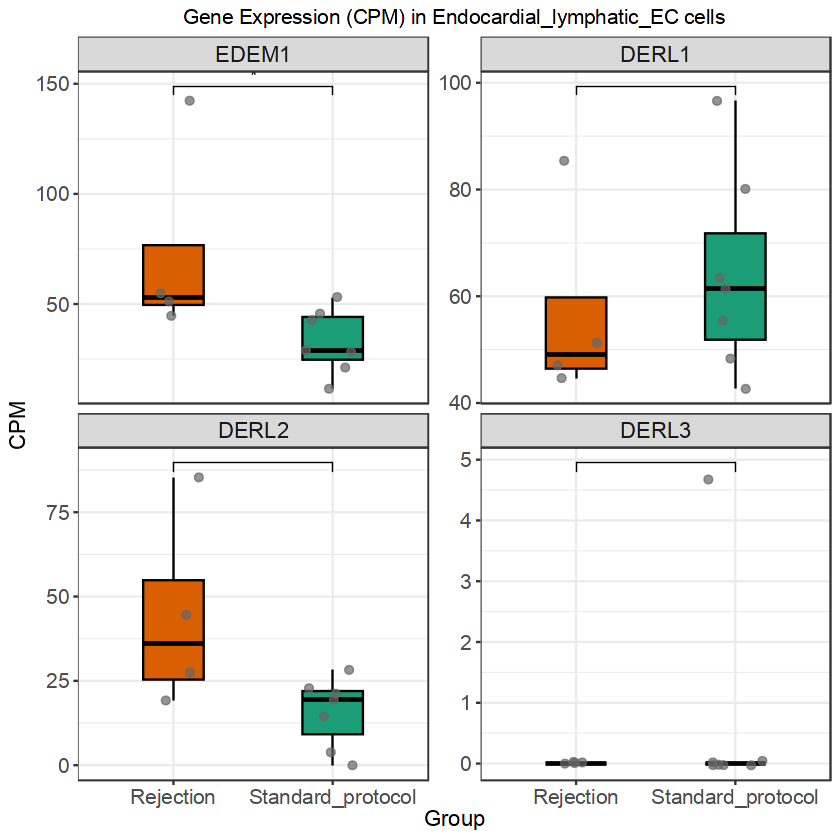

Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(2.63453239684488, 0, 0, 0, 0.371489378932912, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(2.63453239684488, 0, 0, 0, 0.371489378932912, :
“cannot compute exact p-value with ties”


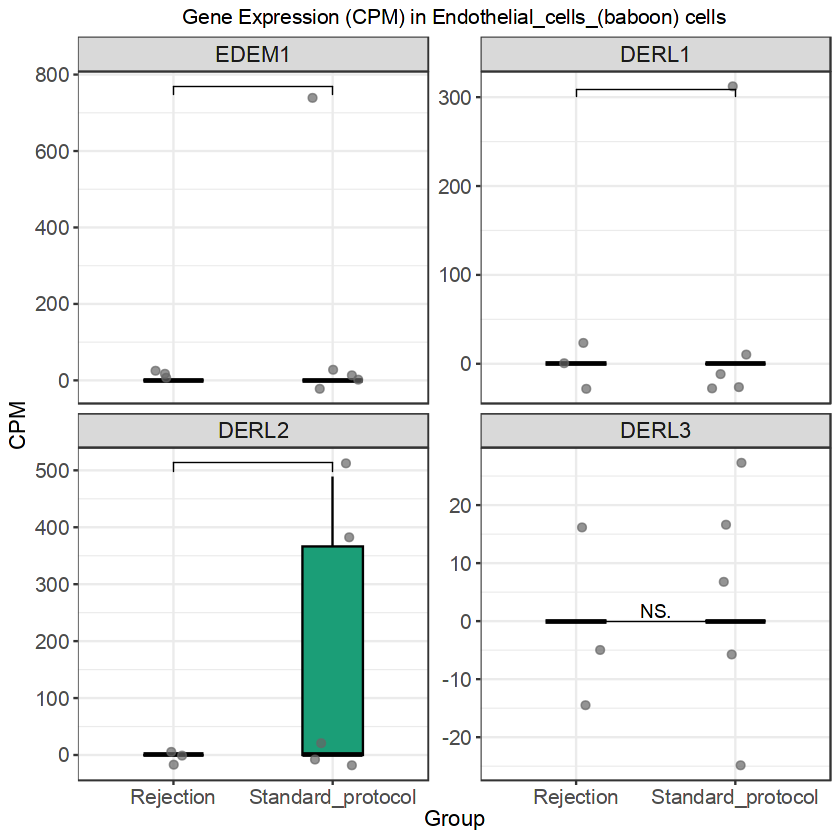

Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 31.5736297044708, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 31.5736297044708, 0, 0), c(0, :
“cannot compute exact p-value with ties”


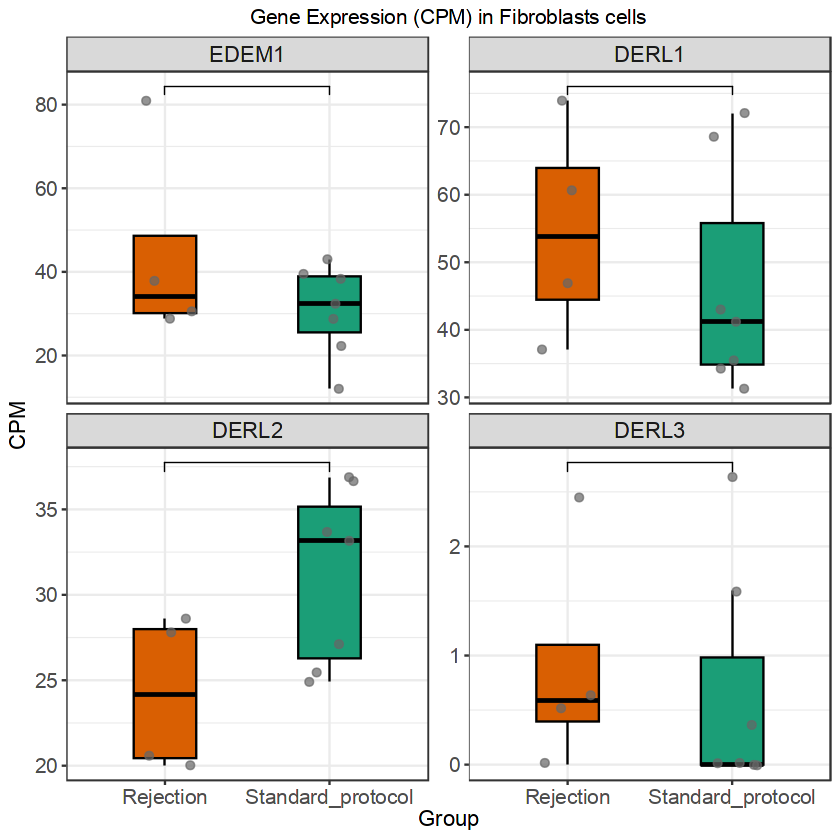

Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(113.256696302169, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 914.076782449726), c(56.6283481510844, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 143.36917562724, 0:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(113.256696302169, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 914.076782449726), c(56.6283481510844, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 143.36917562724, 0:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-v

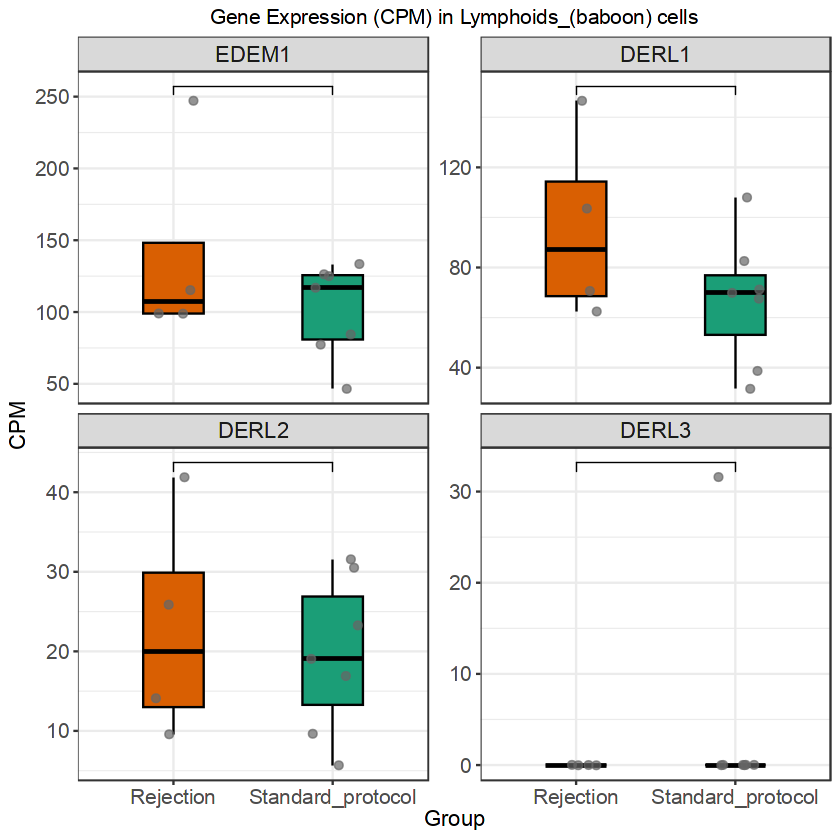

Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(0, 0, 7.02454375588306, 0, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 7.02454375588306, 0, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”


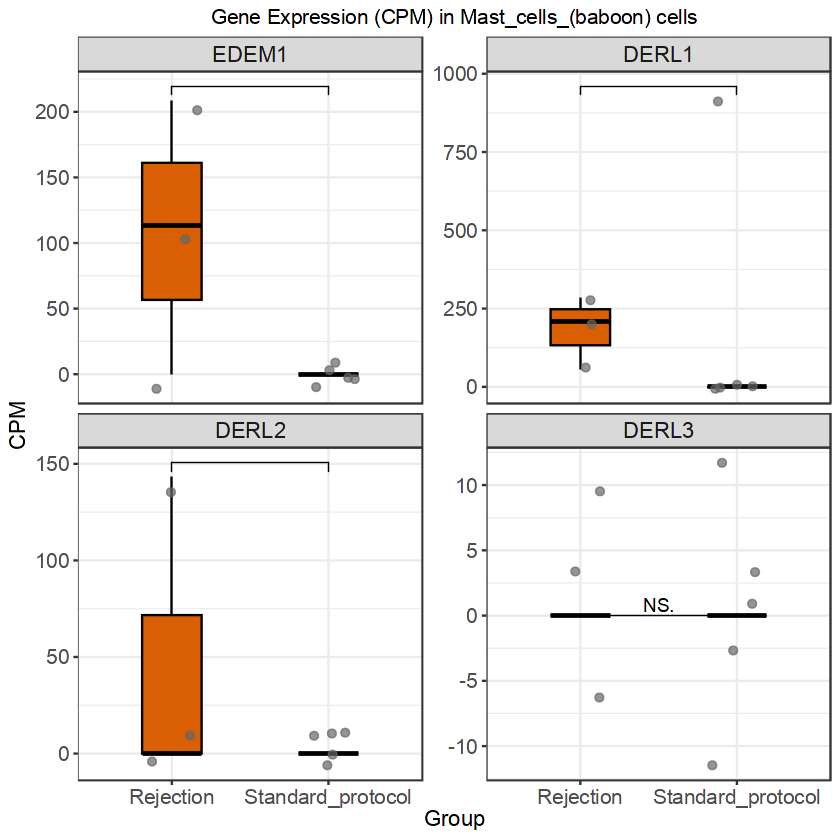

Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(0, 0, 2.36537469900607, 0, 0, 0, 5.06428262748488:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 2.36537469900607, 0, 0, 0, 5.06428262748488:
“cannot compute exact p-value with ties”


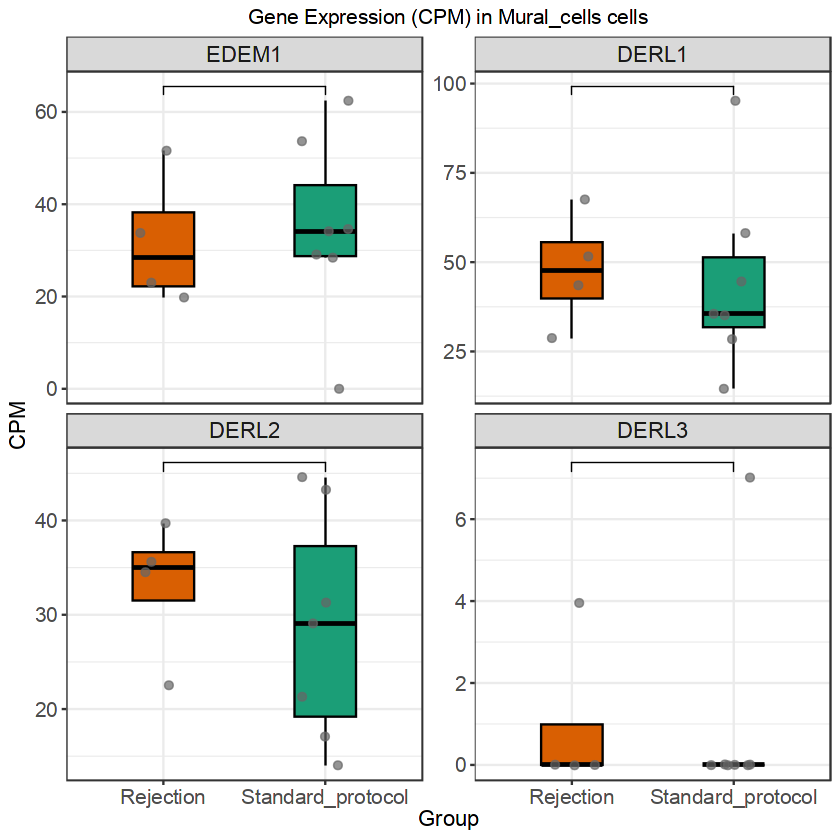

Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(30.8851689418741, 0, 0, 56.2345355027367, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 57.1624556990968, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 0, 0, 18.7448451675789, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 34.6488340667337, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 0, 0, 56.2345355027367, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 57.1624556990968, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 0, 0, 18.7448451675789, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 34.6488340667337,

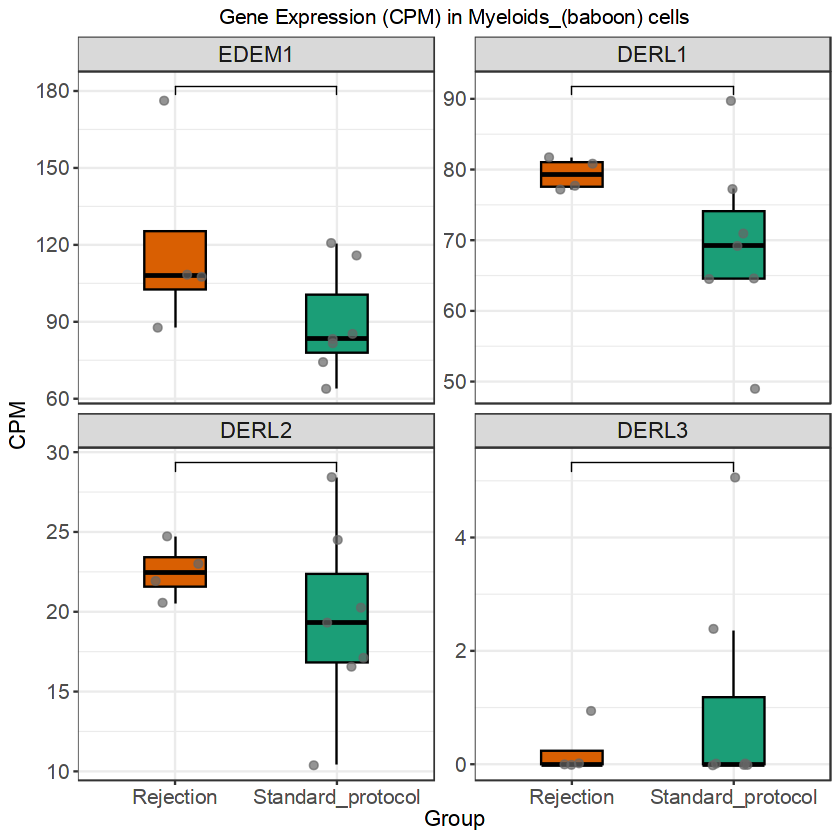

Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(0, 0, 108.559952233621, 0, 0), c(81.1951932445599, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 162.839928350432, 0, 0), c(0, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 377.073906485671), c(16.239038648912, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 108.559952233621, 0, 0), c(81.1951932445599, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 162.839928350432, 0, 0), c(0, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 377.073906485671), c(16.239038648912, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot

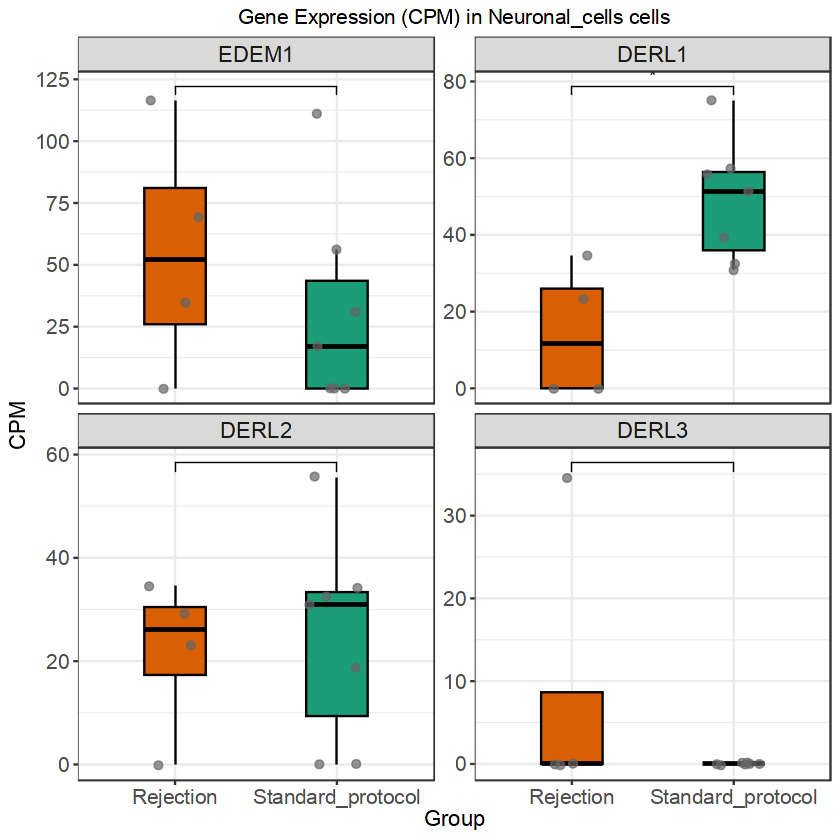

Genes found in CPM: EDEM1 DERL1 DERL2 DERL3 
Genes not found in CPM: SERL1 


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(3.0638709865205, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(3.0638709865205, :
“cannot compute exact p-value with ties”


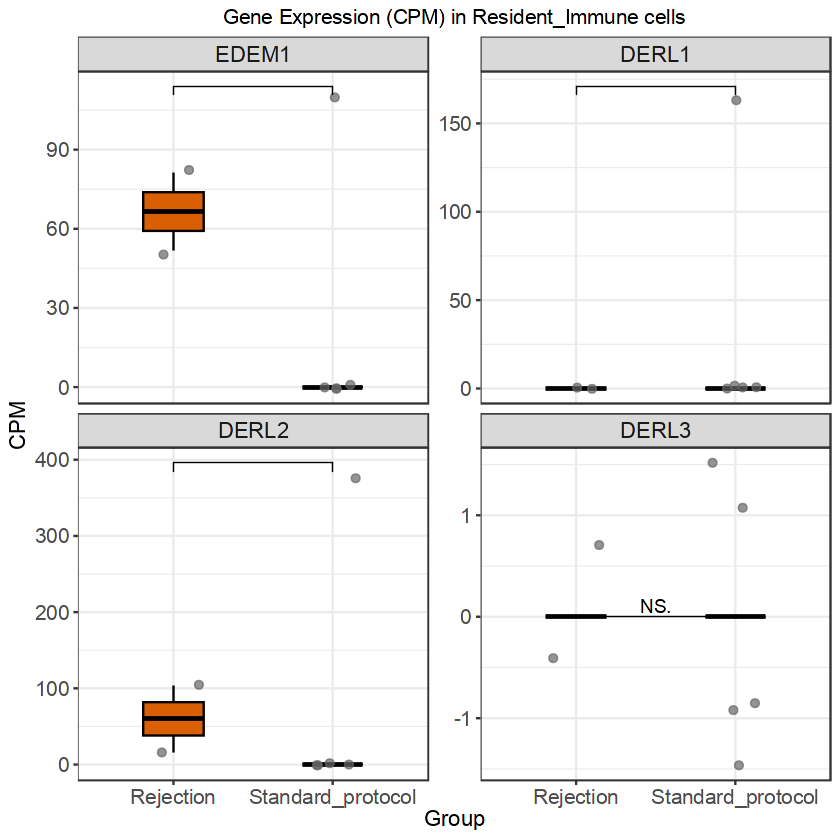

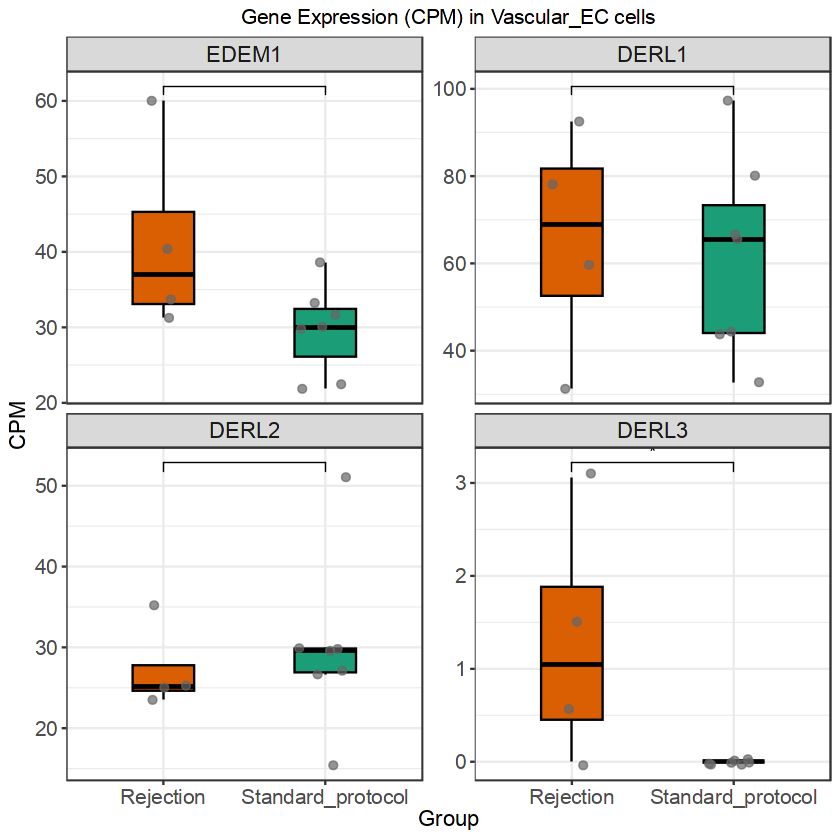

In [54]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "ERAD/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("EDEM1", "DERL1", "DERL2", "DERL3", "SERL1") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 7
  )
}


Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  
Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 7.67309544179765, 0, 0, 9.4255148687497, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 7.67309544179765, 0, 0, 9.4255148687497, :
“cannot compute exact p-value with ties”


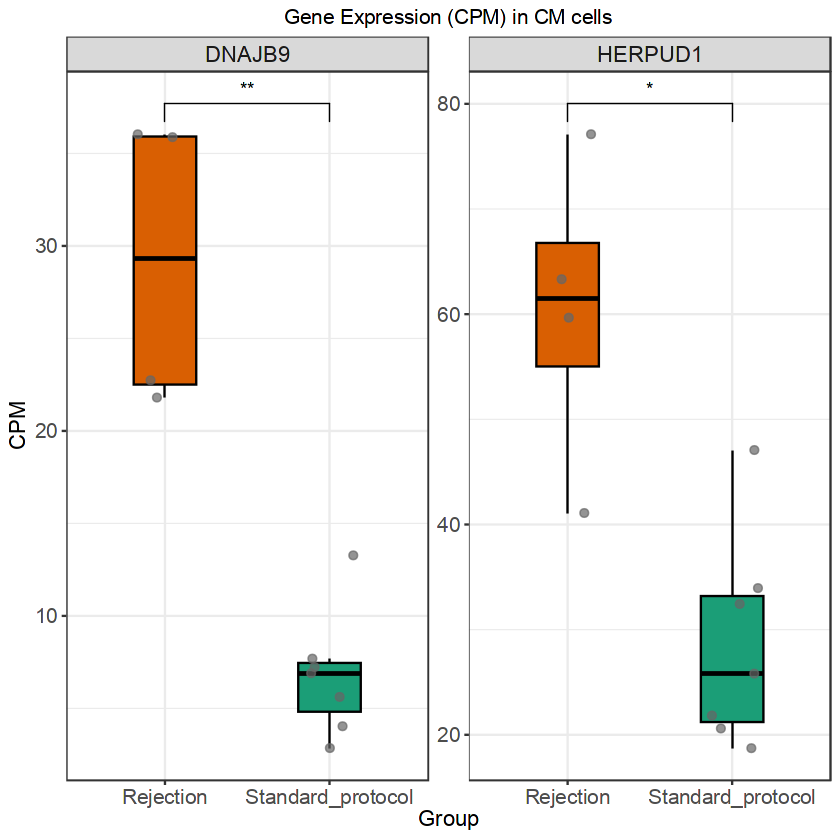

Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 366.300366300366), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 366.300366300366), c(0, 0, :
“cannot compute exact p-value with ties”


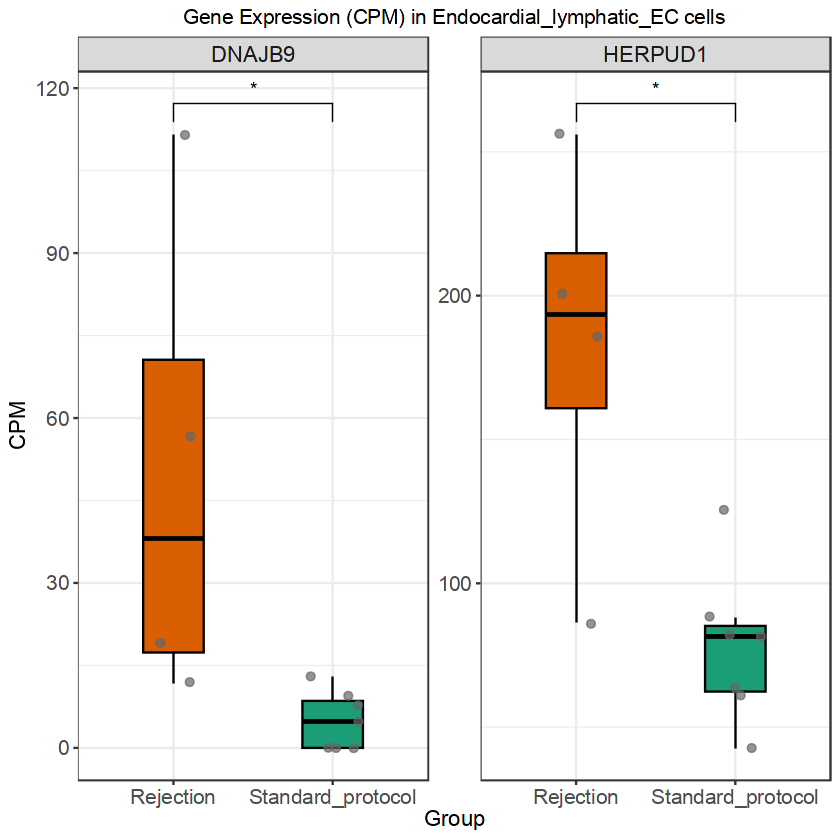

Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


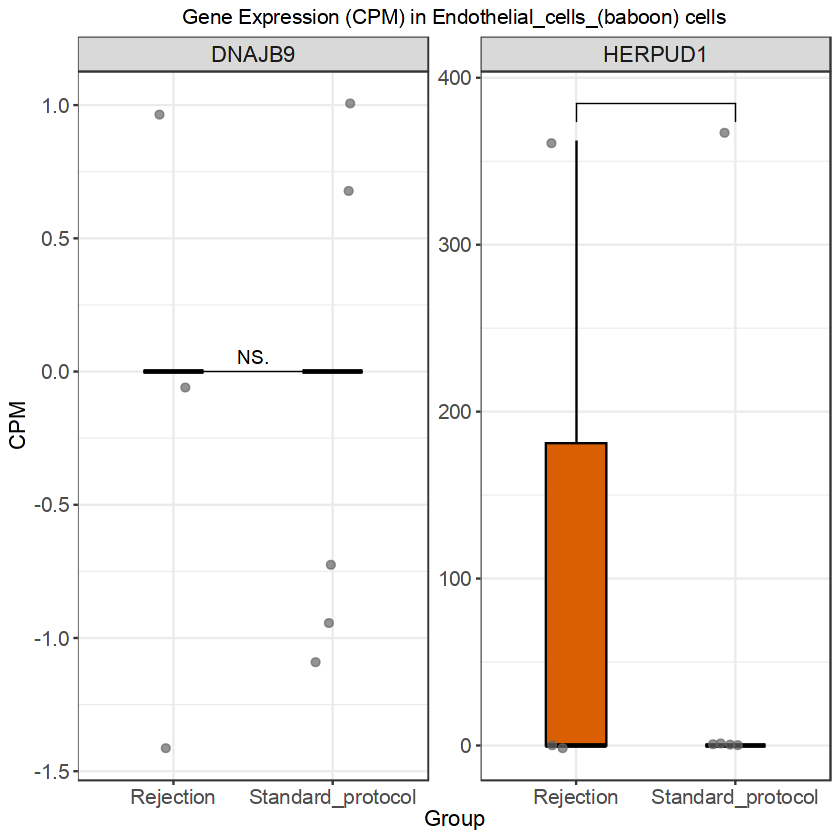

Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(5.68317439388945, 9.66800085078408, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.68317439388945, 9.66800085078408, 0, :
“cannot compute exact p-value with ties”


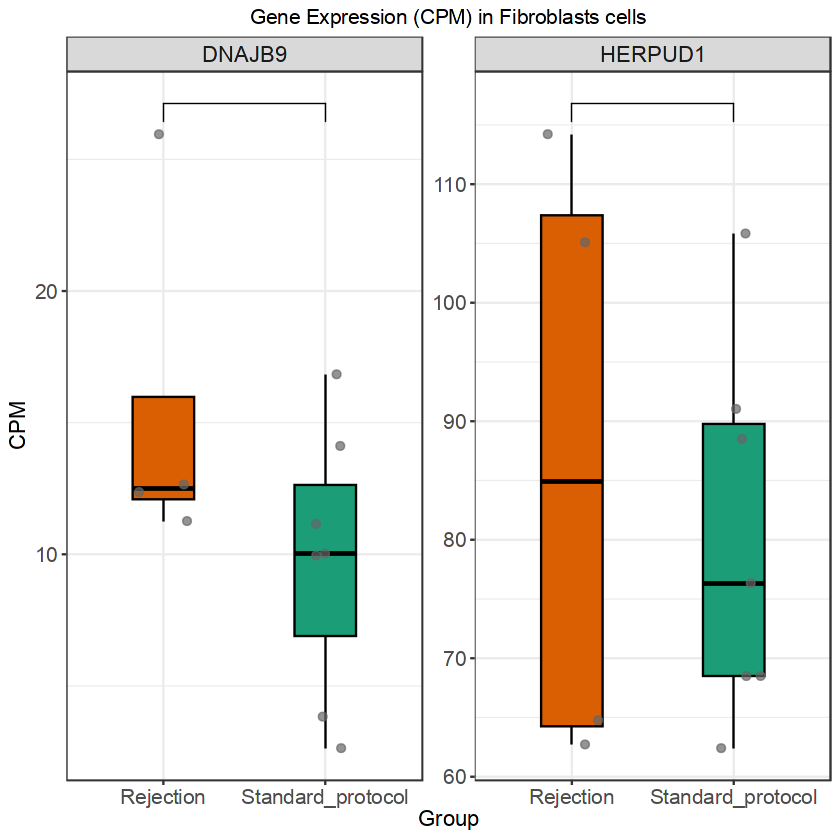

Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(113.256696302169, 286.73835125448, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(113.256696302169, 286.73835125448, :
“cannot compute exact p-value with ties”


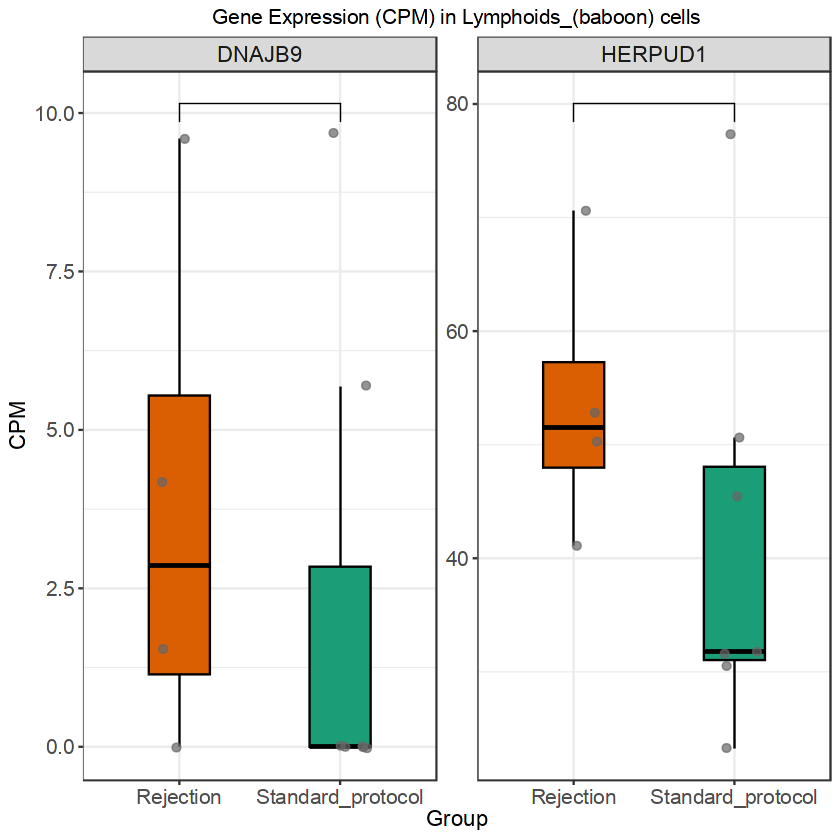

Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(4.47071236330797, 17.3077755181515, 7.02454375588306, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(4.47071236330797, 17.3077755181515, 7.02454375588306, :
“cannot compute exact p-value with ties”


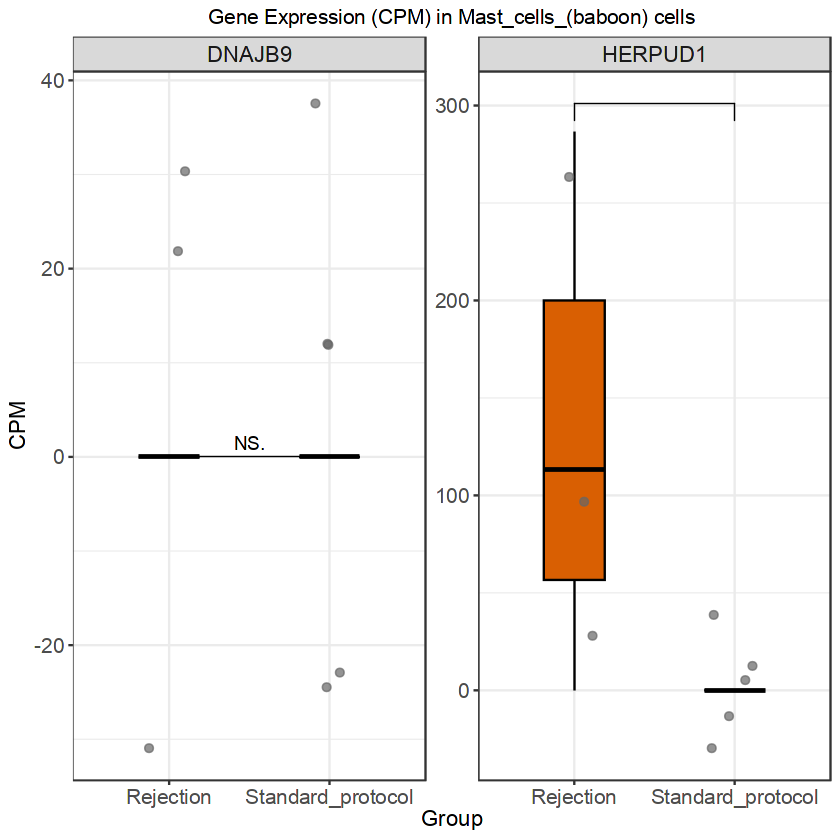

Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


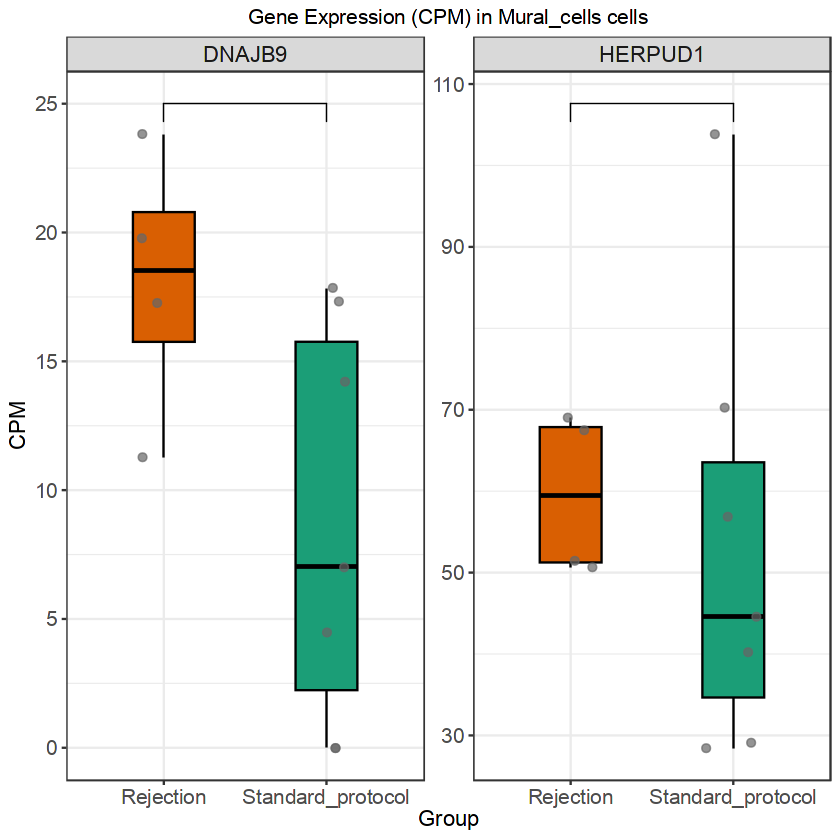

Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 18.7448451675789, 34.2260631470865, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 18.7448451675789, 34.2260631470865, :
“cannot compute exact p-value with ties”


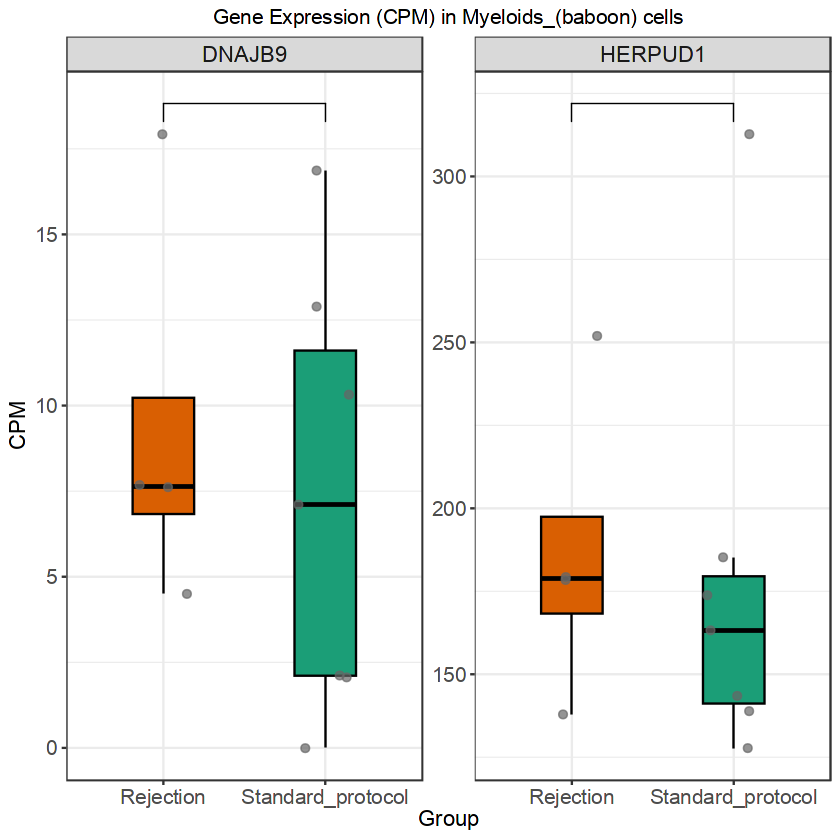

Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 1017.63907734057, 0), c(172.133809678467, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 1017.63907734057, 0), c(172.133809678467, :
“cannot compute exact p-value with ties”


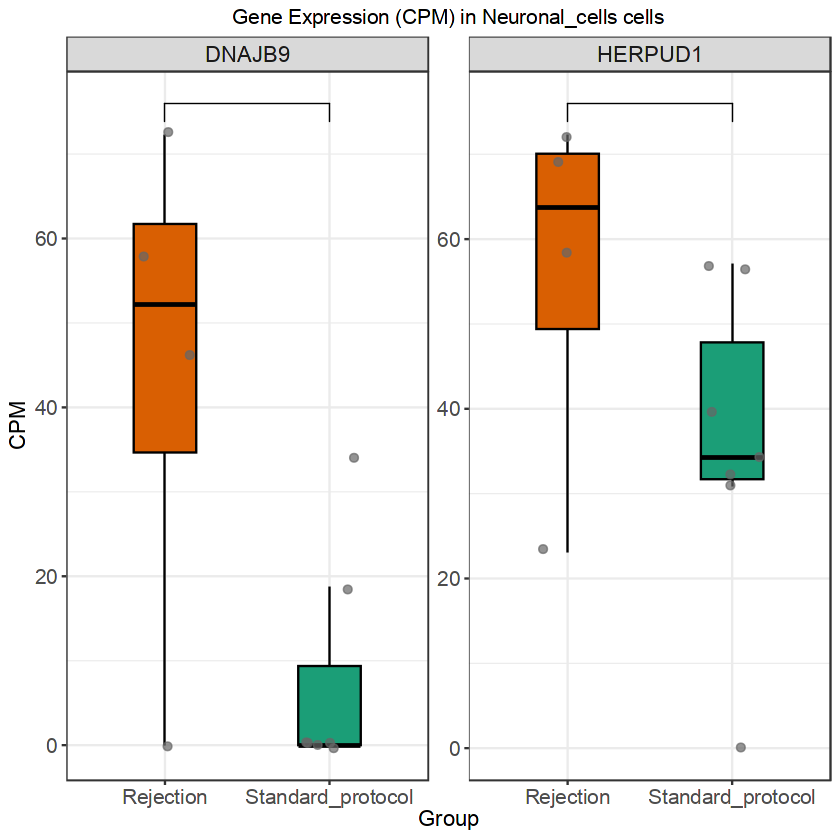

Genes found in CPM: DNAJB9 HERPUD1 
Genes not found in CPM:  


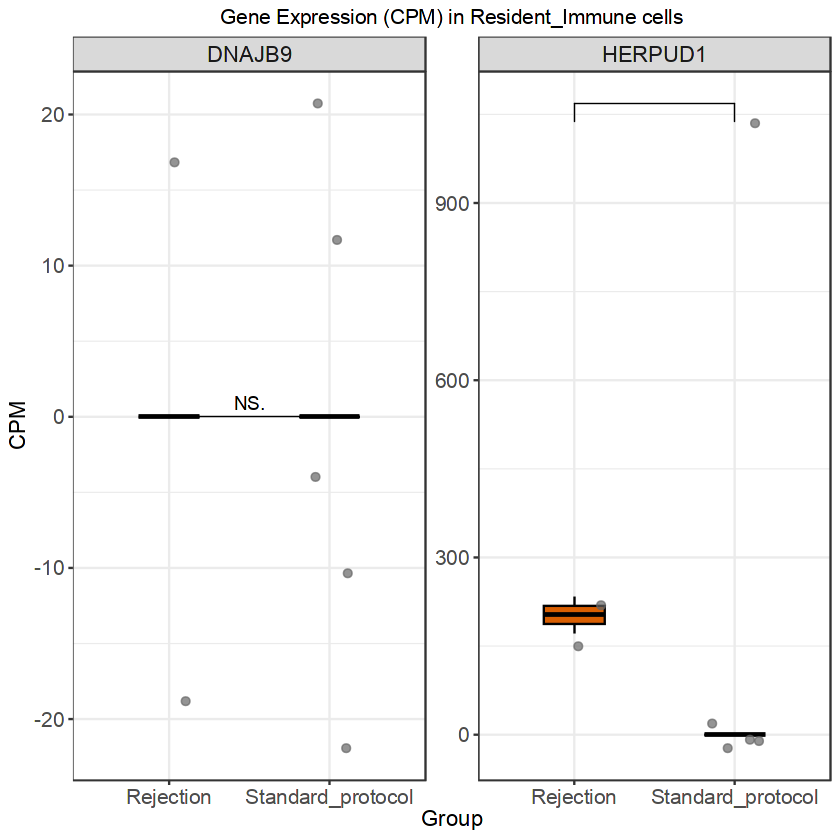

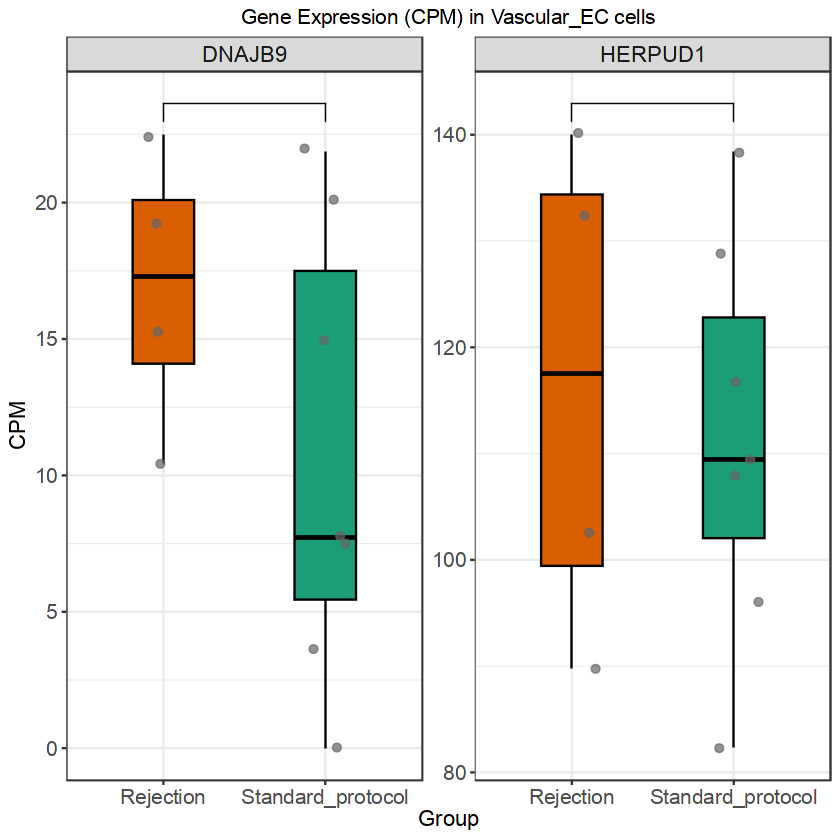

In [44]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "ER_chaperones/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("DNAJB9", "HERPUD1") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 4
  )
}


Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  
Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


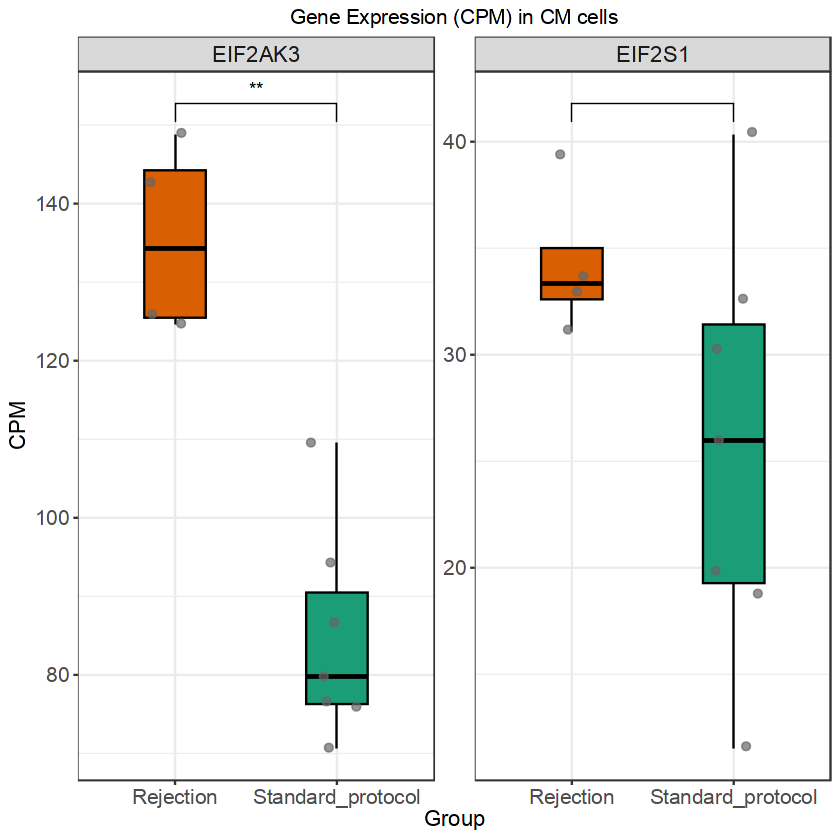

Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 362.187613183629:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 488.758553274682, 0, 294.290759270159, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 362.187613183629:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 488.758553274682, 0, 294.290759270159, :
“cannot compute exact p-value with ties”


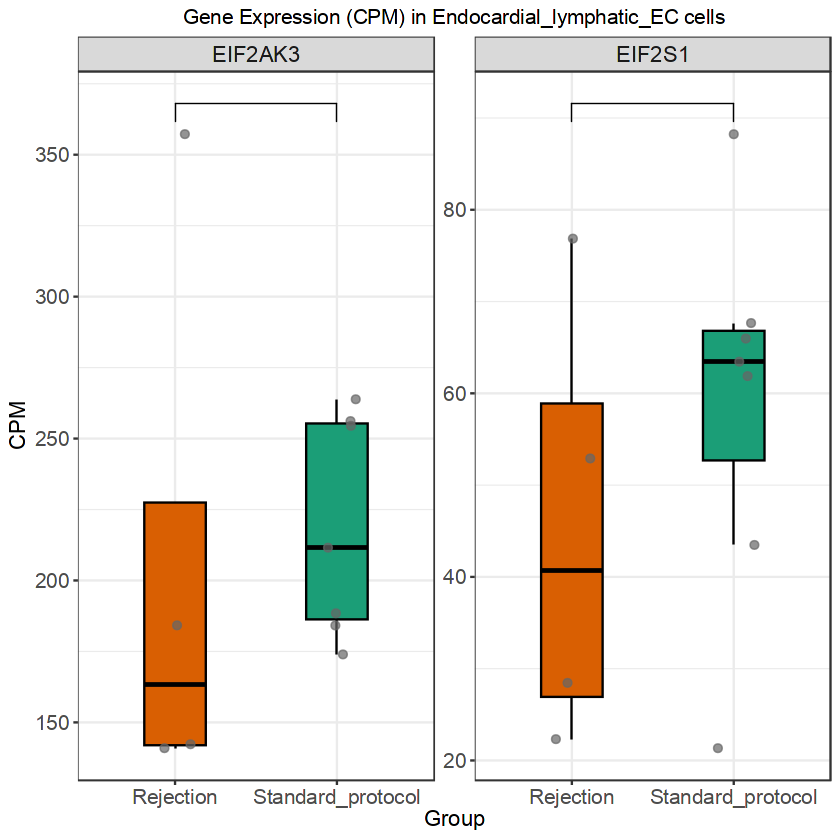

Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


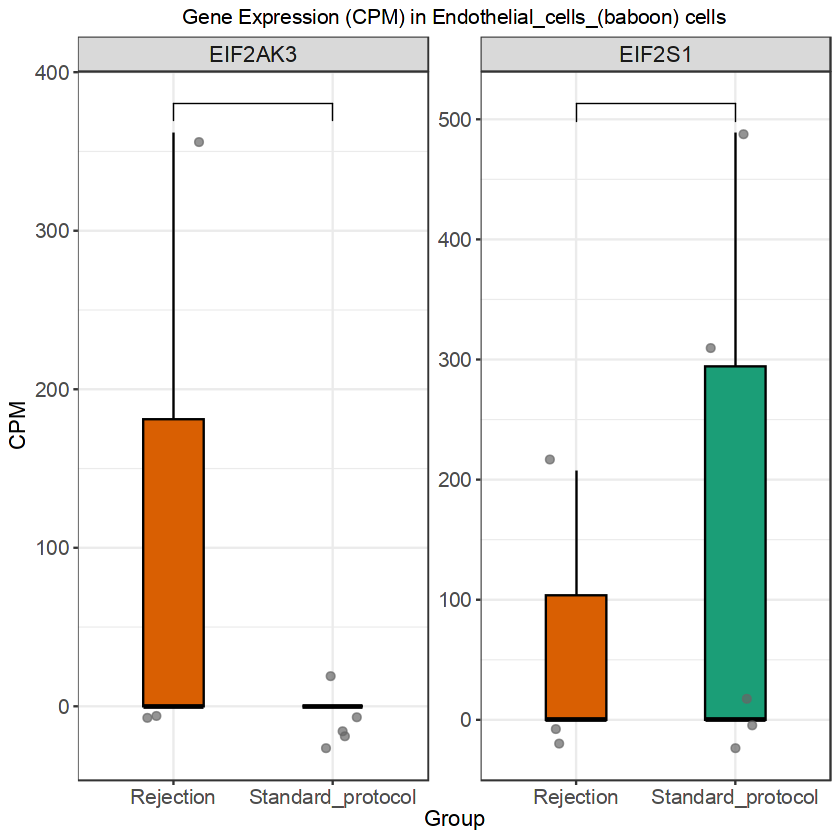

Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


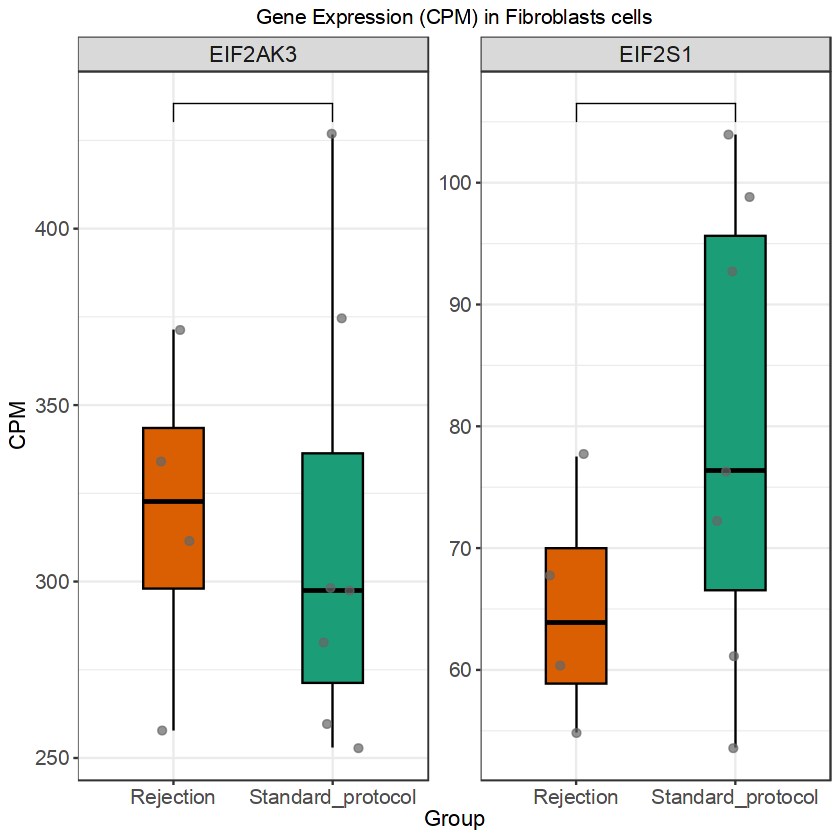

Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 425.079702444208, 0, 0, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 480.076812289966, 0), c(56.6283481510844, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 425.079702444208, 0, 0, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 480.076812289966, 0), c(56.6283481510844, :
“cannot compute exact p-value with ties”


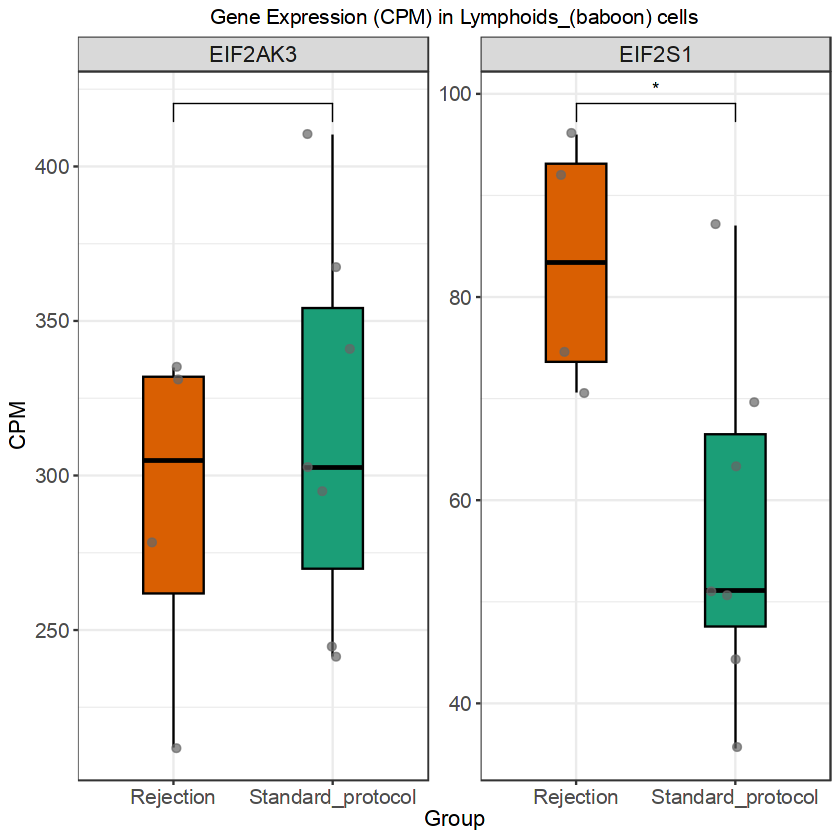

Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


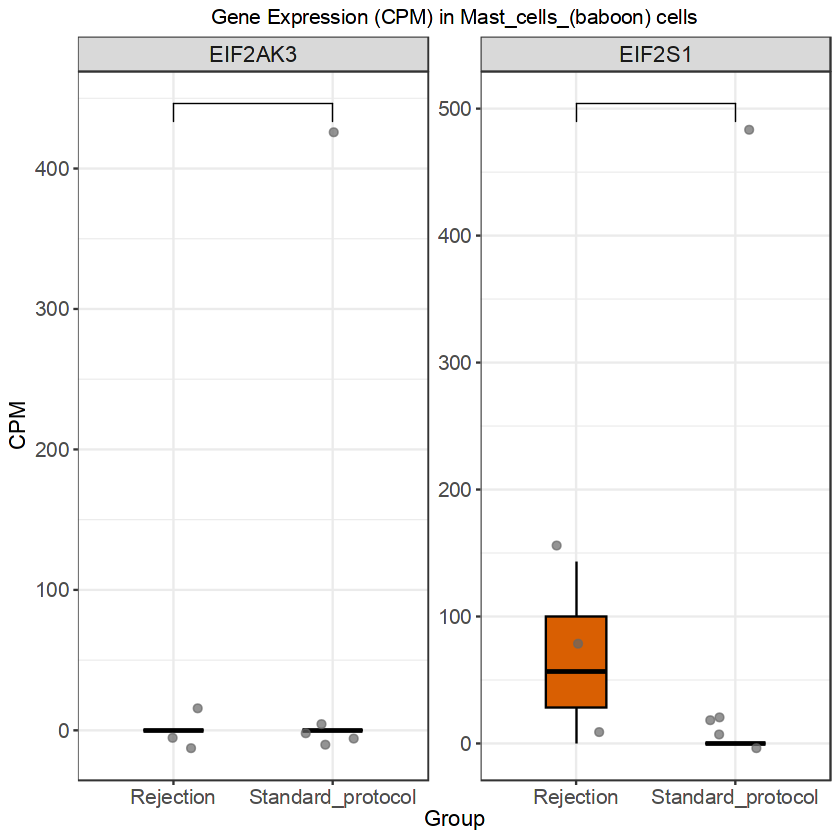

Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


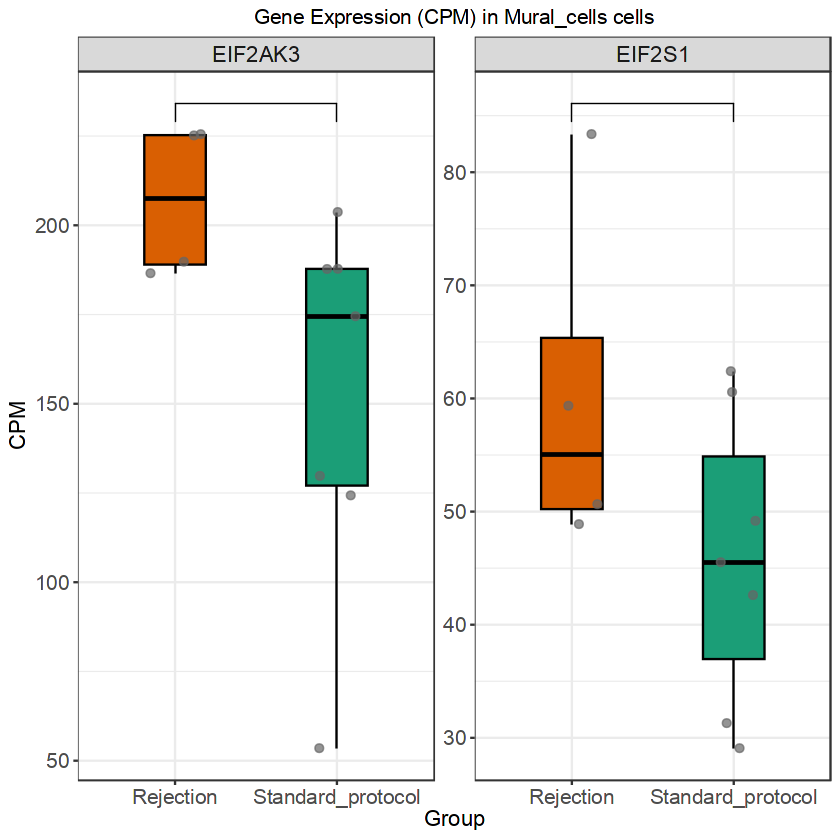

Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(123.540675767496, 57.1624556990968, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(123.540675767496, 57.1624556990968, 0, :
“cannot compute exact p-value with ties”


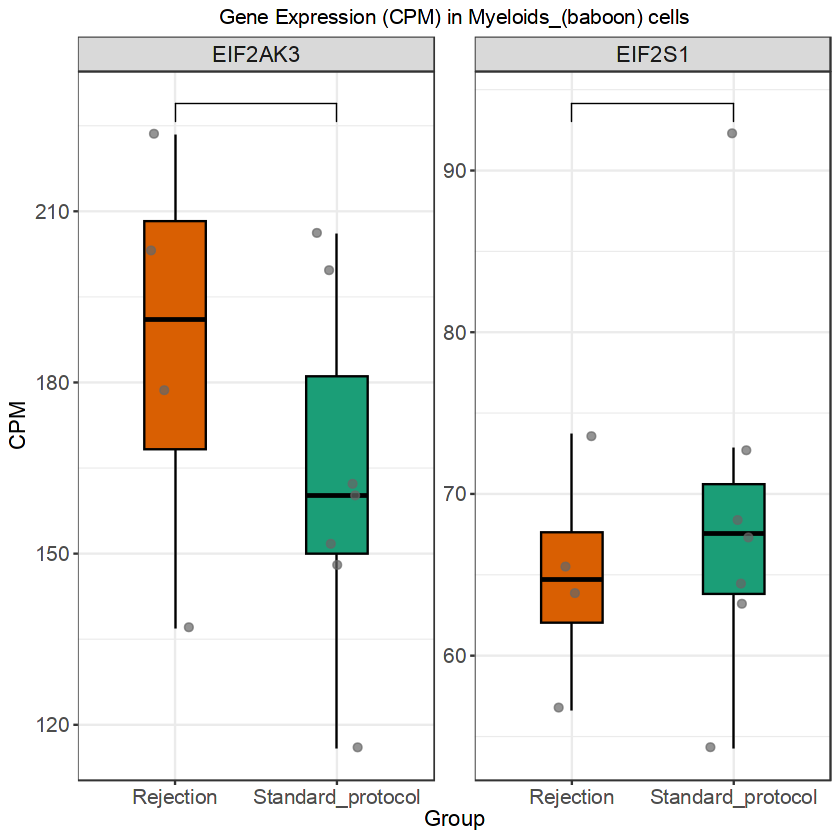

Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(304.692260816575, 0, 108.559952233621, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(304.692260816575, 0, 54.2799761168105, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(304.692260816575, 0, 108.559952233621, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(304.692260816575, 0, 54.2799761168105, :
“cannot compute exact p-value with ties”


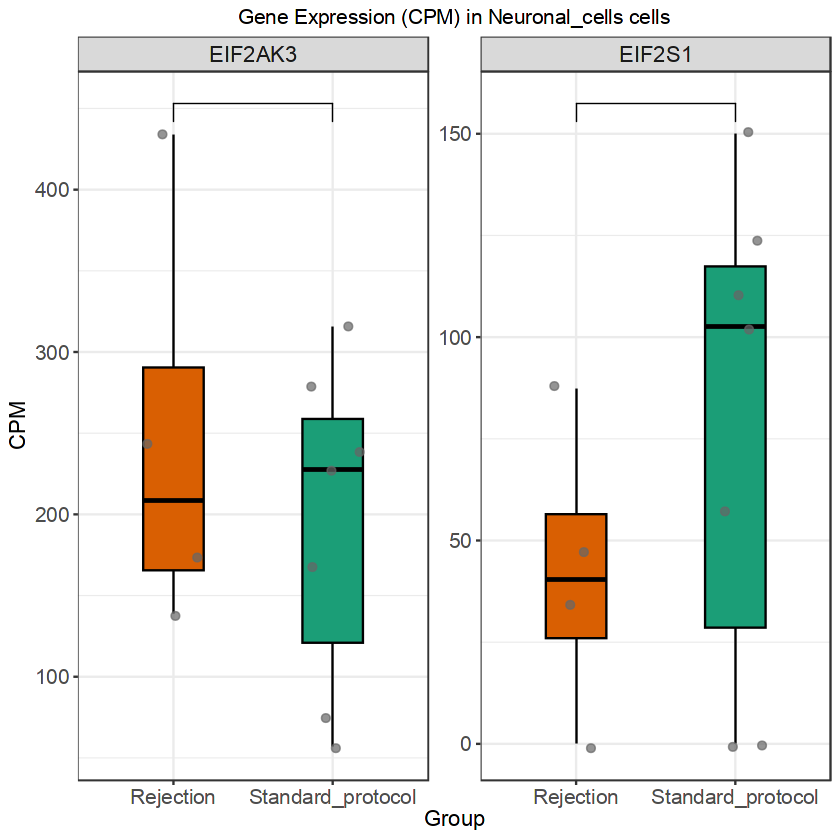

Genes found in CPM: EIF2AK3 EIF2S1 
Genes not found in CPM:  


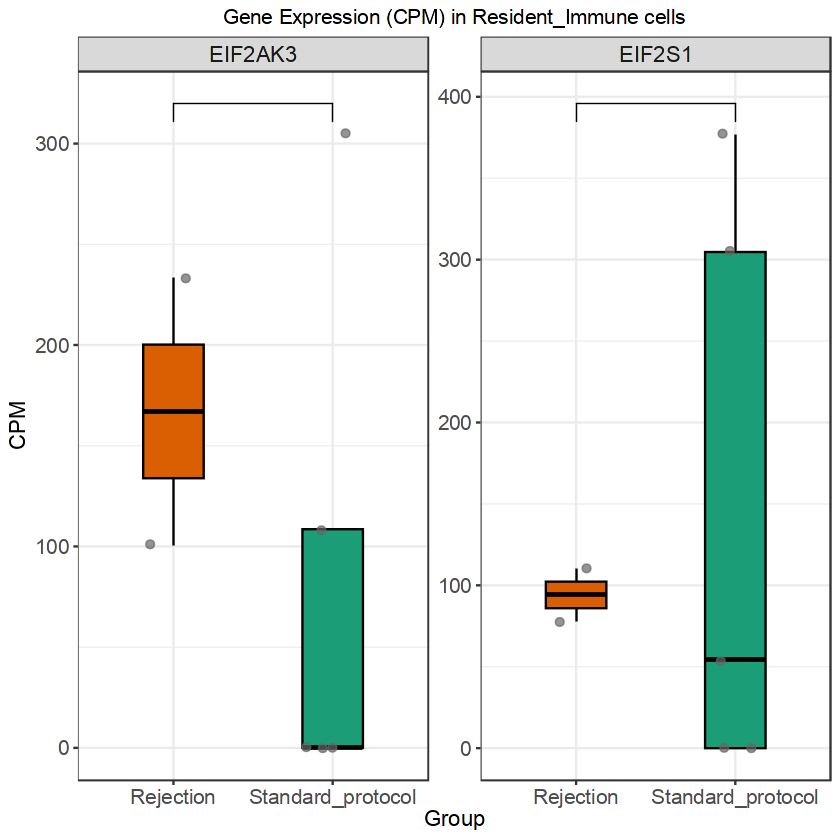

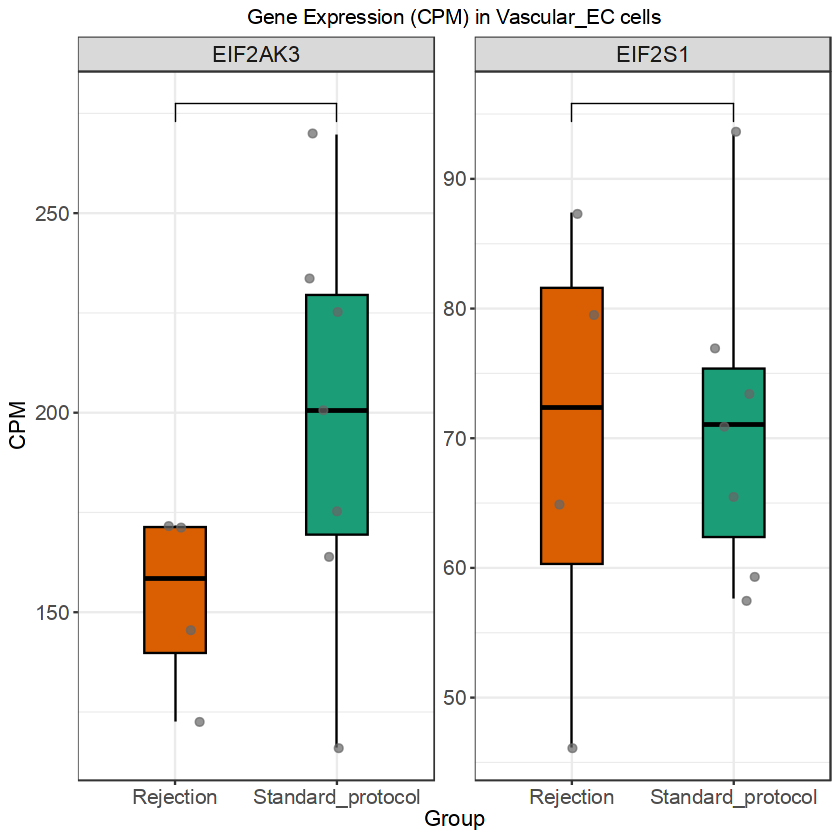

In [45]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "PERK/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("EIF2AK3", "EIF2S1") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 4
  )
}


Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  
Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 11.5096431626965, 0, 9.66356305233302, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 11.5096431626965, 21.1550666384599, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 65.22131125528, 0, 101.467412049497, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 11.5096431626965, 0, 9.66356305233302, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 11.5096431626965, 21.1550666384599, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 65.22131125528, 0, 101.467412049497, :
“cannot compute exact p-value with ties”


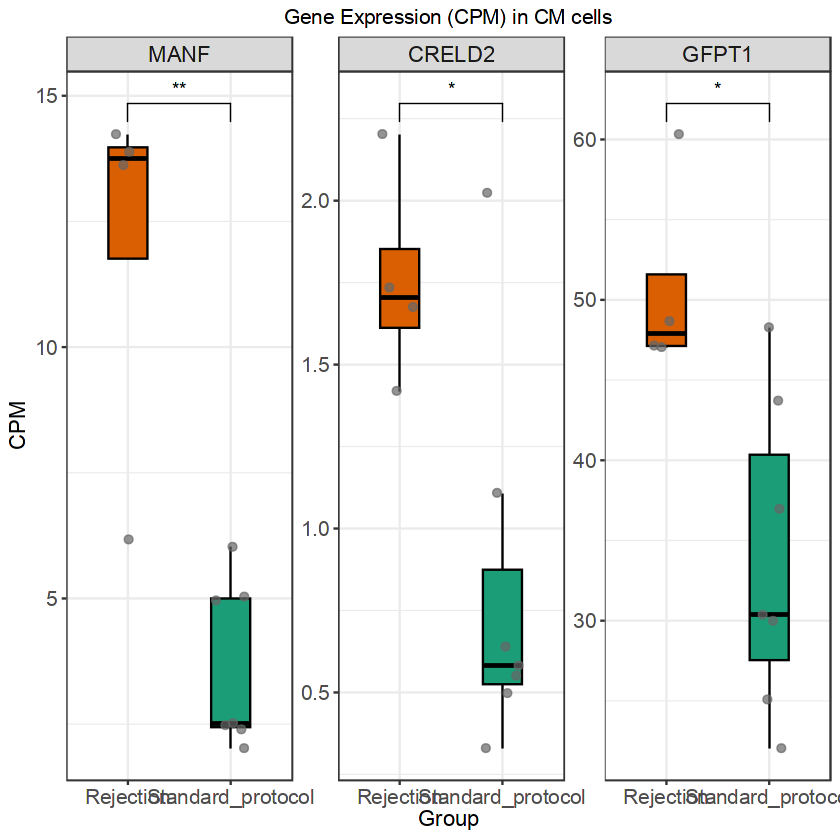

Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 1100.1100110011, 588.581518540318, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 1100.1100110011, 588.581518540318, :
“cannot compute exact p-value with ties”


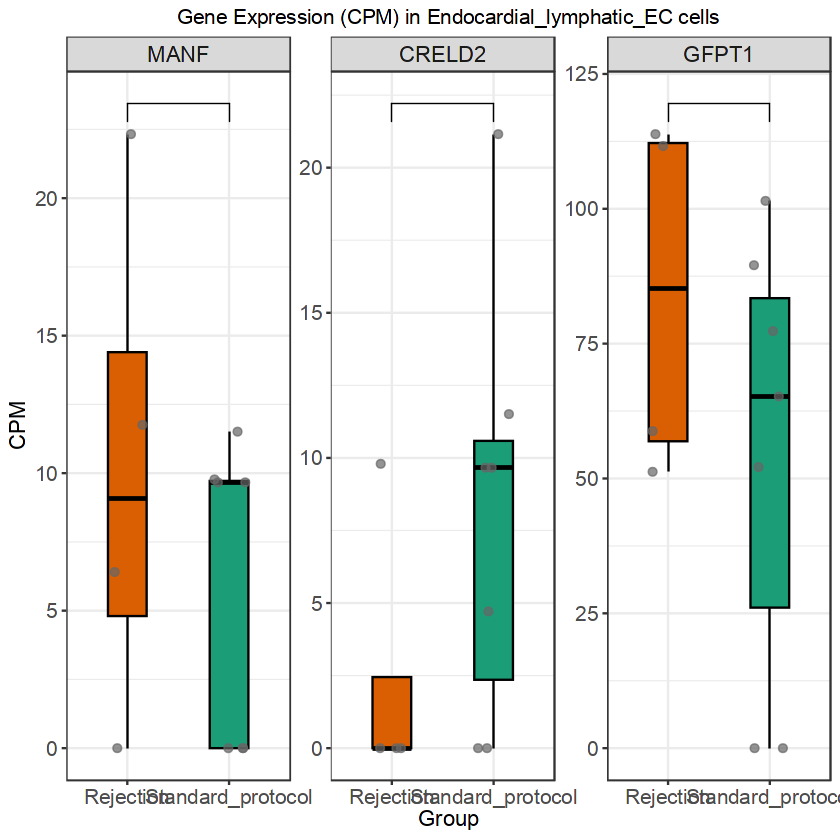

Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


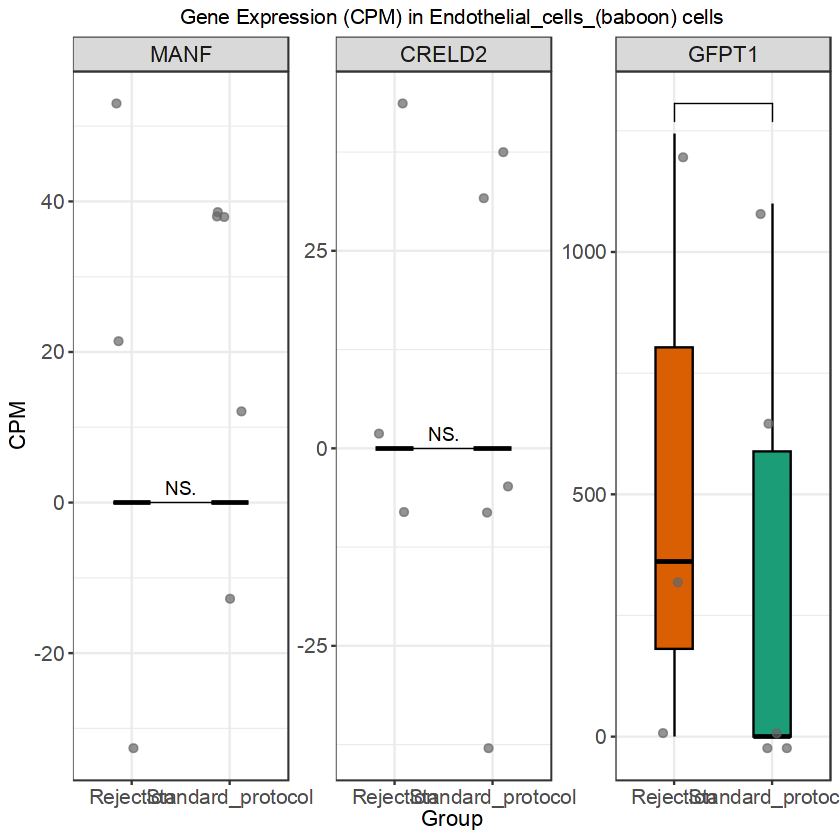

Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(11.3663487877789, 0, 10.1679749461097, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(11.3663487877789, 0, 10.1679749461097, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


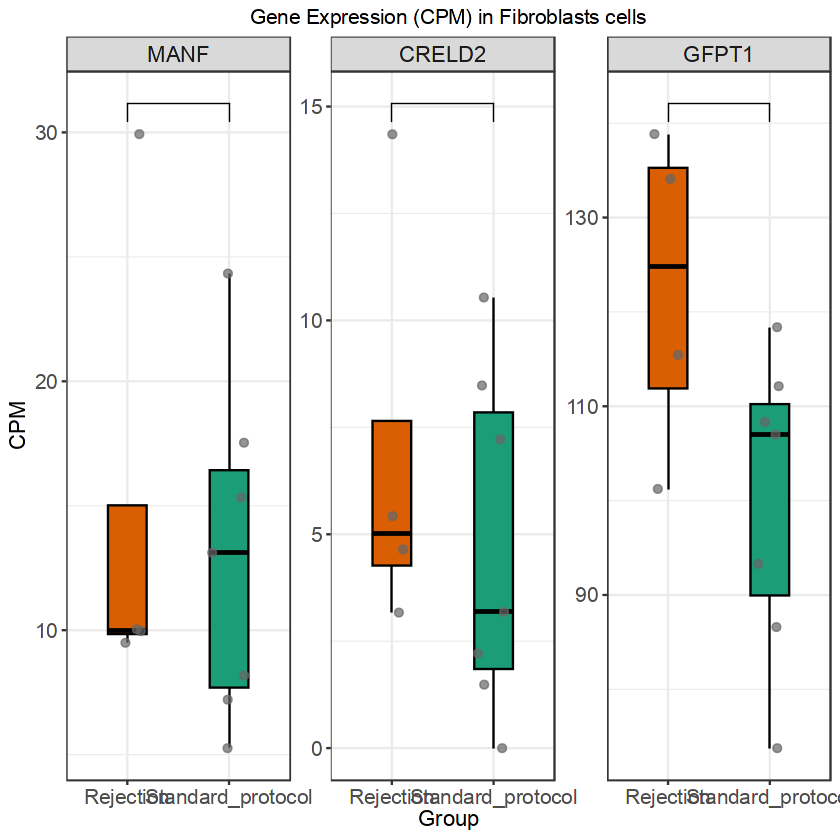

Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 914.076782449726), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 212.539851222104, 755.287009063444, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 914.076782449726), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 212.539851222104, 755.287009063444, :
“cannot compute exact p-value with ties”


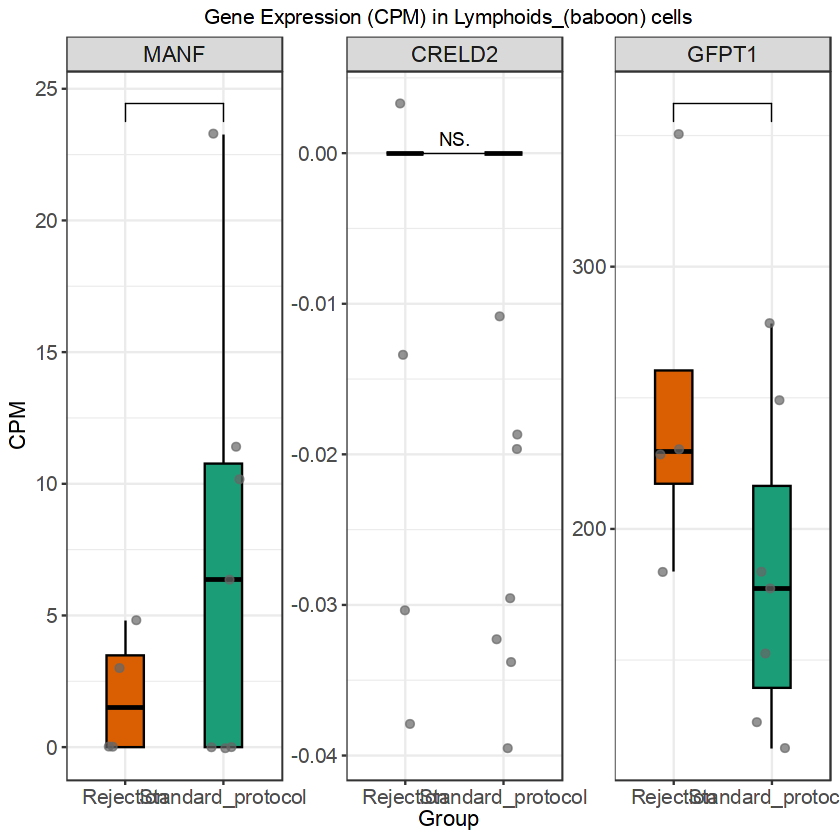

Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(17.8828494532319, 8.65388775907577, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(4.47071236330797, 0, 21.0736312676492, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(17.8828494532319, 8.65388775907577, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(4.47071236330797, 0, 21.0736312676492, :
“cannot compute exact p-value with ties”


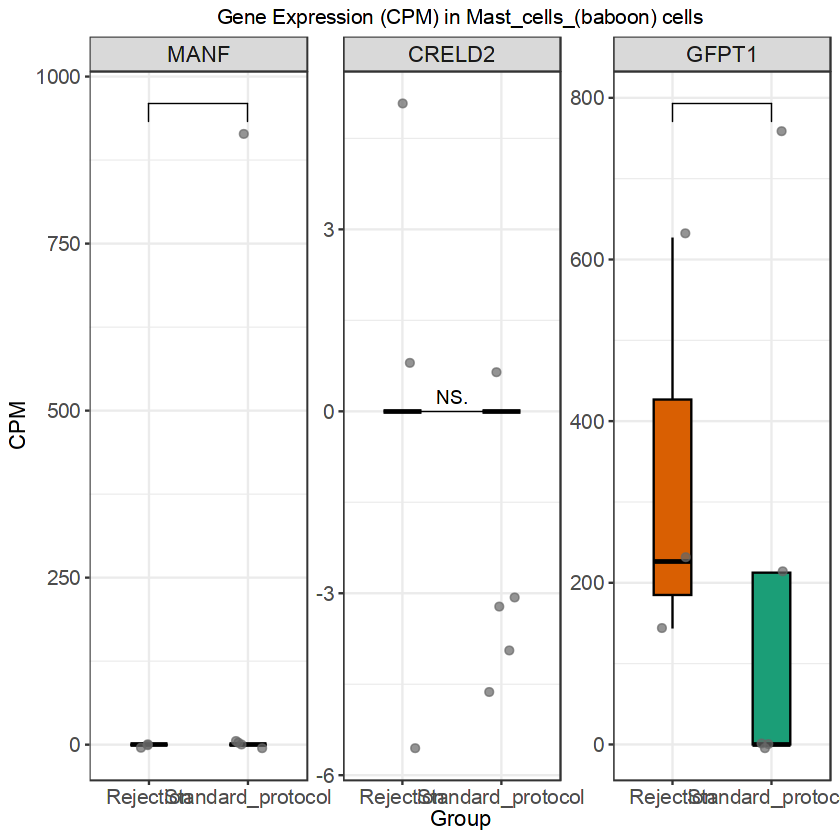

Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


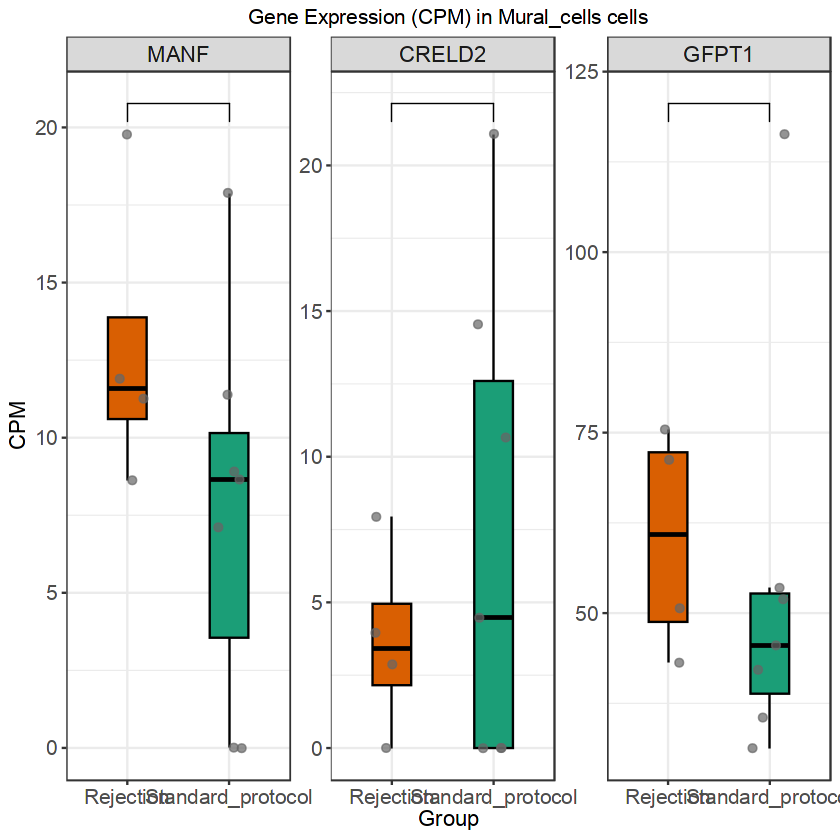

Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(30.8851689418741, 0, 0, 18.7448451675789, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 57.1624556990968, 0, 18.7448451675789, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 0, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 0, 0, 18.7448451675789, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 57.1624556990968, 0, 18.7448451675789, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 0, 39.4259580507806, :
“cannot compute exact p-value with ties”


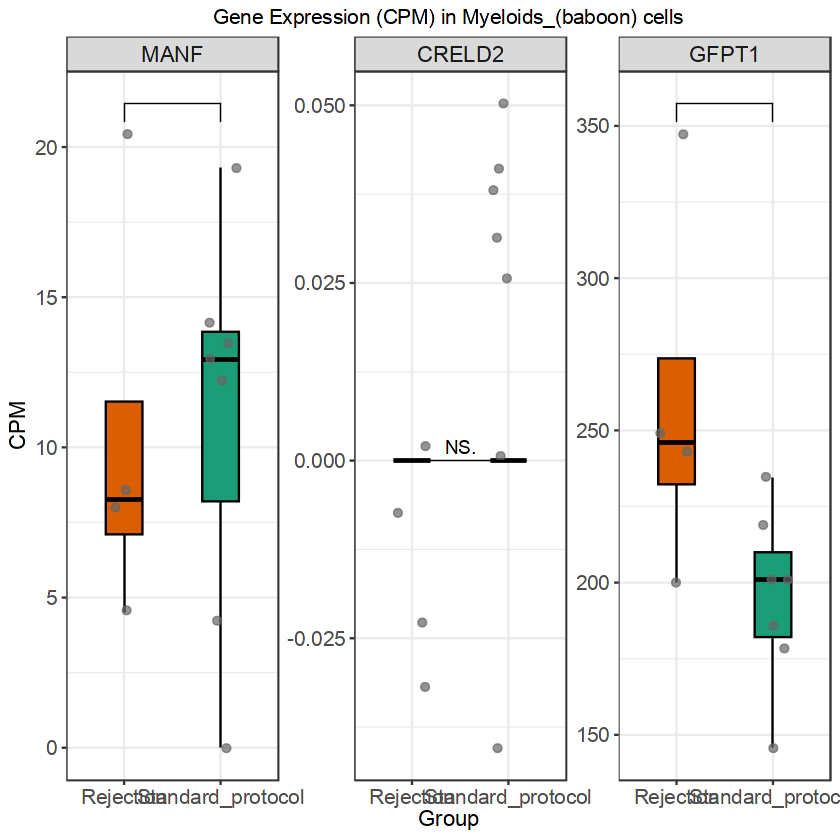

Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(12.9912309191296, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(97.4342318934719, 25.9309200290426:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(12.9912309191296, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(97.4342318934719, 25.9309200290426:
“cannot compute exact p-value with ties”


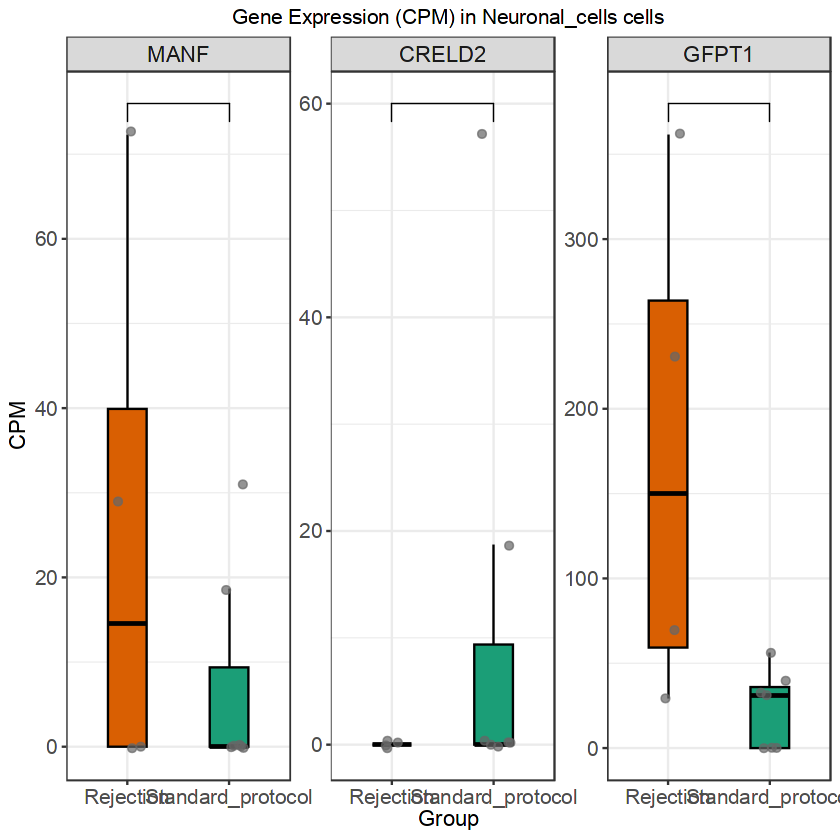

Genes found in CPM: MANF CRELD2 GFPT1 
Genes not found in CPM:  


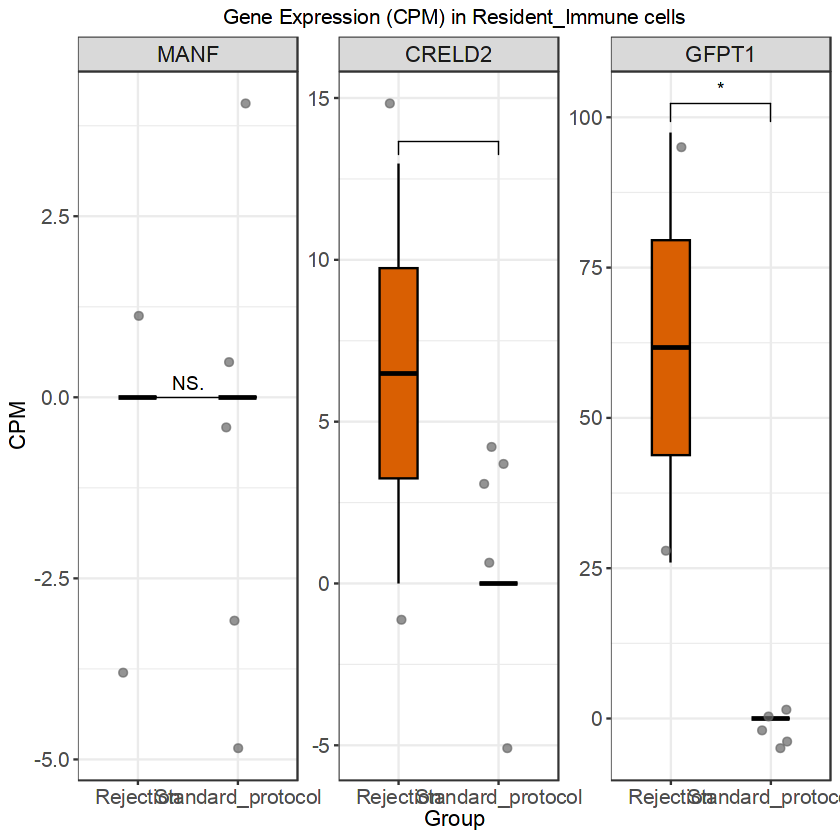

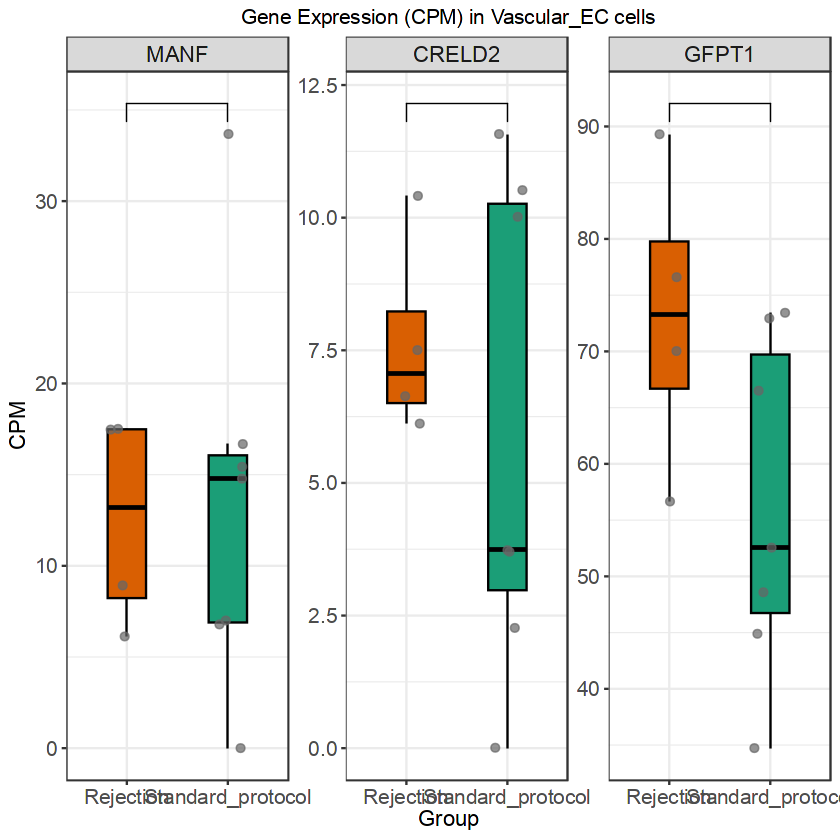

In [58]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "UPR_GOLGI_ER__structural_regulators/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("MANF", "CRELD2", "GFPT1") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 7
  )
}


Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0.0918901899365631, 0.12376640987887, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.206277349798116, 0.506202652967608, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0918901899365631, 0.12376640987887, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.206277349798116, 0.506202652967608, :
“cannot compute exact p-value with ties”


Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 7.67309544179765, 0, 4.83178152616651, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 4.83178152616651, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 7.67309544179765, 0, 4.83178152616651, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 4.83178152616651, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”


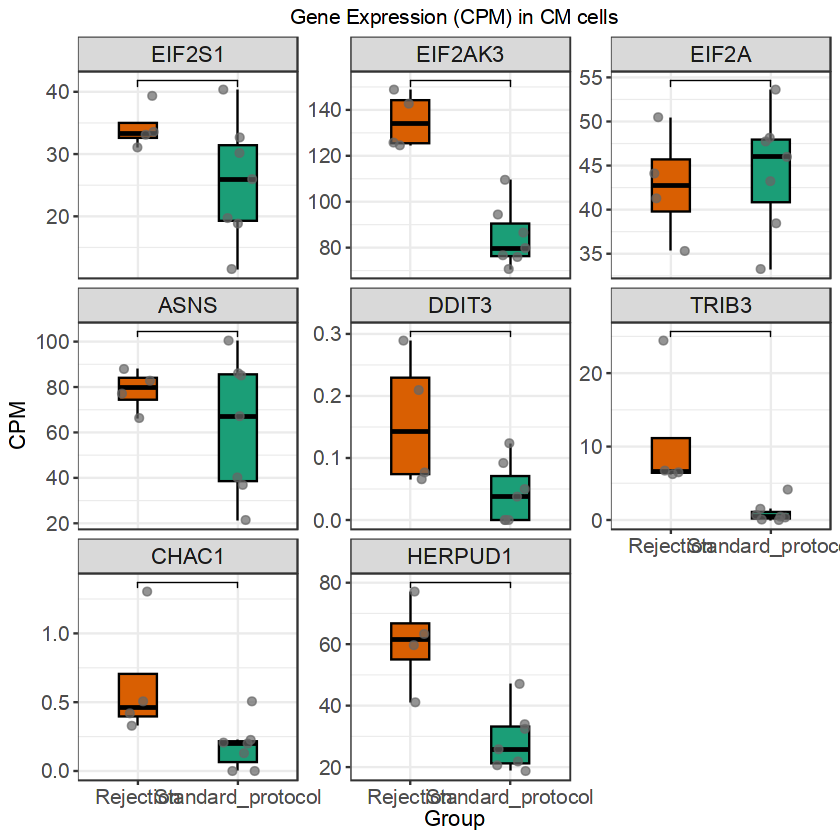

Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 488.758553274682, 0, 294.290759270159, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 362.187613183629:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 207.382828701783, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 294.290759270159, 0), c(375.93984962406, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 366.300366300366), c(0, 0, :
“cannot compute exact p-value 

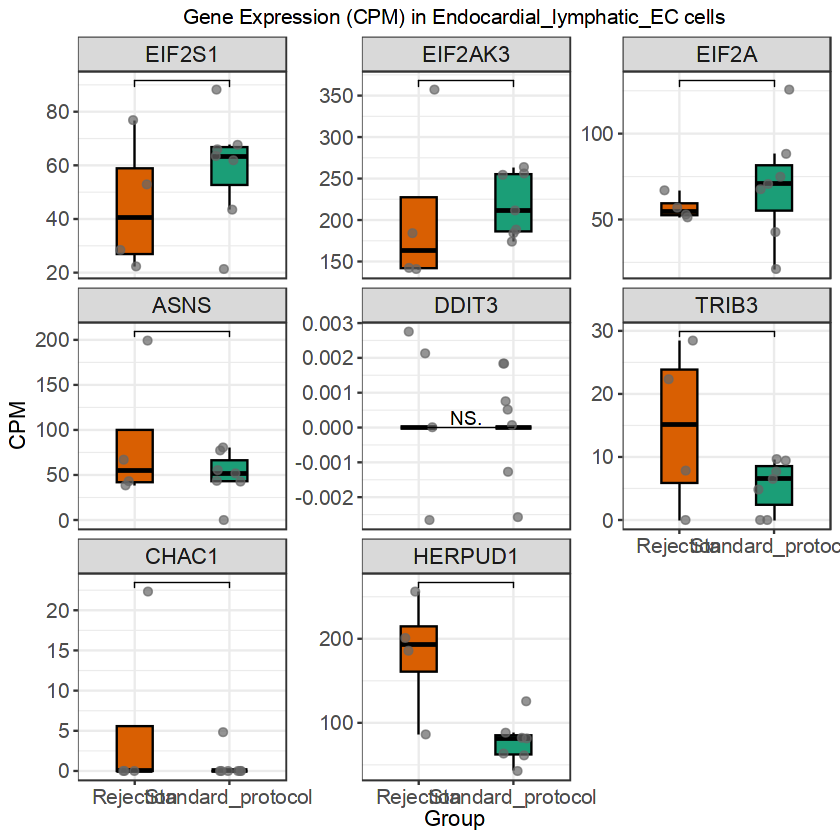

Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 1.10628524901375, 0, 0, 0, 0, 0.771092661434032:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0.371489378932912, 0, 0), c(0.216596348662074, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 1.10628524901375, 0, 0, 0, 0, 0.771092661434032:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0.371489378932912, 0, 0), c(0.216596348662074, :
“cannot compute exact p-value with ties”


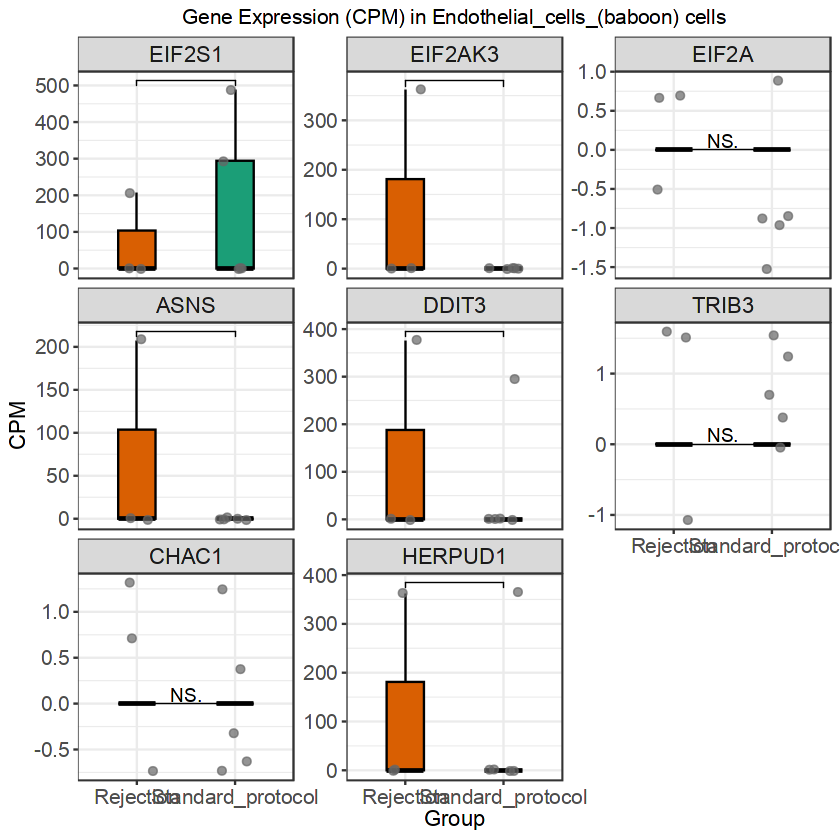

Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(11.3663487877789, 0, 10.1679749461097, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(17.0495231816684, 0, 5.08398747305487, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 10.1679749461097, 6.35433015828636, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(11.3663487877789, 0, 10.1679749461097, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(17.0495231816684, 0, 5.08398747305487, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 10.1679749461097, 6.35433015828636, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-v

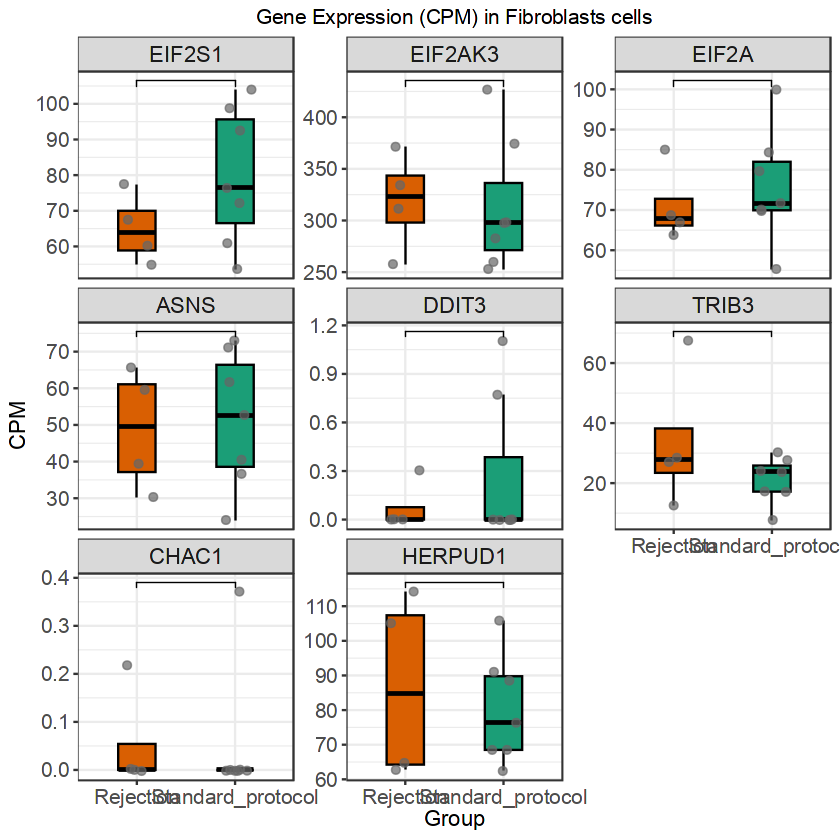

Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 480.076812289966, 0), c(56.6283481510844, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 425.079702444208, 0, 0, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 212.539851222104, 0, 480.076812289966, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 212.539851222104, 0, 0, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(113.256696302169, 286.73835125448, :
“cannot compute 

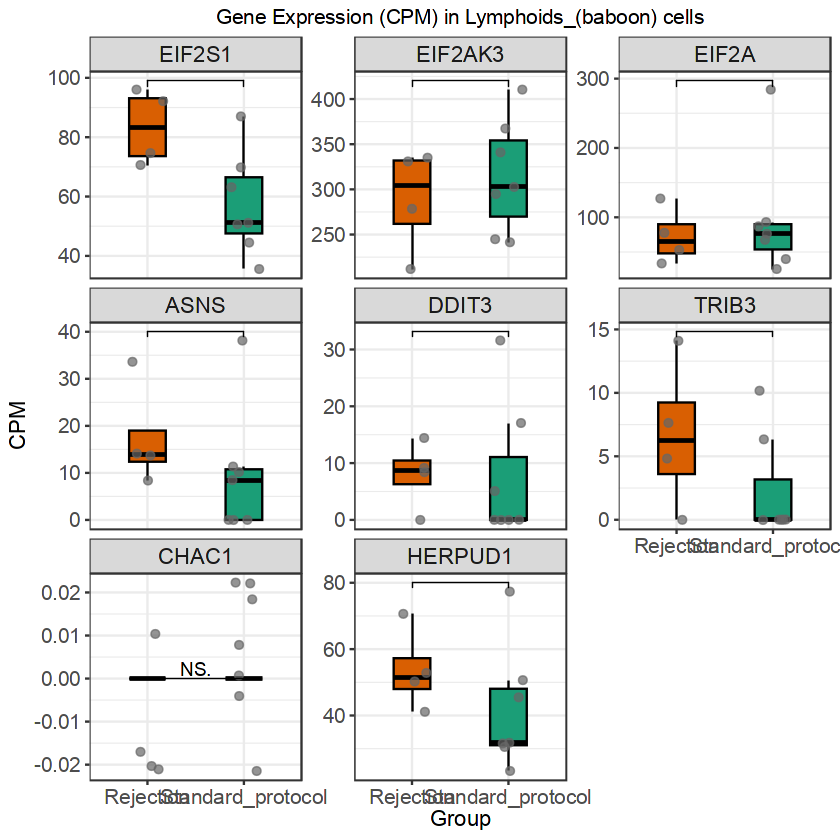

Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 7.02454375588306, 0, 0, 0, 0), c(5.62926768856639, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 7.93969011389486, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 7.02454375588306, 0, 0, 0, 0), c(5.62926768856639, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 7.93969011389486, :
“cannot compute exact p-value with ties”


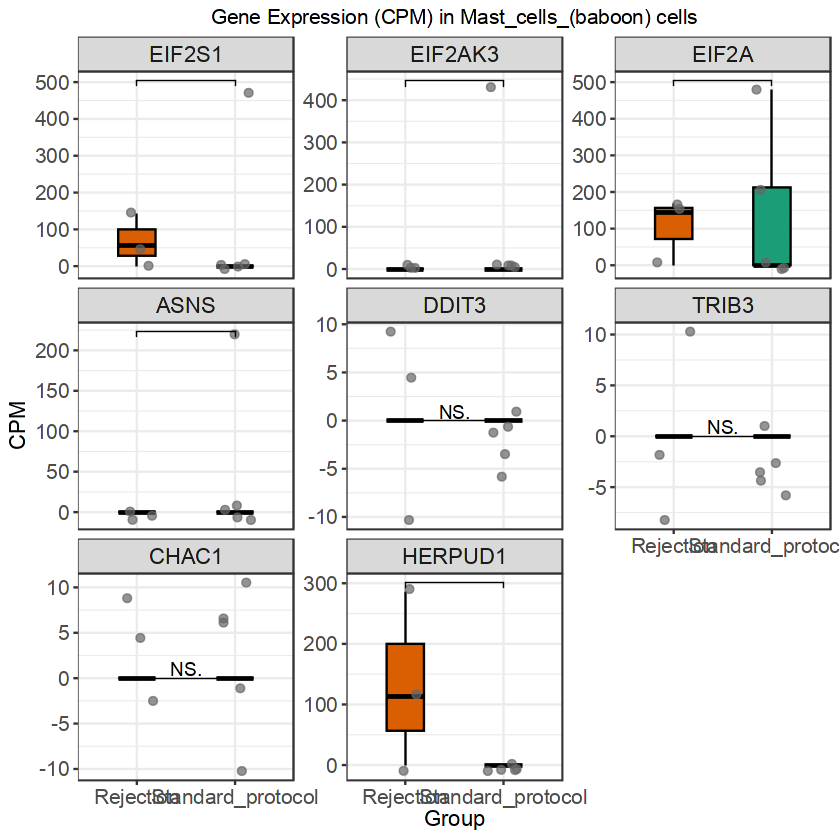

Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 2.13646453575694, 2.36537469900607, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.16934783507713, 0, 7.09612409701821, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 2.13646453575694, 2.36537469900607, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.16934783507713, 0, 7.09612409701821, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


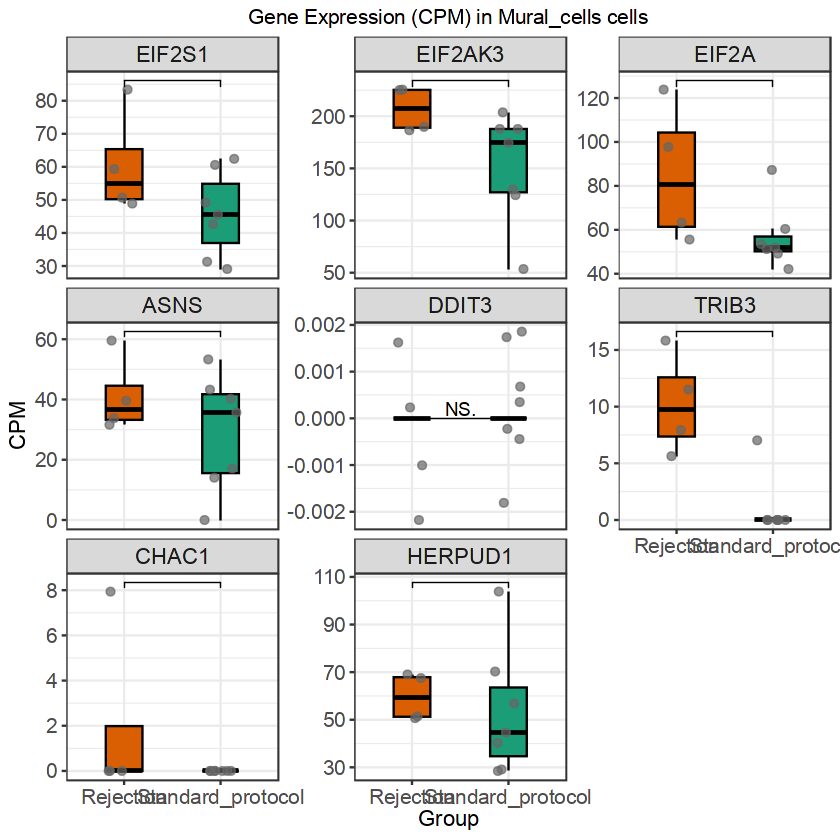

Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(123.540675767496, 57.1624556990968, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(61.7703378837482, 0, 118.277874152342, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(30.8851689418741, 114.324911398194, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 18.7448451675789, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(123.540675767496, 57.1624556990968, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(61.7703378837482, 0, 118.277874152342, :
“cannot compu

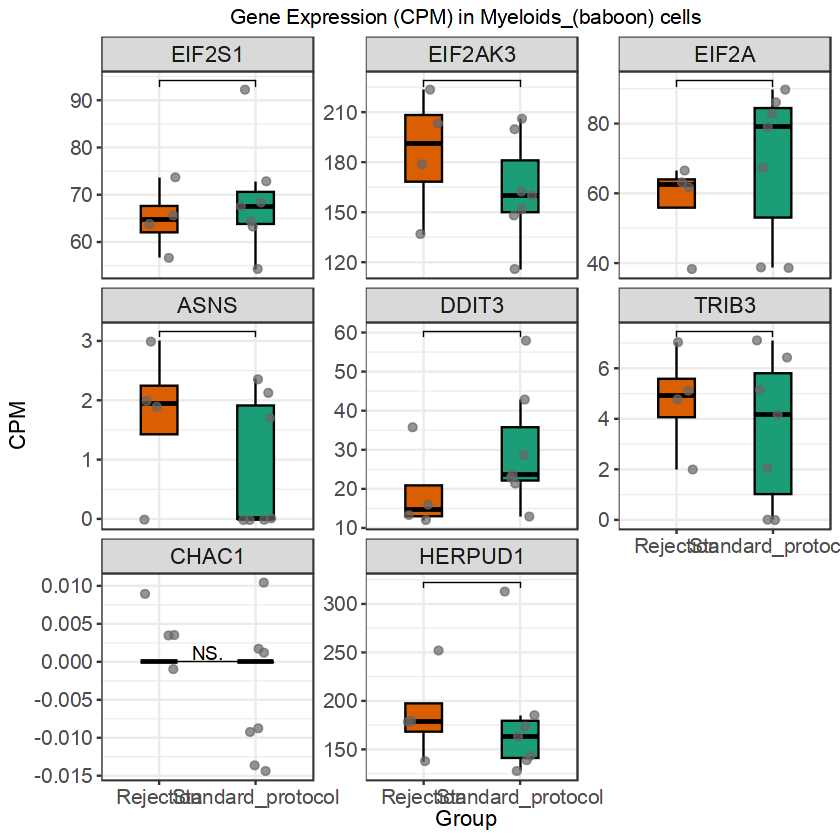

Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(304.692260816575, 0, 54.2799761168105, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(304.692260816575, 0, 108.559952233621, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(304.692260816575, 0, 0, 0, 0), c(64.9561545956479, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 54.2799761168105, 0, 0), c(68.2039623254303, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(3.2478077297824, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 1017.63907734057, 0), c(172.133809678467, :
“cannot compute exa

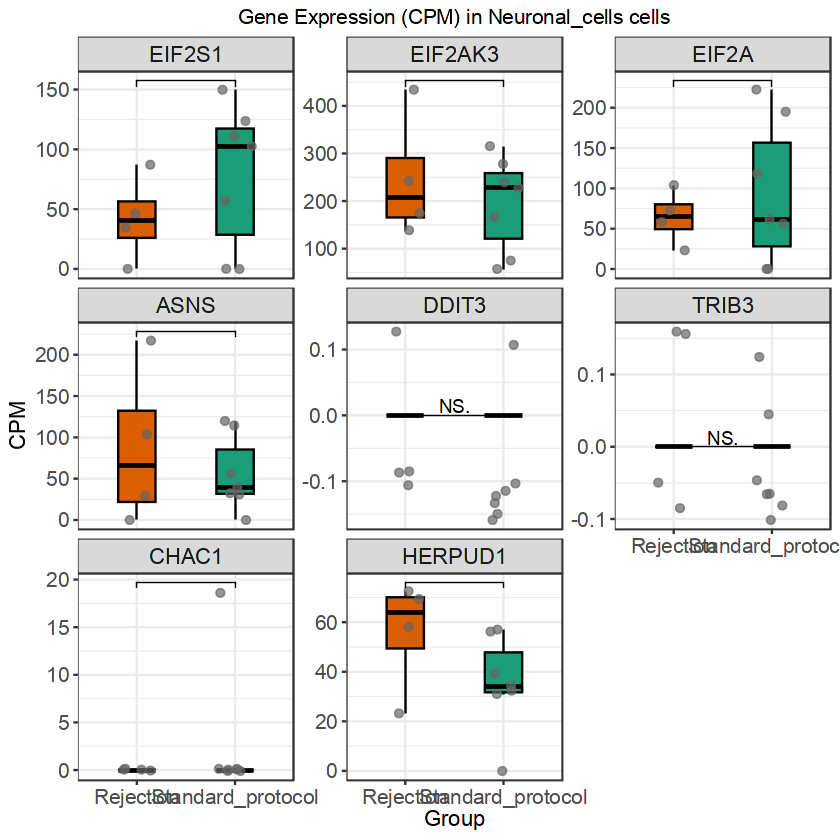

Genes found in CPM: EIF2S1 EIF2AK3 EIF2A ASNS DDIT3 TRIB3 CHAC1 HERPUD1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 7.29415883760285), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 1.1298337110744, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 7.29415883760285), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 1.1298337110744, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”


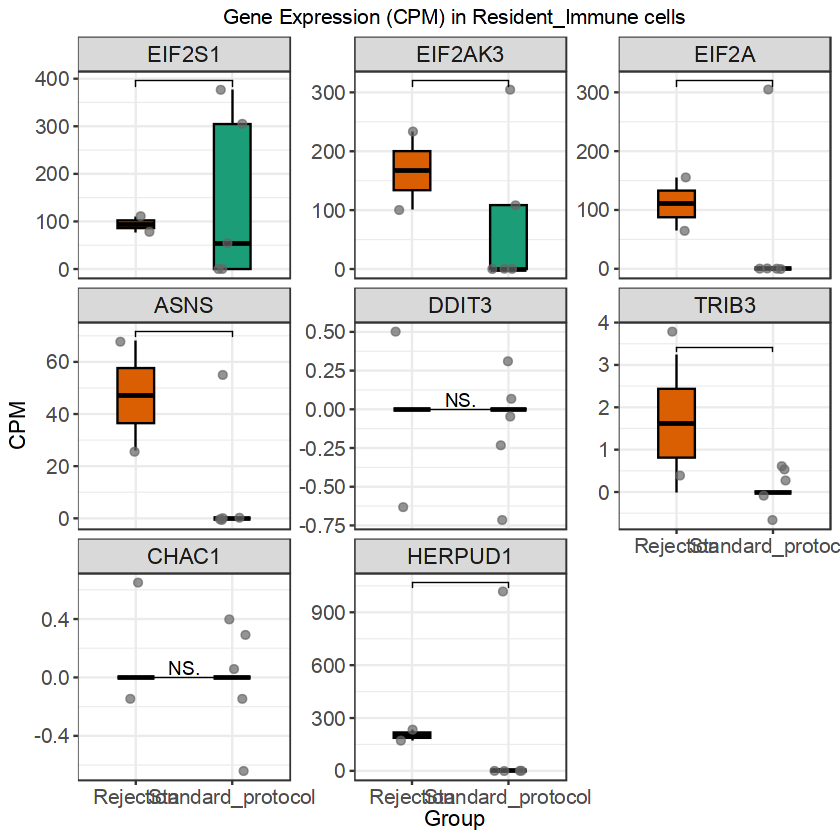

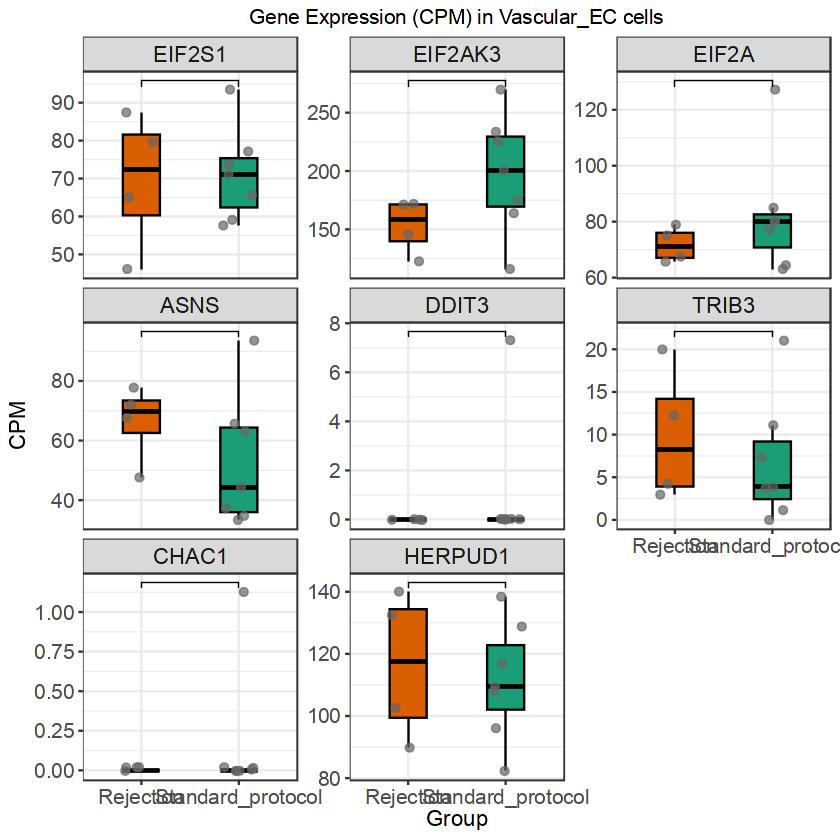

In [68]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "PERK_2/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("EIF2S1", "EIF2AK3", "EIF2A", "ASNS" , "DDIT3", "TRIB3", "CHAC1", "HERPUD1") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 8, height = 7
  )
}


Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(2.02158417860439, 2.26905084777928, 1.82232955068339, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.19457246917532, 1.44394144858681, 3.94838069314734, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0.150717223704338, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.01079208930219, 0.866364869152089, 0.506202652967608, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.275670569809689, 0.24753281975774, 0.60744318356113, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.05673718427048, 0.288788289717363, 0.202481061187043, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(2.29725474841408, 1.40268597862719, 1.51860795890282, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 9.66356305233302, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 84.4040498597742, 42.3101332769198, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 34.5289294880894, 0, 33.8224706831656, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 30.6923817671906, 0, 0, 32.989302040624, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 115.096431626965, 21.1550666384599, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 9.66356305233302, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 84.4040498597742, 42.3101332769198, :
“cannot compute exact p-value 

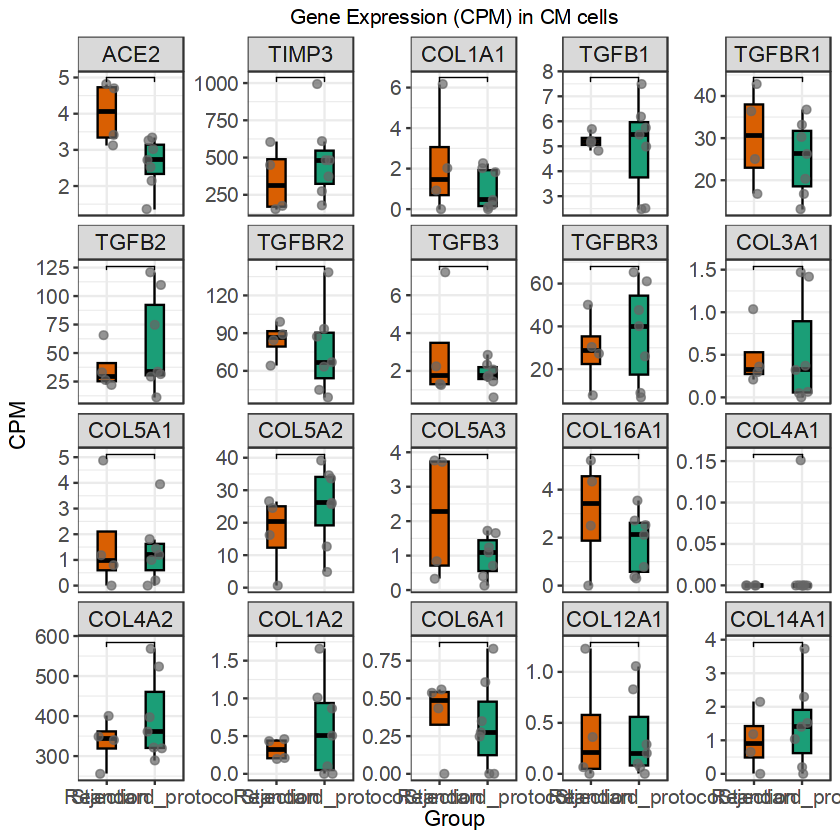

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 977.517106549365, 0, 588.581518540318, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 294.290759270159, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 488.758553274682, 0, 294.290759270159, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 488.758553274682, 0, 0, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 294.290759270159, 366.300366300366:
“cannot compute exact p-value with 

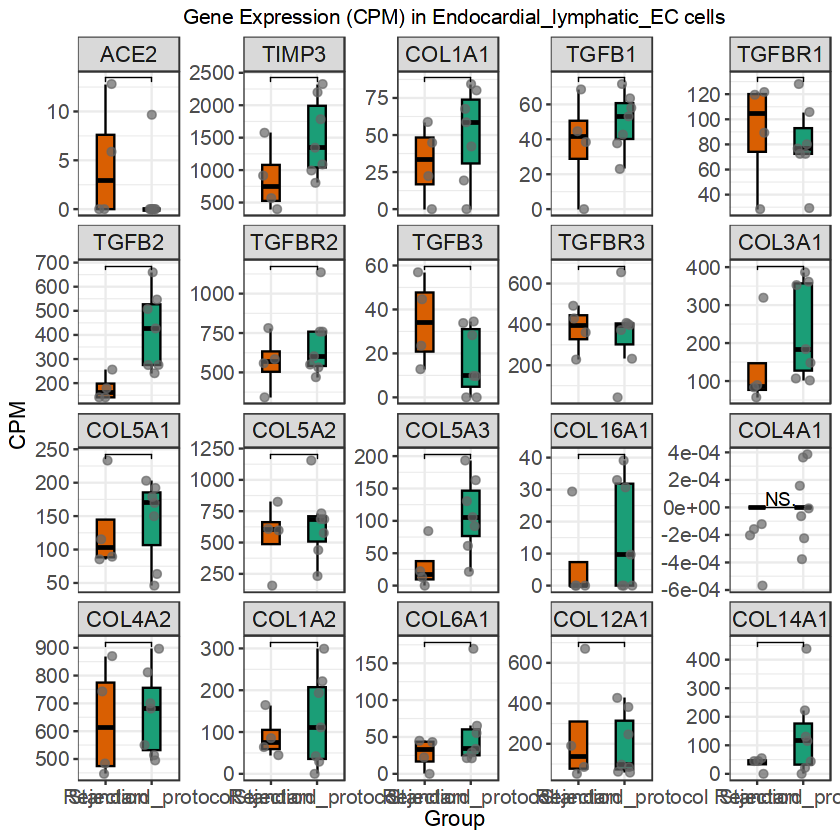

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 1.91662673694298, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 1.91662673694298, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”


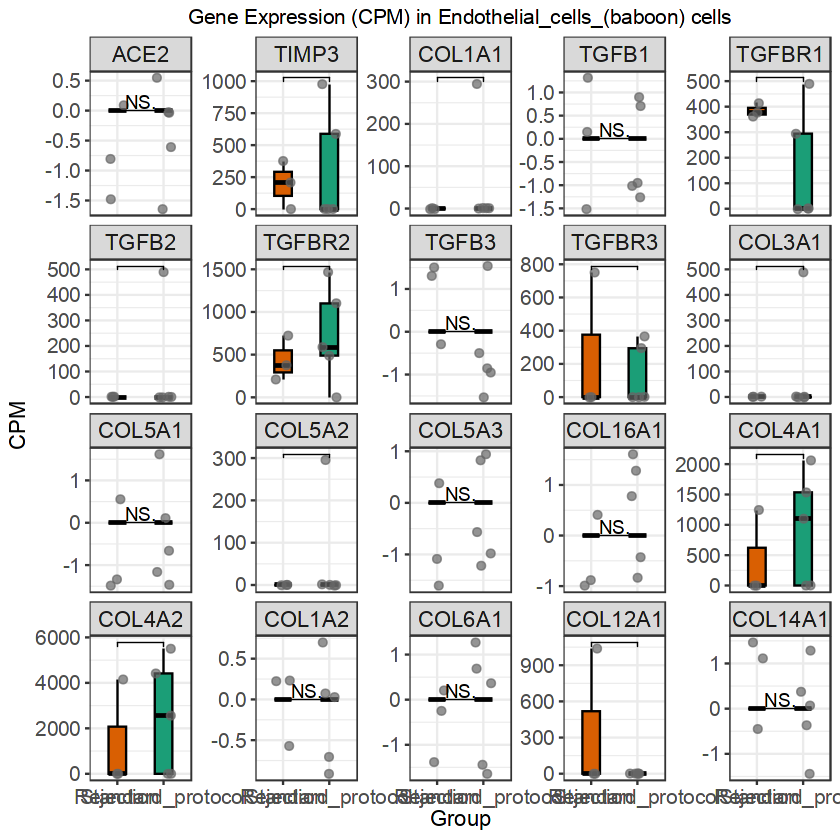

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.68317439388945, 0, 15.2519624191646, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 5.08398747305487, 0, 0, 23.2790930465349, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(11.3663487877789, 9.66800085078408, 15.2519624191646, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 5.08398747305487, 12.7086603165727, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 55.9238622036035, 38.1259809497182, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 15.2519624191646, 6.35433015828636, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(34.0990463633367, 9.66800085078408, 15.2519624191646

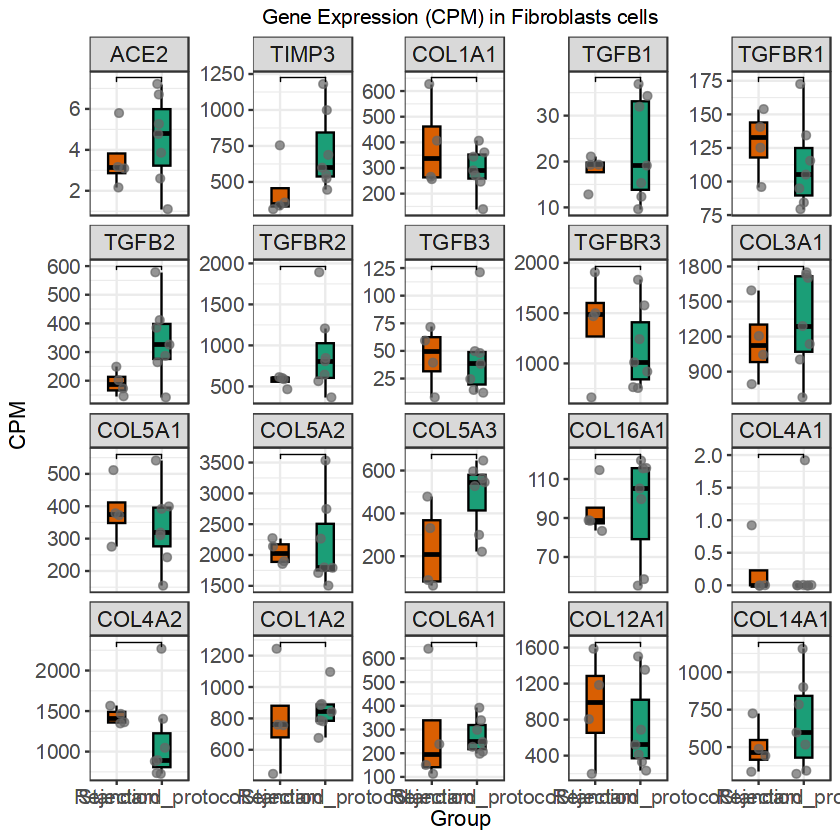

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 212.539851222104, 0, 0, 0), c(0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(113.256696302169, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 480.076812289966, 914.076782449726:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 637.619553666312, 0, 3360.53768602976, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 212.539851222104, 0, 0, 0), c(0, 0, :
“cannot compute exact p-value with tie

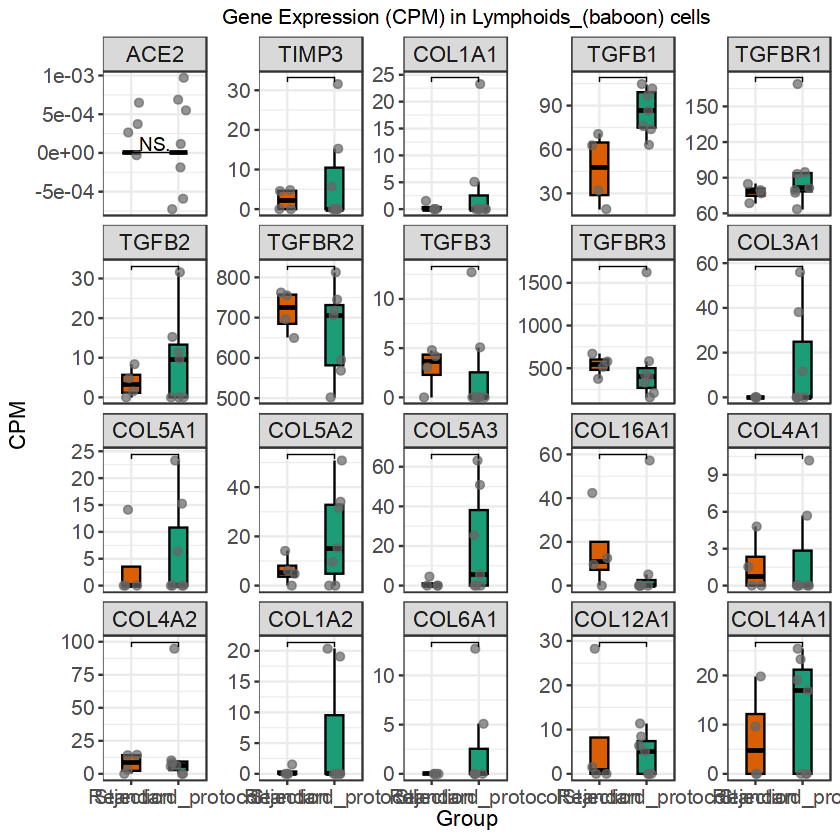

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(13.4121370899239, 8.65388775907577, 21.0736312676492, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 3.5526124135383, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(13.4121370899239, 8.65388775907577, 21.0736312676492, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 3.5526124135383, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”


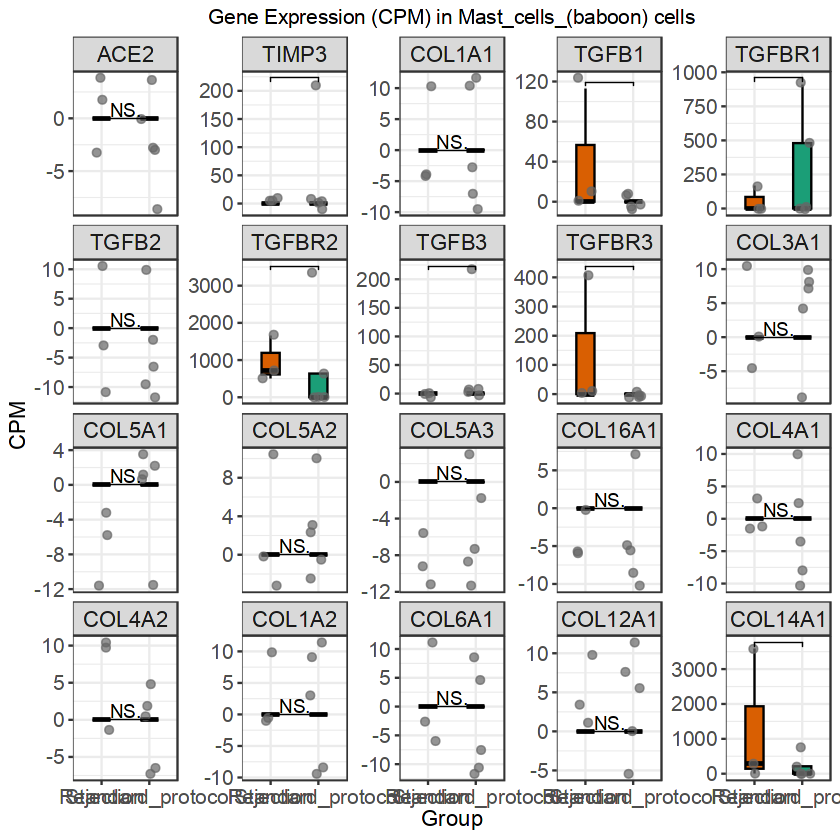

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 51.5015933305437, 0, 0, 1.68809420916162:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 2.36537469900607, 12.8753983326359, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 14.9552517502986, 2.36537469900607, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.16934783507713, 0, 4.73074939801214, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 2.13646453575694, 18.9229975920486, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 21.2883722910546, 19.3130974989539, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 18.9229975920486, 19.3130974989539, :
“cannot compute exact p-v

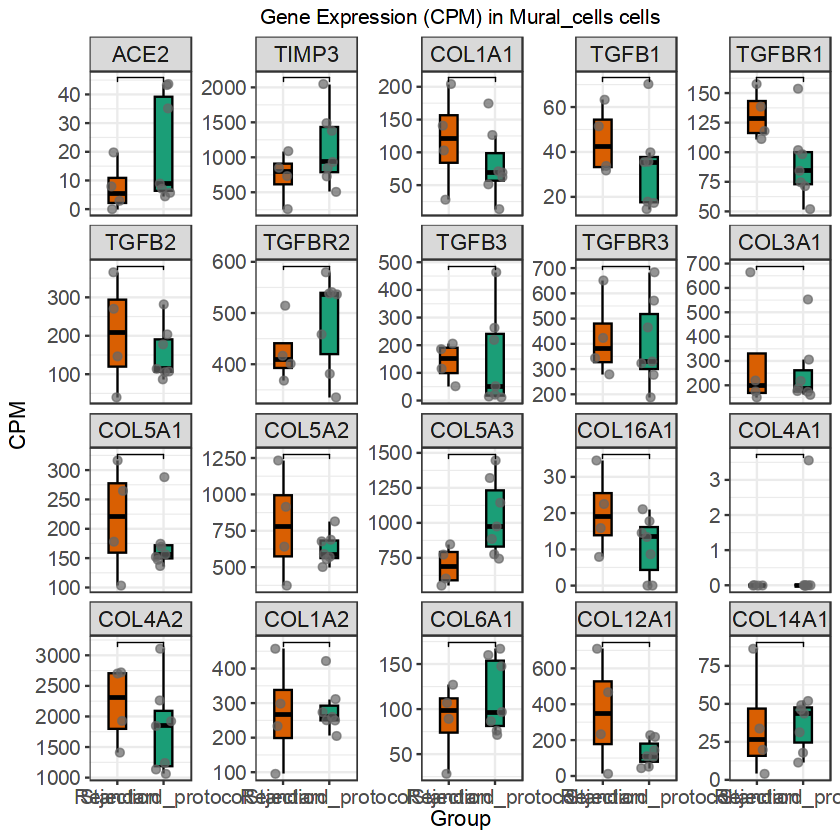

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(61.7703378837482, 0, 0, 0, 0, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 114.324911398194, 0, 93.7242258378946, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 17.1130315735433, 0, 0), c(0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 171.487367097291, 78.8519161015613, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 57.1624556990968, 39.4259580507806, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 39.4259580507806, 0, 17.1130315735433, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(216.196182593119, 57.1624556990968, 78.8519161015613, :
“cannot comput

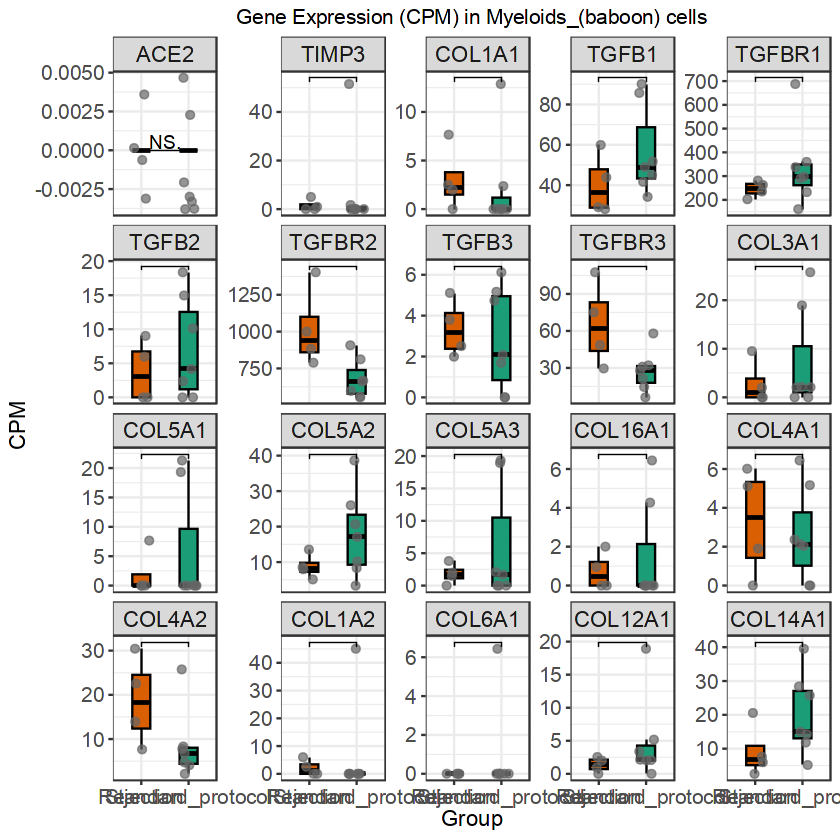

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 108.559952233621, 0, 0), c(0, 25.9309200290426:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(6.49561545956479, 51.8618400580853:
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 162.839928350432, 0, 0), c(71.4517700552127, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 377.073906485671), c(110.425462812601, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(3.2478077297824, 0), :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 325.679856700863, 678.42605156038, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0), c(0, 0), paired = FALSE):
“ca

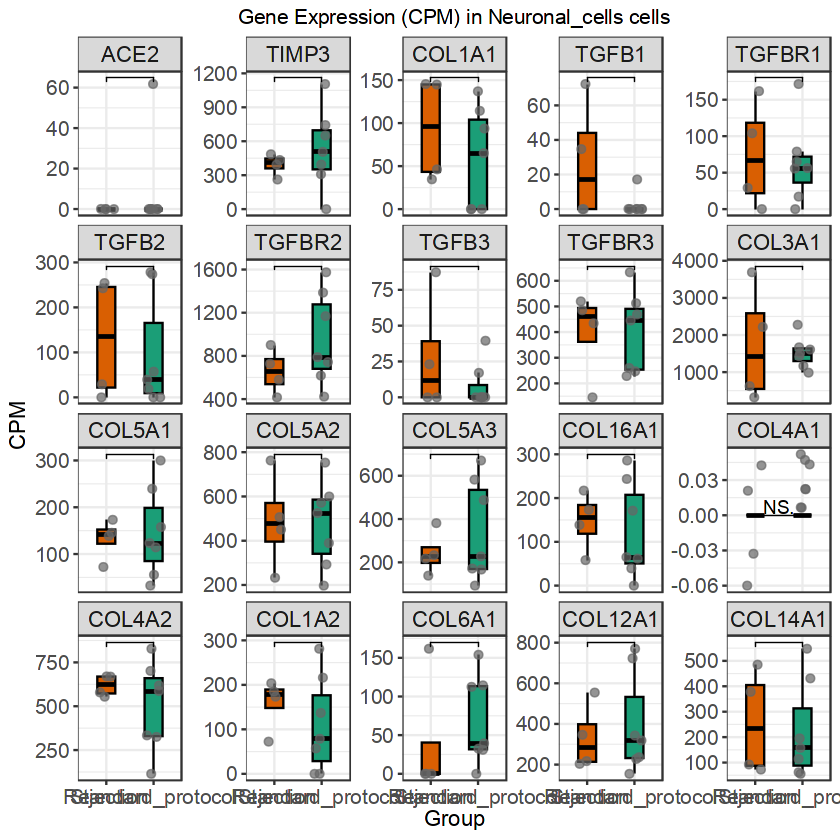

Genes found in CPM: ACE2 TIMP3 COL1A1 TGFB1 TGFBR1 TGFB2 TGFBR2 TGFB3 TGFBR3 COL3A1 COL5A1 COL5A2 COL5A3 COL16A1 COL4A1 COL4A2 COL1A2 COL6A1 COL12A1 COL14A1 
Genes not found in CPM:  


Warning message in wilcox.test.default(c(0, 7.48290156991275, 3.8580842296949, 3.38950113322321, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(3.50389107103438, 0, 11.5742526890847, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 7.48290156991275, 3.8580842296949, 3.38950113322321, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(3.50389107103438, 0, 11.5742526890847, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0), c(0, 0, 0, 0), paired = FALSE):
“cannot compute exact p-value with ties”


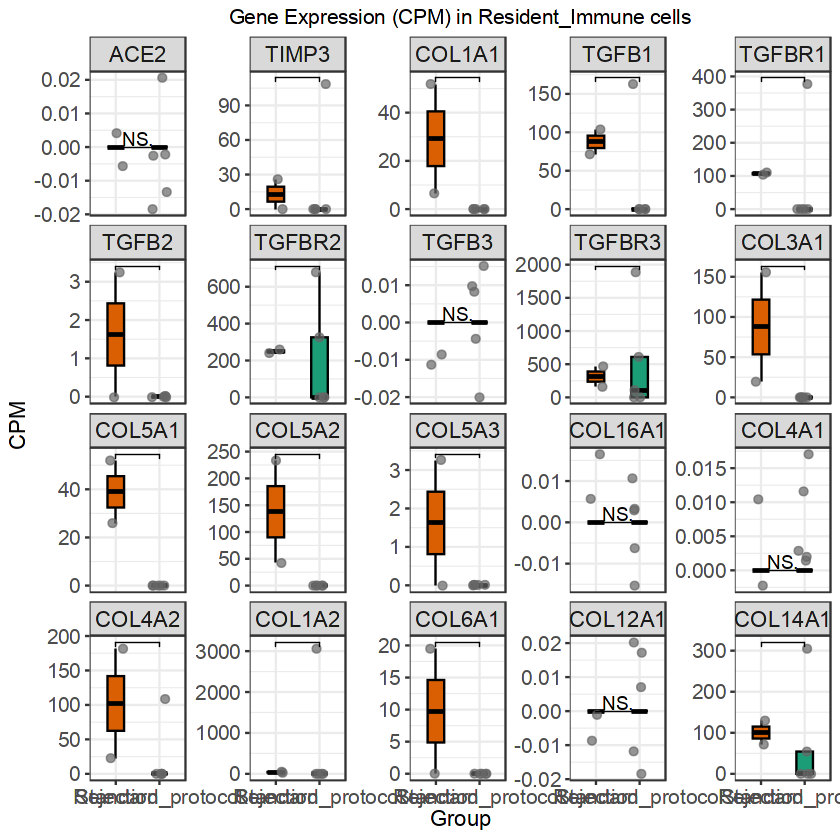

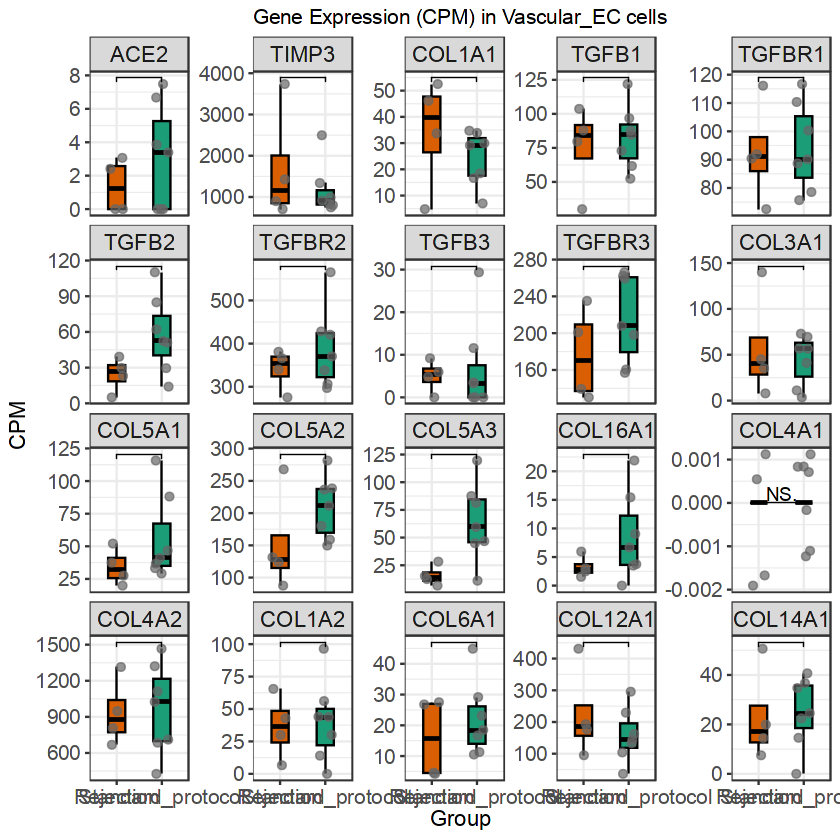

In [6]:
library(edgeR)
library(reshape2)
library(ggplot2)
library(ggpubr)

outdir_pp  <- "pseudobulk_by_celltype_Standard_protocol/"
outdir_rej <- "pseudobulk_by_celltype_Rejection/"
plotdir <- "Fibrosis/"
if (!dir.exists(plotdir)) dir.create(plotdir)

celltype_list_pp  <- list.files(outdir_pp, pattern = "_Standard_protocol_bysample.csv$")
celltype_list_rej <- list.files(outdir_rej, pattern = "_Rejection_bysample.csv$")

celltype_list <- intersect(
  gsub("^pseudobulk_(.*)_Standard_protocol_bysample.csv$", "\\1", celltype_list_pp),
  gsub("^pseudobulk_(.*)_Rejection_bysample.csv$", "\\1", celltype_list_rej)
)

genes_of_interest <- c("ACE2", "TIMP3","COL1A1", "TGFB1", "TGFBR1", "TGFB2", "TGFBR2", "TGFB3", "TGFBR3", "COL3A1", "COL5A1", "COL5A2", "COL5A3", "COL16A1", "COL4A1", "COL4A2", "COL1A2", "COL6A1", "COL12A1", "COL14A1") # Change as needed

for (celltype in celltype_list) {
  pseudo_pp <- read.csv(
    file.path(outdir_pp, paste0("pseudobulk_", celltype, "_Standard_protocol_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_pp) <- paste0(colnames(pseudo_pp), "_Standard_protocol")
  
  pseudo_rej <- read.csv(
    file.path(outdir_rej, paste0("pseudobulk_", celltype, "_Rejection_bysample.csv")),
    row.names = 1
  )
  colnames(pseudo_rej) <- paste0(colnames(pseudo_rej), "_Rejection")
  
  all_pseudo <- cbind(pseudo_pp, pseudo_rej)
  
  # CPM calculation
  pseudo_cpm <- cpm(as.matrix(all_pseudo))
  
  # Case-insensitive gene matching
  cpm_genes_upper <- toupper(rownames(pseudo_cpm))
  goi_upper <- toupper(genes_of_interest)
  match_idx <- match(goi_upper, cpm_genes_upper)
  genes_present_idx <- which(!is.na(match_idx))
  genes_present <- rownames(pseudo_cpm)[match_idx[genes_present_idx]]
  genes_missing <- genes_of_interest[is.na(match_idx)]
  
  cat("Genes found in CPM:", genes_present, "\n")
  cat("Genes not found in CPM:", genes_missing, "\n")
  
  if (length(genes_present) == 0) next
  
  # Subset CPM to genes present
  sub_cpm <- pseudo_cpm[genes_present, , drop = FALSE]
  
  # Long format for ggplot
  df_long <- melt(as.matrix(sub_cpm), varnames = c("gene", "sample"), value.name = "CPM")
  df_long$group <- ifelse(grepl("_Rejection$", df_long$sample), "Rejection",
                   ifelse(grepl("_Standard_protocol$", df_long$sample), "Standard_protocol", NA))
  df_long$sample_id <- gsub("(_Rejection|_Standard_protocol)$", "", df_long$sample)
  df_long <- df_long[!is.na(df_long$group), ]
  
  # Ensure all genes_of_interest are included as facet levels, even if empty
  df_long$gene <- factor(df_long$gene, levels = genes_of_interest)
  
  # Plot with Wilcoxon test (Mann-Whitney U)
  p <- ggplot(df_long, aes(x = group, y = CPM, fill = group)) +
    geom_boxplot(color = "black", outlier.shape = NA, width = 0.38) +
    geom_jitter(width = 0.17, size = 1.8, color = "gray40", alpha = 0.7) +
    facet_wrap(~gene, scales = "free_y") +
    scale_fill_manual(values = c("Standard_protocol" = "#1b9e77", "Rejection" = "#d95f02")) +
    labs(title = paste0("Gene Expression (CPM) in ", celltype, " cells"),
         x = "Group", y = "CPM") +
    theme_bw() +
    theme(
      legend.position = "none",
      strip.text = element_text(size = 13),
      axis.title = element_text(size = 13),
      axis.text = element_text(size = 12),
      plot.title = element_text(size = 12, lineheight = 1.1, hjust = 0.5)
    ) +
    stat_compare_means(method = "wilcox.test", 
                       comparisons = list(c("Standard_protocol", "Rejection")),
                       label = "p.signif",
                       hide.ns = TRUE)
  
  print(p)
  ggsave(
    filename = file.path(plotdir, paste0("gene_expression_", celltype, "_Rejection_vs_Standard.pdf")),
    plot = p, width = 12, height = 18
  )
}
